# TODO: Refactor this notebook 

In [4]:
import os
import pandas as pd
import shutil

# ---- Configuration ----
base_dir = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\new data results"
destination_dir = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images"  # folder to copy images to

# Make sure destination folder exists
os.makedirs(destination_dir, exist_ok=True)

# ---- Step 1: Collect qualifying images ----
all_data = []

for i in range(1, 9):
    folder = os.path.join(base_dir, f"w{i}", "CNT_analysis_tool")
    csv_path = os.path.join(folder, "image_level_averages.csv")

    if os.path.exists(csv_path):
        try:
            df = pd.read_csv(csv_path)
            if 'filename' in df.columns and 'num_cnts' in df.columns:
                filtered = df[df['num_cnts'] > 300][['filename', 'num_cnts']]
                filtered['wafer'] = f"w{i}"  # add wafer info
                all_data.append(filtered)
            else:
                print(f"⚠️ Missing required columns in {csv_path}")
        except Exception as e:
            print(f"❌ Error reading {csv_path}: {e}")
    else:
        print(f"📁 File not found: {csv_path}")

# ---- Step 2: Combine all results ----
if all_data:
    result_df = pd.concat(all_data, ignore_index=True)
else:
    print("⚠️ No valid CSV files found or no entries with num_cnts > 300.")
    result_df = pd.DataFrame(columns=['filename', 'num_cnts', 'wafer'])

# ---- Step 3: Copy qualifying images ----
copied_files = []
missing_files = []

for _, row in result_df.iterrows():
    wafer_folder = os.path.join(base_dir, row['wafer'], "CNT_analysis_tool")
    image_name = row['filename']

    src_path = os.path.join(wafer_folder, image_name)
    dst_path = os.path.join(destination_dir, image_name)

    if os.path.exists(src_path):
        try:
            shutil.copy2(src_path, dst_path)
            copied_files.append(image_name)
        except Exception as e:
            print(f"❌ Error copying {image_name}: {e}")
    else:
        missing_files.append(image_name)

# ---- Step 4: Save summary ----
# summary_path = os.path.join(destination_dir, "copied_images_summary.csv")
# result_df.to_csv(summary_path, index=False)

print(f"\n✅ Done! Copied {len(copied_files)} images to {destination_dir}")
if missing_files:
    print(f"⚠️ {len(missing_files)} images were not found.")
    print("Examples of missing images:", missing_files[:5])
# print(f"💾 Summary saved to: {summary_path}")



✅ Done! Copied 53 images to C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images


# Image processing pipeline to extract some feature (i tried some stuff)

Successfully loaded image with shape: (256, 256, 3)
HOG features extracted: 34596 dimensions


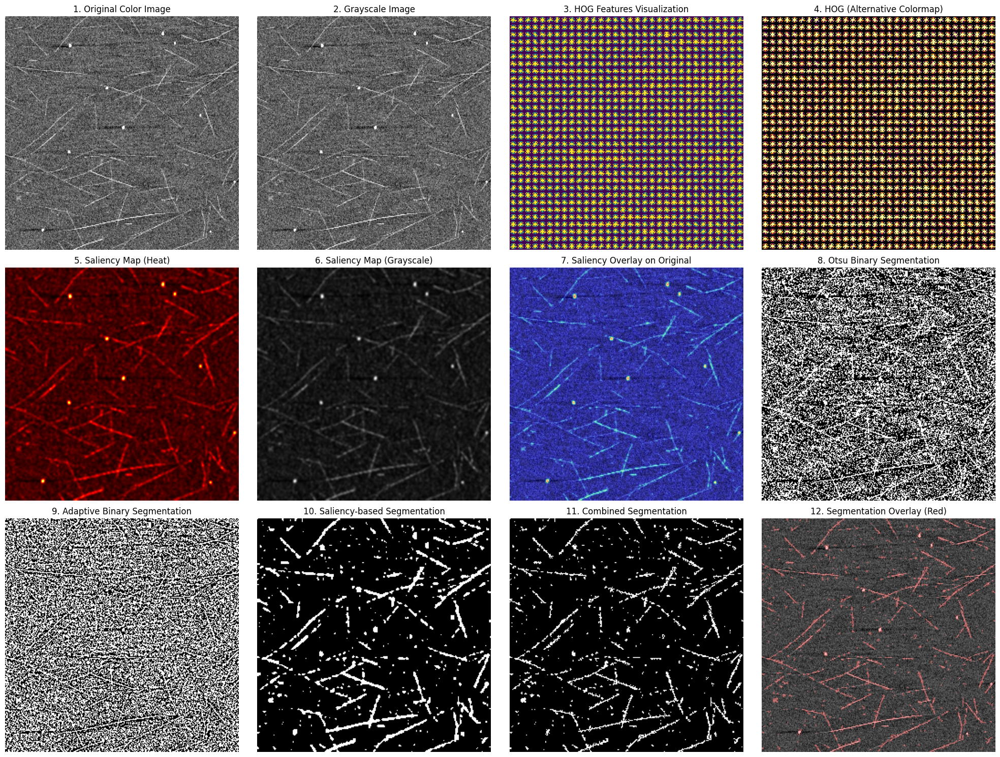


=== QUANTITATIVE RESULTS ===
Otsu threshold area: 27951 pixels
Saliency segmentation area: 6596 pixels
Combined segmentation area: 4636 pixels

Pipeline completed successfully!
Available results:  ['original', 'gray', 'hog_features', 'hog_image', 'saliency_map', 'binary_otsu', 'binary_adaptive', 'binary_saliency', 'combined_segmentation']


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
import os

def process_image_pipeline(image_path):
    """
    Complete image processing pipeline: HOG, saliency map, and segmentation
    """
    # Read the TIFF file
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} not found!")
        return None
    
    img = cv2.imread(image_path)
    if img is None:
        # Try alternative reading method for some TIFF formats
        img = cv2.imread(image_path, cv2.IMREAD_ANYCOLOR)
    if img is None:
        print(f"Error: Could not read {image_path} as image!")
        return None
        
    print(f"Successfully loaded image with shape: {img.shape}")
    
    # Convert to RGB for proper color display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Create visualization figure
    fig = plt.figure(figsize=(20, 15))
    
    # 1. Original Image
    plt.subplot(3, 4, 1)
    plt.imshow(img_rgb)
    plt.title('1. Original Color Image')
    plt.axis('off')
    
    # 2. Grayscale Image
    plt.subplot(3, 4, 2)
    plt.imshow(img_gray, cmap='gray')
    plt.title('2. Grayscale Image')
    plt.axis('off')
    
    # 3. Compute HOG features and visualization :cite[1]:cite[5]
    orientations = 9
    pixels_per_cell = (8, 8)
    cells_per_block = (2, 2)
    
    try:
        hog_features, hog_image = hog(img_gray, 
                                    orientations=orientations,
                                    pixels_per_cell=pixels_per_cell,
                                    cells_per_block=cells_per_block,
                                    visualize=True,
                                    block_norm='L2-Hys')
        
        # Enhance HOG visualization for better contrast :cite[1]
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        
        plt.subplot(3, 4, 3)
        plt.imshow(hog_image_rescaled, cmap='viridis')
        plt.title('3. HOG Features Visualization')
        plt.axis('off')
        
        plt.subplot(3, 4, 4)
        plt.imshow(hog_image_rescaled, cmap='inferno')
        plt.title('4. HOG (Alternative Colormap)')
        plt.axis('off')
        
        print(f"HOG features extracted: {len(hog_features)} dimensions")
        
    except Exception as e:
        print(f"Error in HOG computation: {e}")
        return None
    
    # 4. Compute Saliency Map using spectral residual approach :cite[2]:cite[6]
    saliency_map = compute_saliency_map(img_gray)
    
    plt.subplot(3, 4, 5)
    plt.imshow(saliency_map, cmap='hot')
    plt.title('5. Saliency Map (Heat)')
    plt.axis('off')
    
    plt.subplot(3, 4, 6)
    plt.imshow(saliency_map, cmap='gray')
    plt.title('6. Saliency Map (Grayscale)')
    plt.axis('off')
    
    # 5. Overlay saliency on original image
    plt.subplot(3, 4, 7)
    plt.imshow(img_rgb)
    plt.imshow(saliency_map, cmap='jet', alpha=0.5)
    plt.title('7. Saliency Overlay on Original')
    plt.axis('off')
    
    # 6. Image Binarization and Segmentation :cite[3]:cite[10]
    # Method 1: Otsu's thresholding
    _, binary_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    plt.subplot(3, 4, 8)
    plt.imshow(binary_otsu, cmap='gray')
    plt.title('8. Otsu Binary Segmentation')
    plt.axis('off')
    
    # Method 2: Adaptive thresholding :cite[3]
    binary_adaptive = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                          cv2.THRESH_BINARY, 11, 2)
    
    plt.subplot(3, 4, 9)
    plt.imshow(binary_adaptive, cmap='gray')
    plt.title('9. Adaptive Binary Segmentation')
    plt.axis('off')
    
    # Method 3: Saliency-based segmentation
    _, binary_saliency = cv2.threshold((saliency_map * 255).astype(np.uint8), 
                                     0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    plt.subplot(3, 4, 10)
    plt.imshow(binary_saliency, cmap='gray')
    plt.title('10. Saliency-based Segmentation')
    plt.axis('off')
    
    # 7. Combined segmentation (Otsu + Saliency)
    combined_segmentation = cv2.bitwise_and(binary_otsu, binary_saliency)
    
    plt.subplot(3, 4, 11)
    plt.imshow(combined_segmentation, cmap='gray')
    plt.title('11. Combined Segmentation')
    plt.axis('off')
    
    # 8. Overlay segmentation on original
    plt.subplot(3, 4, 12)
    plt.imshow(img_rgb)
    # Create colored segmentation overlay
    segmentation_overlay = np.zeros_like(img_rgb)
    segmentation_overlay[combined_segmentation > 0] = [255, 0, 0]  # Red color
    plt.imshow(segmentation_overlay, alpha=0.3)
    plt.title('12. Segmentation Overlay (Red)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print quantitative results
    print("\n=== QUANTITATIVE RESULTS ===")
    print(f"Otsu threshold area: {np.sum(binary_otsu > 0)} pixels")
    print(f"Saliency segmentation area: {np.sum(binary_saliency > 0)} pixels")
    print(f"Combined segmentation area: {np.sum(combined_segmentation > 0)} pixels")
    
    return {
        'original': img_rgb,
        'gray': img_gray,
        'hog_features': hog_features,
        'hog_image': hog_image_rescaled,
        'saliency_map': saliency_map,
        'binary_otsu': binary_otsu,
        'binary_adaptive': binary_adaptive,
        'binary_saliency': binary_saliency,
        'combined_segmentation': combined_segmentation
    }

def compute_saliency_map(gray_image):
    """
    Compute saliency map using spectral residual approach :cite[2]
    """
    # Convert to float32 for processing
    gray_float = np.float32(gray_image)
    
    # Compute Fourier transform
    f = np.fft.fft2(gray_float)
    fshift = np.fft.fftshift(f)
    
    # Compute log amplitude and phase
    magnitude = np.abs(fshift)
    phase = np.angle(fshift)
    
    # Compute spectral residual (simplified approach)
    log_amplitude = np.log(magnitude + 1e-10)  # Avoid log(0)
    
    # Average filter to get background
    avg_kernel = np.ones((3, 3), np.float32) / 9.0
    background = cv2.filter2D(log_amplitude, -1, avg_kernel)
    
    # Spectral residual
    spectral_residual = log_amplitude - background
    
    # Reconstruct saliency map
    saliency = np.abs(np.fft.ifft2(np.exp(spectral_residual + 1j * phase))) ** 2
    
    # Post-processing: Gaussian blur and normalization
    saliency = cv2.GaussianBlur(saliency, (5, 5), 0)
    
    # Normalize to [0, 1]
    saliency = (saliency - np.min(saliency)) / (np.max(saliency) - np.min(saliency) + 1e-10)
    
    return saliency

# Example usage
if __name__ == "__main__":
    # Replace with your TIFF file path
    image_path = "../../data/annotations_uniques/test/images/400-1293-23_3_0_20230307080848.tif"
    
    # Run the complete pipeline
    results = process_image_pipeline(image_path)
    
    if results is not None:
        print("\nPipeline completed successfully!")
        print("Available results: ", list(results.keys()))
    else:
        print("\nPipeline failed! Please check the error messages above.")

In [1]:
# Load the annotations
input_gt_json_path = '../../data/annotations_uniques/test/COCO_mask/annotations.json'
output_pred_json_path = '../../../Global_Outputs/edt_comparison/fluo_new_edt/predicted_annotations_poly.json'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.signal import find_peaks
import os


import json
import matplotlib.pyplot as plt
import tifffile as tiff
from pycocotools import mask as maskUtils
import numpy as np
import cv2
from sklearn import preprocessing as pre


# Introduction to the annotations
 Just checking here if the manual labels and tiff conversion are consistent with each other

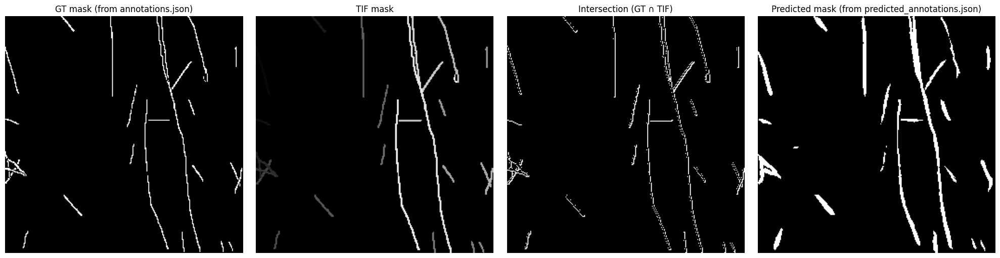

Pixels in GT annotations but missing in tif: 62
Pixels in tif but missing in GT annotations: 1271


In [4]:
# ---- Paths ----
input_gt_json_path = '../../data/annotations_uniques/test/COCO_mask/annotations.json'
output_pred_json_path = '../../../Global_Outputs/edt_comparison/fluo_new_edt/predicted_annotations_poly.json'
mask_path = "../../data/annotations_uniques/test/masks/400-1605-W8_map_00038_3.tif"

# ---- Load ground truth annotations ----
with open(input_gt_json_path, 'r') as f:
    coco_gt = json.load(f)

image_id_to_name = {img['id']: img['file_name'] for img in coco_gt['images']}
ann_by_image_gt = {}
for ann in coco_gt['annotations']:
    ann_by_image_gt.setdefault(ann['image_id'], []).append(ann)

# ---- Select the image ----
file_name = '400-1605-W8_map_00038_3.jpg'
image_id = [k for k,v in image_id_to_name.items() if v == file_name][0]

# ---- Load tif mask ----
mask_tif = tiff.imread(mask_path)
h, w = mask_tif.shape

# ---- Decode GT mask from annotations.json ----
mask_gt = np.zeros((h, w), dtype=bool)
for ann in ann_by_image_gt[image_id]:
    if len(ann['segmentation']) > 0:
        rle = maskUtils.frPyObjects(ann['segmentation'], h, w)
        decoded = maskUtils.decode(rle)
        if decoded.ndim == 3:  # multiple polygons
            decoded = np.any(decoded, axis=2)
        mask_gt |= decoded.astype(bool)

# ---- Intersection of tif and gt ----
intersection_mask = mask_gt & mask_tif.astype(bool)

# ---- Load predicted annotations ----
with open(output_pred_json_path, 'r') as f:
    coco_pred = json.load(f)

image_id_to_name_pred = {img['id']: img['file_name'] for img in coco_pred['images']}
ann_by_image_pred = {}
for ann in coco_pred['annotations']:
    ann_by_image_pred.setdefault(ann['image_id'], []).append(ann)

# ---- Get predicted mask for same file ----
image_id_pred = [k for k,v in image_id_to_name_pred.items() if v == file_name[:-4]][0]

mask_pred = np.zeros((h, w), dtype=bool)
for ann in ann_by_image_pred[image_id_pred]:
    if len(ann['segmentation']) > 0:
        rle = maskUtils.frPyObjects(ann['segmentation'], h, w)
        decoded = maskUtils.decode(rle)
        if decoded.ndim == 3:
            decoded = np.any(decoded, axis=2)
        mask_pred |= decoded.astype(bool)

# ---- Plotting ----
mismatch = mask_gt ^ mask_tif.astype(bool) 
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(mask_gt, cmap="gray")
axes[0].set_title("GT mask (from annotations.json)")
axes[0].axis("off")

axes[1].imshow(mask_tif, cmap="gray")
axes[1].set_title("TIF mask")
axes[1].axis("off")

axes[2].imshow(mismatch, cmap="gray")
axes[2].set_title("Intersection (GT ∩ TIF)")
axes[2].axis("off")

axes[3].imshow(mask_pred, cmap="gray")
axes[3].set_title("Predicted mask (from predicted_annotations.json)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

gt_missing_in_tif = mask_gt & ~mask_tif.astype(bool)

# Pixels present in tif but missing in GT annotations.json
tif_missing_in_gt = mask_tif.astype(bool) & ~mask_gt
n_gt_missing_in_tif = np.sum(gt_missing_in_tif)
n_tif_missing_in_gt = np.sum(tif_missing_in_gt)

print("Pixels in GT annotations but missing in tif:", n_gt_missing_in_tif)
print("Pixels in tif but missing in GT annotations:", n_tif_missing_in_gt)


# Proof of concept of CND team use-case
(Just a support :) )
## Goal: Compare our orientation/linedensity etraction to their method with FFT

Note: For low density more challenging, for mid and high expected to be more reliable

Method:
* masks as binary because we care about the patterns not their value here
* If low density, tiling the image to increase the periodicity of the patterns but introduces artifacts
* Compute standard magnitude and phase
* Extract Radial profile (for density) ---- because of symmetry no directionality, 0-180


We want to draw correlation between our predicted masks and their FFT feature extraction method.

Still few questions: 
- Do we extract the right density and orientation info from the signal?
- We have line density (count of CNTs per line), this get the density (frequency) of objects in the image at pixel level (objects/pixel).



Remark:
The radial profile is supposed to take into account the symmetry of the objects (see ppt slide 2 in the schematic). So this weights more the majority peak compared to the rest.

Density frequency: 0.0039 cycles/pixel
Main orientation: 90.0°
Alignment Index: 2.475
Order Parameter: 0.594
Dominant spacing: ~256.0 px  (~5.000 μm)  [pixel size ≈ 0.0195 μm/px]


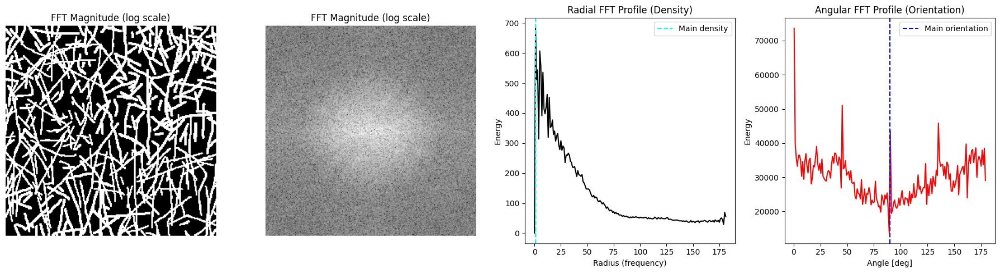

In [5]:

# ---- Load TIFF masks FROM GROUNDTRUTH ----
mask_path = "../../data/annotations_uniques/test/masks"

# mask_path = r"../../../../../data/annotations_filtered_artifacts/test/masks"
mask_filename = "400-1293-18_cd_c1k40r9_fl3_0sp9_0_image_right.tif"
mask_image_path = os.path.join(mask_path, mask_filename)
mask = tiff.imread(mask_image_path)
if mask.ndim == 3 and mask.shape[2] == 3:
    mask = mask.mean(axis=2)
if mask.ndim > 2:
    mask = mask[0]
mask = mask.astype(np.float32)
# we work on binary masks here, we don't care about intensity for orientation and length
# also keeping intensity info cahnges the FFT  results, as not needed we binarize
mask = (mask > 0).astype(np.uint8)

##############################################
#########        ADAPTATION  ############
##############################################
# To work on predicted masks from stardist,
# need to create an array of masks (we loose the intersection info here but we don't care)
# ---- Load mask masks from prediction ----
#
#
#
#
#
#

##############################################
#########        OPTIONAL TILING  ############
##############################################
# FT works with periodicity. One single image has few CNTs so one way is to tile the image 
# to increase the periodicity of the patterns but introduces artifacts 
# so ... Trade off between tiling to get robust results and artifacts

# mask = np.tile(mask, (tile_factor, tile_factor))

# # ---- Optional Hann window ---- 
# filtering method you could try another one if it makes results better

# if apply_window:
#     wy = np.hanning(mask_tiled.shape[0])
#     wx = np.hanning(mask_tiled.shape[1])
#     window = np.outer(wy, wx)
#     mask_tiled *= window


# ---- FFT ----
f = np.fft.fft2(mask)
fshift = np.fft.fftshift(f)
fshift[mask.shape[0]//2, mask.shape[1]//2] = 0
magnitude = np.abs(fshift)

h, w = mask.shape
cy, cx = h//2, w//2

# ---- Polar coordinates ----
Y, X = np.indices((h, w))
R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
theta = np.arctan2(Y-cy, X-cx)
theta_deg = (np.rad2deg(theta) % 180)  # symmetry

# ---- Radial profile (for density) ----
radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
r = np.arange(len(radial_profile))

peaks, _ = find_peaks(radial_profile, distance=5)
if len(peaks) > 0:
    main_r = peaks[0]
    density_freq = main_r / w  # cycles per pixel
else:
    main_r = None
    density_freq = None

# ---- Angular profile (for orientation) ----
angular_bins = 180
hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
orientation_angle = edges[np.argmax(hist)]
orientation_angle = (orientation_angle + 90) % 180



###################################
# We don't care it's chatGPT
###################################
# ---- Alignment Index ----
alignment_index = np.max(hist) / np.mean(hist)

# ---- Order Parameter ----
if main_r:
    P_peak = radial_profile[main_r]
    mask_bg = (r > main_r + 10) & (r < len(r)//2)
    P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
    order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
else:
    order_parameter = None

# ---- Print results ----
print(f"Density frequency: {density_freq:.4f} cycles/pixel" if density_freq else "Density not detected")
print(f"Main orientation: {orientation_angle:.1f}°")
print(f"Alignment Index: {alignment_index:.3f}")
print(f"Order Parameter: {order_parameter:.3f}" if order_parameter is not None else "Order Parameter not detected")

# --- choose the strongest radial peak, not just the first ---
peaks, _ = find_peaks(radial_profile, distance=5)
if len(peaks) > 0:
    main_r = peaks[np.argmax(radial_profile[peaks])]  # <-- strongest peak
else:
    main_r = None

# --- compute density frequency (cycles/pixel) ---
if main_r is not None:
    # NOTE: this normalization assumes a square image; for generality see the “more precise” option below
    density_freq_cyc_per_px = main_r / w
else:
    density_freq_cyc_per_px = None

# --- spacing in pixels and micrometers ---
field_um_x, field_um_y = 5.0, 5.0  # your AFM field size (μm); adjust if different
px_size_um_x = field_um_x / w
px_size_um_y = field_um_y / h
px_size_um = 0.5 * (px_size_um_x + px_size_um_y)  # average (OK for square pixels)

if density_freq_cyc_per_px and density_freq_cyc_per_px > 0:
    spacing_px = 1.0 / density_freq_cyc_per_px               # pixels per period
    spacing_um = spacing_px * px_size_um                      # μm per period
    print(
        f"Dominant spacing: ~{spacing_px:.1f} px  (~{spacing_um:.3f} μm)  "
        f"[pixel size ≈ {px_size_um:.4f} μm/px]"
    )
else:
    print("Dominant spacing: not detected (no clear radial peak)")


# ---- Visualization ----
fig, axes = plt.subplots(1, 4, figsize=(18, 5))

# Masks
axes[0].imshow(mask, cmap="gray")
axes[0].set_title("FFT Magnitude (log scale)")
axes[0].axis("off")

# FFT magnitude
axes[1].imshow(np.log1p(magnitude), cmap="gray")
axes[1].set_title("FFT Magnitude (log scale)")
axes[1].axis("off")

# Radial profile
axes[2].plot(r, radial_profile, color="black")
if main_r:
    axes[2].axvline(main_r, color="cyan", linestyle="--", label="Main density")
axes[2].set_title("Radial FFT Profile (Density)")
axes[2].set_xlabel("Radius (frequency)")
axes[2].set_ylabel("Energy")
axes[2].legend()

# Angular profile
centers = 0.5 * (edges[:-1] + edges[1:])
axes[3].plot(centers, hist, color="red")
axes[3].axvline(orientation_angle, color="blue", linestyle="--", label="Main orientation")
axes[3].set_title("Angular FFT Profile (Orientation)")
axes[3].set_xlabel("Angle [deg]")
axes[3].set_ylabel("Energy")
axes[3].legend()

plt.tight_layout()
plt.show()


In [6]:
# ---- Load TIFF masks FROM GROUNDTRUTH ----
mask_path = "../../data/annotations_uniques/test/images"

# mask_path = r"../../../../../daa/annotations_filtered_artifacts/test/masks"
mask_filename = "test.tif"
mask_image_path = os.path.join(mask_path, mask_filename)
mask = tiff.imread(mask_image_path)

# ---- PREPROCESSING PIPELINE ----
def preprocess_mask(mask):
    """Apply preprocessing to enhance FFT results"""
    # Convert to grayscale if needed
    if mask.ndim == 3 and mask.shape[2] == 3:
        mask = mask.mean(axis=2)
    if mask.ndim > 2:
        mask = mask[0]
    
    # Convert to float32 for processing
    mask = mask.astype(np.float32)

    # 1. Normalize intensity to [0, 1] range using MinMaxScaler
    scaler = pre.MinMaxScaler()
    mask_normalized = scaler.fit_transform(mask.reshape(-1, 1)).reshape(mask.shape)

    return mask_normalized

# Example usage:
mask_processed = preprocess_mask(mask)

# ---- FFT ----
mask_processed = mask_processed - np.mean(mask_processed)
f = np.fft.fft2(mask_processed)
fshift = np.fft.fftshift(f)
fshift[mask_processed.shape[0]//2, mask_processed.shape[1]//2] = 0
magnitude = np.abs(fshift)

h, w = mask_processed.shape
cy, cx = h//2, w//2

# ---- FIXED: Polar coordinates with proper Cartesian system ----
Y, X = np.indices((h, w))
# Invert Y axis to match Cartesian coordinates (y increases upward)
Y_cartesian = h - 1 - Y  # This converts image coordinates to Cartesian
R = np.sqrt((X-cx)**2 + (Y_cartesian-cy)**2).astype(int)
theta = np.arctan2(Y_cartesian-cy, X-cx)  # Now this gives proper Cartesian angles
theta_deg = (np.rad2deg(theta) % 180)  # symmetry

# ---- Radial profile (for density) ----
radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
r = np.arange(len(radial_profile))

peaks, _ = find_peaks(radial_profile, distance=5)
if len(peaks) > 0:
    main_r = peaks[0]
    density_freq = main_r / w  # cycles per pixel
else:
    main_r = None
    density_freq = None

# ---- Angular profile (for orientation) ----
angular_bins = 180
hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
orientation_angle = edges[np.argmax(hist)]

# FIXED: No need to add 90 degrees since we're using proper Cartesian coordinates
orientation_angle = (orientation_angle + 90) % 180 

###################################
# We don't care it's chatGPT
###################################
# ---- Alignment Index ----
alignment_index = np.max(hist) / np.mean(hist)

# ---- Order Parameter ----
if main_r:
    P_peak = radial_profile[main_r]
    mask_bg = (r > main_r + 10) & (r < len(r)//2)
    P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
    order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
else:
    order_parameter = None

# ---- Print results ----
print(f"Density frequency: {density_freq:.4f} cycles/pixel" if density_freq else "Density not detected")
print(f"Main orientation: {orientation_angle:.1f}°")
print(f"Alignment Index: {alignment_index:.3f}")
print(f"Order Parameter: {order_parameter:.3f}" if order_parameter is not None else "Order Parameter not detected")

# --- choose the strongest radial peak, not just the first ---
peaks, _ = find_peaks(radial_profile, distance=5)
if len(peaks) > 0:
    main_r = peaks[np.argmax(radial_profile[peaks])]  # <-- strongest peak
else:
    main_r = None

# --- compute density frequency (cycles/pixel) ---
field_um_x, field_um_y = 5.0, 5.0  # your AFM field size (μm); adjust if different
px_size_um_x = field_um_x / w
px_size_um_y = field_um_y / h
px_size_um = 0.5 * (px_size_um_x + px_size_um_y)  # average (OK for square pixels)

if main_r and main_r > 0:
    density_freq_cyc_per_px = main_r / w
    spacing_px = 1.0 / density_freq_cyc_per_px               # pixels per period
    spacing_um = spacing_px * px_size_um                      # μm per period
    print(
        f"Dominant spacing: ~{spacing_px:.1f} px  (~{spacing_um:.3f} μm)  "
        f"[pixel size ≈ {px_size_um:.4f} μm/px]"
    )
else:
    print("Dominant spacing: not detected (no clear radial peak)")

# ---- Visualization ----
fig, axes = plt.subplots(1, 6, figsize=(26, 5))

# Original mask
axes[0].imshow(mask, cmap="gray")
axes[0].set_title("Original Mask")
axes[0].axis("off")

# Preprocessed mask
axes[1].imshow(mask_processed)
axes[1].set_title("Preprocessed Mask")
axes[1].axis("off")

# FFT magnitude
axes[2].imshow(np.log1p(magnitude))
axes[2].set_title("FFT Magnitude (log scale)")
axes[2].axis("off")

# Radial profile
axes[3].plot(r, radial_profile, color="black")
if main_r:
    axes[3].axvline(main_r, color="cyan", linestyle="--", label="Main density")
axes[3].set_title("Radial FFT Profile (Density)")
axes[3].set_xlabel("Radius (frequency)")
axes[3].set_ylabel("Energy")
axes[3].legend()

# Angular profile
centers = 0.5 * (edges[:-1] + edges[1:])
axes[4].plot(centers, hist, color="red")
axes[4].axvline(orientation_angle, color="blue", linestyle="--", label="Main orientation")
axes[4].set_title("Angular FFT Profile (Orientation)")
axes[4].set_xlabel("Angle [deg]")
axes[4].set_ylabel("Energy")
axes[4].legend()

# Orientation visualization on mask
axes[5].imshow(mask_processed, cmap="gray")
axes[5].set_title("Orientation Lines")
axes[5].axis("off")

# FIXED: Calculate line endpoints using proper coordinate system conversion
center_y, center_x = h // 2, w // 2
length = min(h, w) * 0.4  # Line length

# Convert angle to radians - this is now in proper Cartesian coordinates
angle_rad = np.radians(orientation_angle)
ortho_angle_rad = angle_rad + np.pi/2  # Orthogonal angle

# FIXED: Convert Cartesian coordinates to image coordinates for plotting
# In image coordinates, y increases downward, so we need to invert the y-component
def cartesian_to_image(x_cart, y_cart, img_height):
    """Convert Cartesian coordinates to image coordinates"""
    return x_cart, img_height - 1 - y_cart

# Calculate endpoints in Cartesian coordinates
end_x_cart = center_x + length * np.cos(angle_rad)
end_y_cart = center_y + length * np.sin(angle_rad)
start_x_cart = center_x - length * np.cos(angle_rad)
start_y_cart = center_y - length * np.sin(angle_rad)

# Calculate orthogonal endpoints in Cartesian coordinates
ortho_end_x_cart = center_x + length * np.cos(ortho_angle_rad)
ortho_end_y_cart = center_y + length * np.sin(ortho_angle_rad)
ortho_start_x_cart = center_x - length * np.cos(ortho_angle_rad)
ortho_start_y_cart = center_y - length * np.sin(ortho_angle_rad)

# Convert all points to image coordinates for plotting
start_x, start_y = cartesian_to_image(start_x_cart, start_y_cart, h)
end_x, end_y = cartesian_to_image(end_x_cart, end_y_cart, h)
ortho_start_x, ortho_start_y = cartesian_to_image(ortho_start_x_cart, ortho_start_y_cart, h)
ortho_end_x, ortho_end_y = cartesian_to_image(ortho_end_x_cart, ortho_end_y_cart, h)

# Plot the lines
axes[5].plot([start_x, end_x], [start_y, end_y], 'r-', linewidth=2, label=f'Main orientation ({orientation_angle:.1f}°)')
axes[5].plot([ortho_start_x, ortho_end_x], [ortho_start_y, ortho_end_y], 'g-', linewidth=2, label='Orthogonal')
axes[5].legend()

plt.tight_layout()
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\abd93000\\PycharmProjects\\cnt_project_v2\\testing\\data\\annotations_uniques\\test\\images\\test.tif'

# testing it with fabricated image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# ---- Generate synthetic image with diagonal lines ----
image_size = 256
num_lines = 8
line_width = 5  # thickness of the diagonal lines

# Create blank image
mask = np.zeros((image_size, image_size), dtype=np.uint8)

# Calculate spacing between diagonals
spacing = image_size // num_lines

# Draw diagonal lines at 45° (from bottom-left to top-right)
for i in range(-image_size, image_size, spacing):
    for w in range(-line_width // 2, line_width // 2 + 1):
        # Shifted coordinates for thickness
        y = np.arange(image_size)
        x = y - i - w
        valid = (x >= 0) & (x < image_size)
        mask[y[valid], x[valid].astype(int)] = 1

print(f"Generated image with {num_lines} diagonal lines (45°) and width {line_width}px")
print(f"Line spacing: {spacing} pixels")

# ---- FFT ----
f = np.fft.fft2(mask)
fshift = np.fft.fftshift(f)
fshift[mask.shape[0]//2, mask.shape[1]//2] = 0
magnitude = np.abs(fshift)

h, w = mask.shape
cy, cx = h//2, w//2

# ---- Polar coordinates ----
Y, X = np.indices((h, w))
R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
theta = np.arctan2(Y-cy, X-cx)
theta_deg = (np.rad2deg(theta) % 180)

# ---- Radial profile ----
radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
r = np.arange(len(radial_profile))

peaks, _ = find_peaks(radial_profile, distance=5)
main_r = peaks[np.argmax(radial_profile[peaks])] if len(peaks) > 0 else None
density_freq = main_r / w if main_r is not None else None

# ---- Angular profile ----
angular_bins = 180
hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
orientation_angle = edges[np.argmax(hist)]
orientation_angle = (orientation_angle + 90) % 180

# ---- Alignment Index ----
alignment_index = np.max(hist) / np.mean(hist)

# ---- Order Parameter ----
if main_r:
    P_peak = radial_profile[main_r]
    mask_bg = (r > main_r + 10) & (r < len(r)//2)
    P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
    order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
else:
    order_parameter = None

# ---- Print results ----
print(f"Density frequency: {density_freq:.4f} cycles/pixel" if density_freq else "Density not detected")
print(f"Main orientation: {orientation_angle:.1f}°")
print(f"Alignment Index: {alignment_index:.3f}")
print(f"Order Parameter: {order_parameter:.3f}" if order_parameter is not None else "Order Parameter not detected")

# ---- Visualization ----
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(mask, cmap="gray")
axes[0].set_title(f"Synthetic Image ({num_lines} diagonal lines, 45°, width={line_width}px)")
axes[0].axis("off")

axes[1].imshow(np.log1p(magnitude), cmap="gray")
axes[1].set_title("FFT Magnitude (log scale)")
axes[1].axis("off")

axes[2].plot(r, radial_profile, color="black")
if main_r:
    axes[2].axvline(main_r, color="cyan", linestyle="--", label="Main density")
axes[2].set_title("Radial FFT Profile (Density)")
axes[2].set_xlabel("Radius (frequency)")
axes[2].set_ylabel("Energy")
axes[2].legend()

centers = 0.5 * (edges[:-1] + edges[1:])
axes[3].plot(centers, hist, color="red")
axes[3].axvline(orientation_angle, color="blue", linestyle="--", label="Main orientation")
axes[3].set_title("Angular FFT Profile (Orientation)")
axes[3].set_xlabel("Angle [deg]")
axes[3].set_ylabel("Energy")
axes[3].legend()

plt.tight_layout()
plt.show()


# Visalizing the von misess distubution based on results in the csv object level

Found 53 unique images


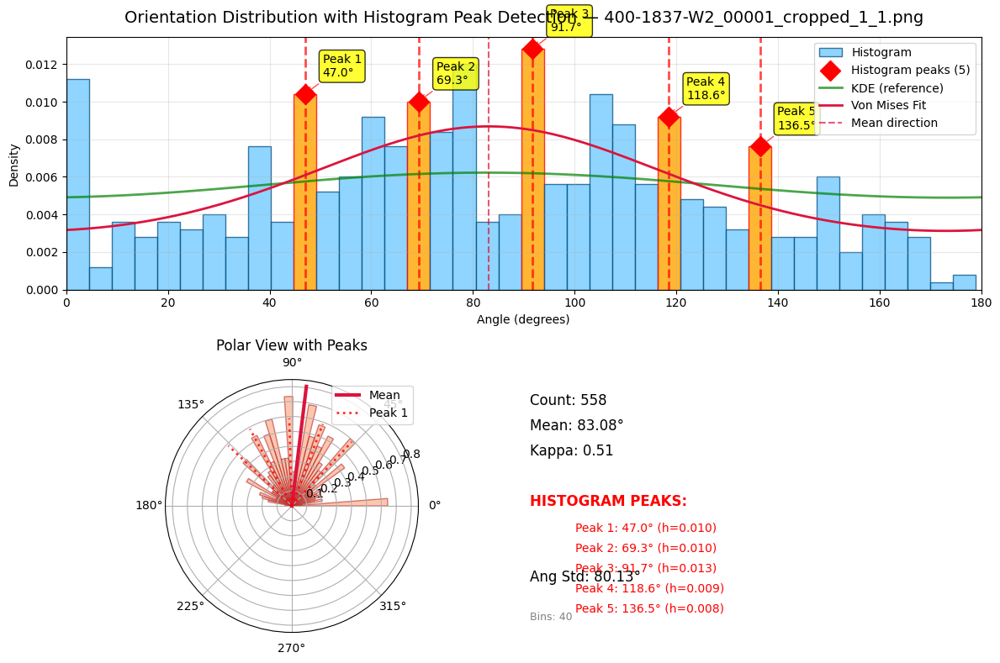

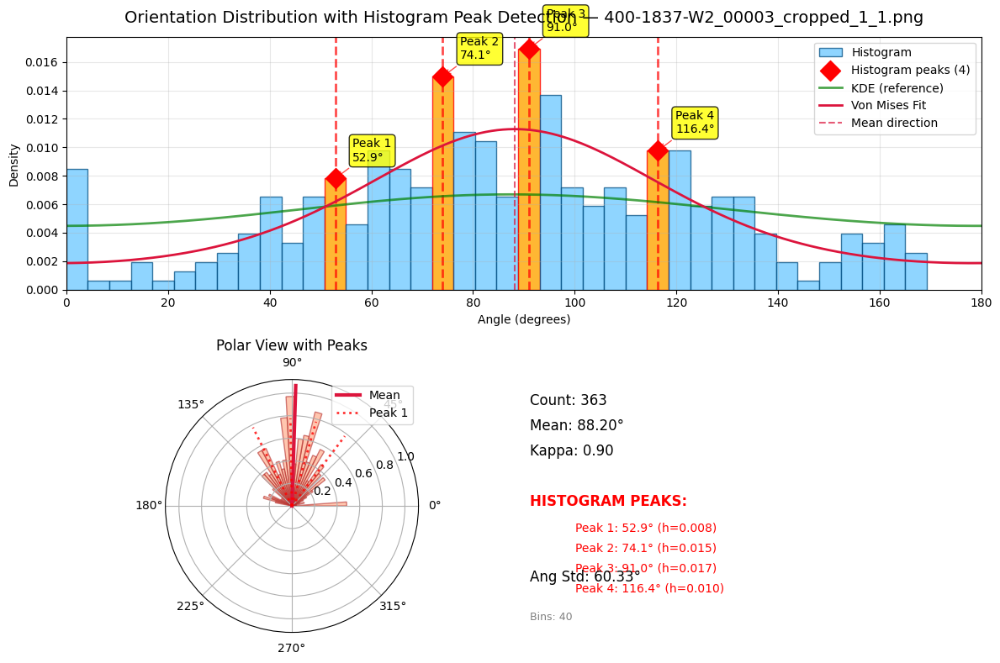

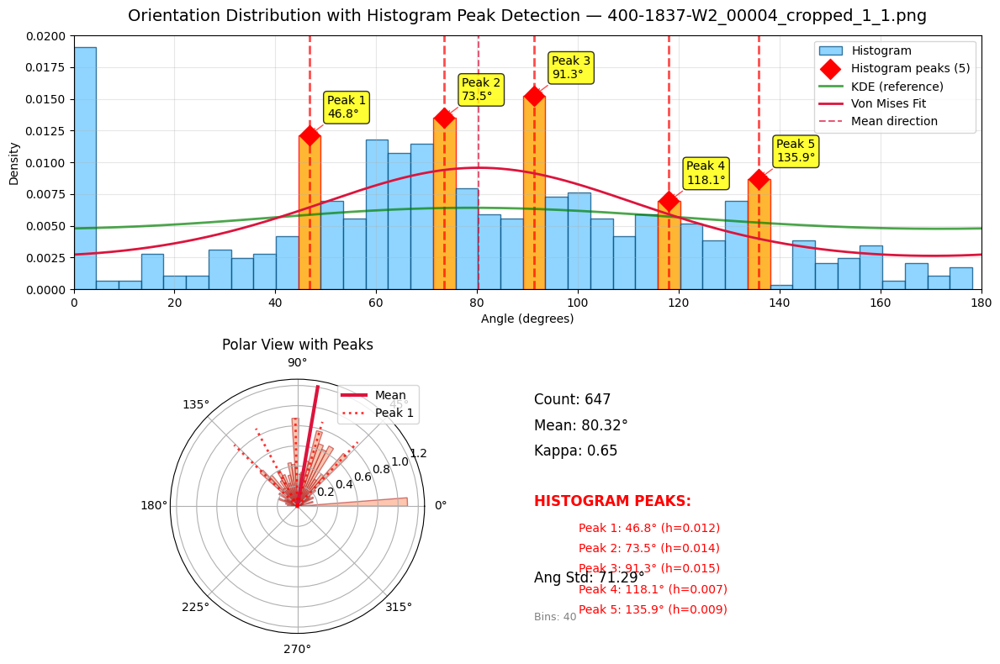

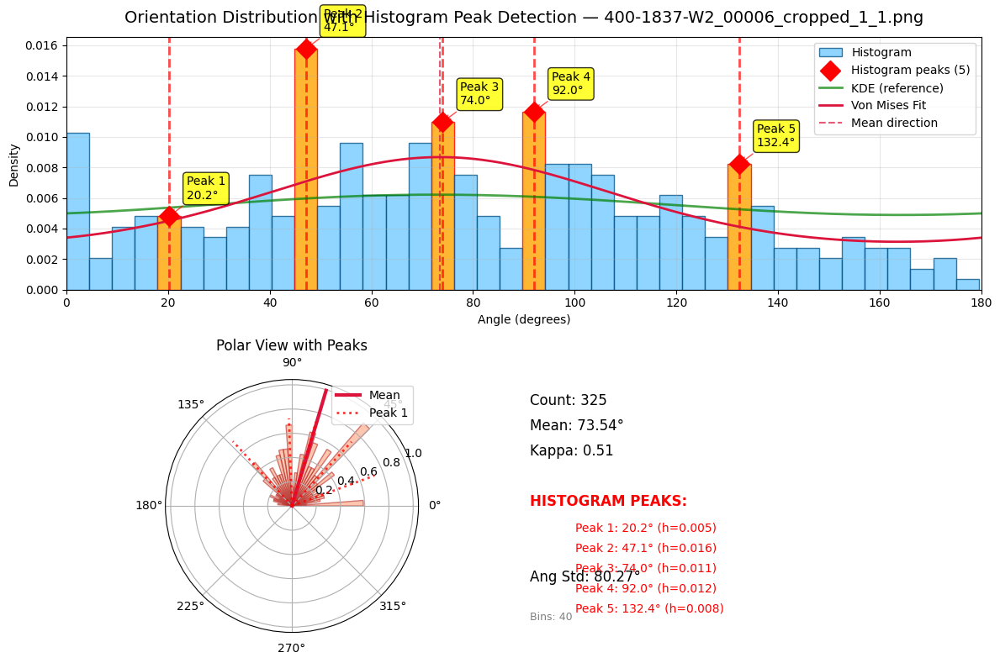

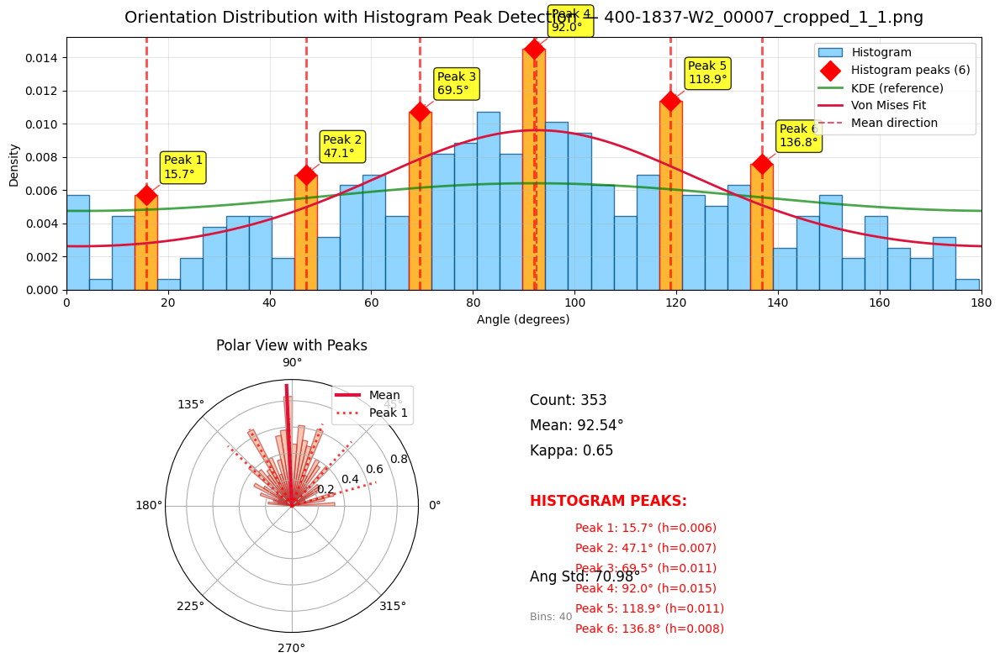

...

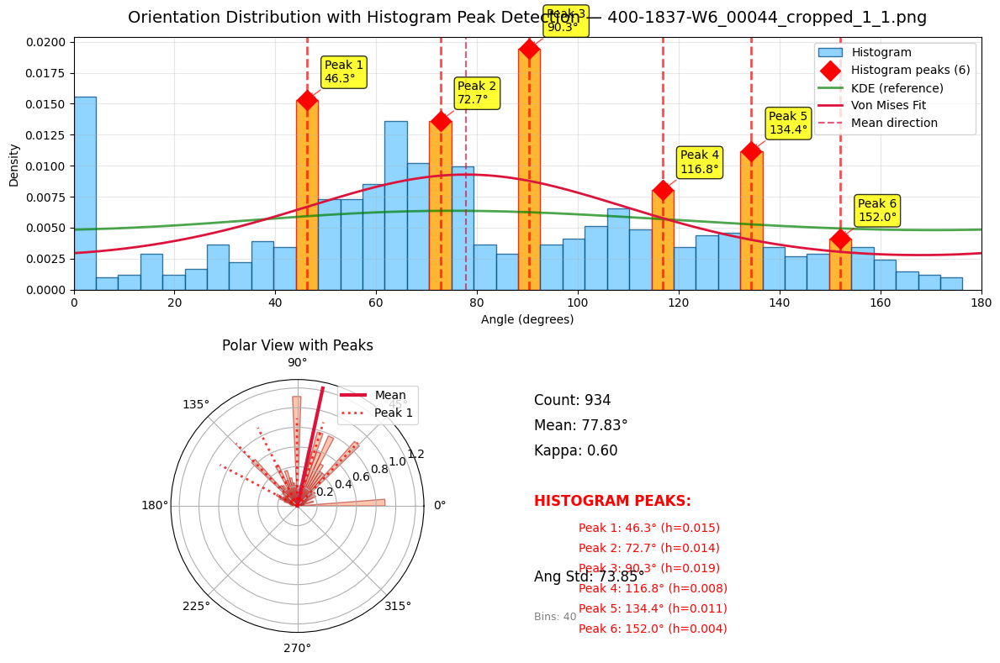

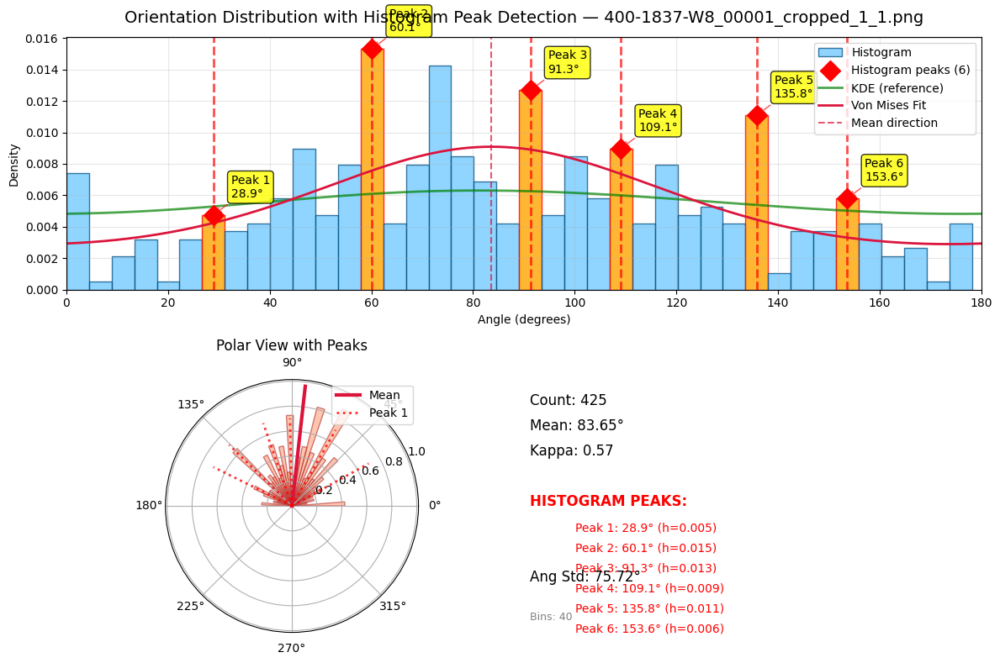

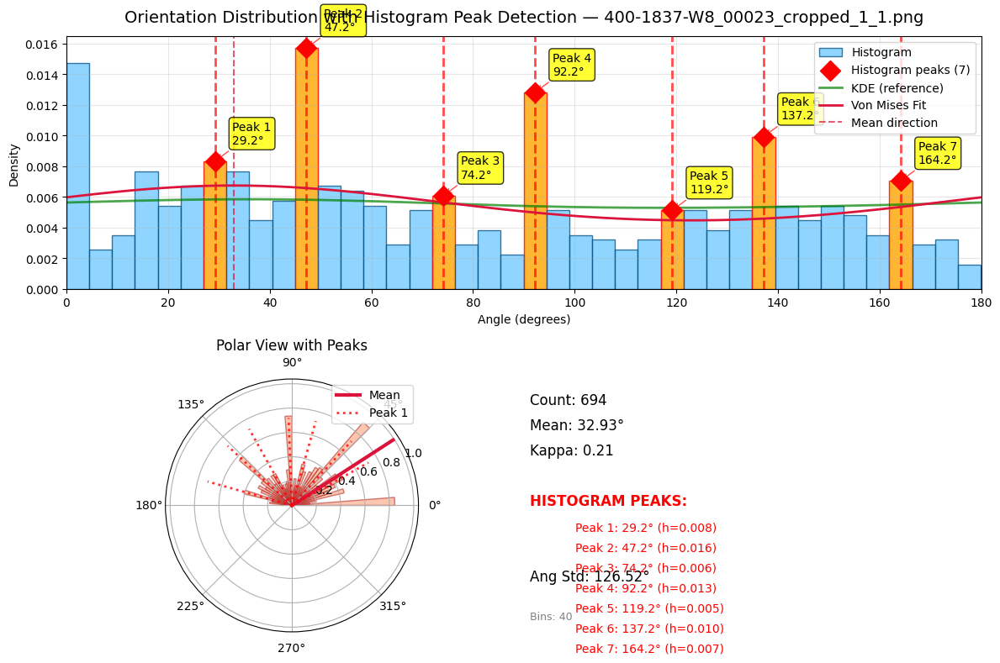

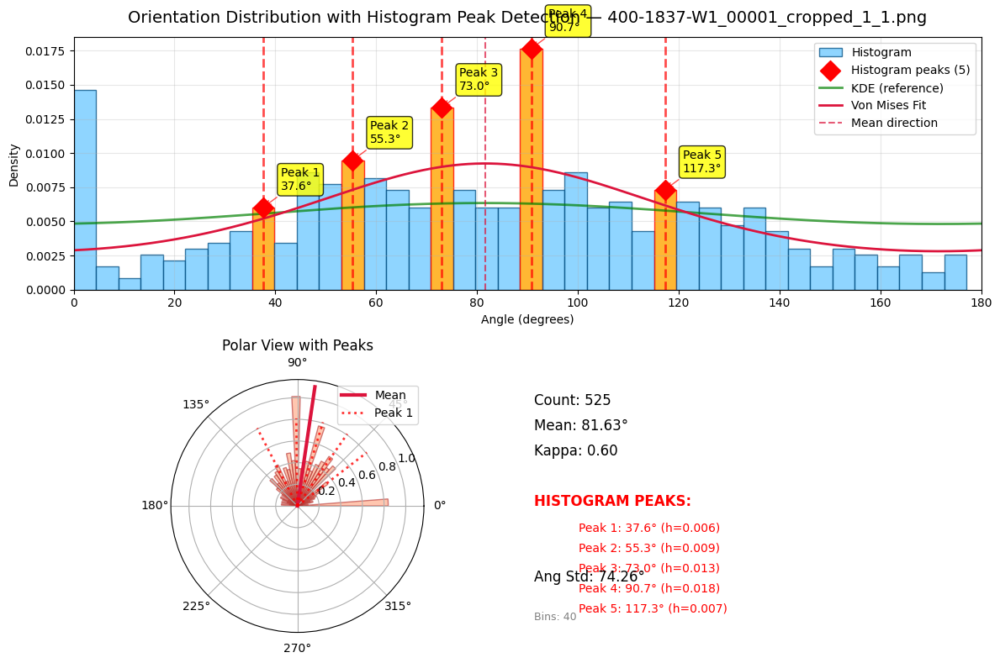

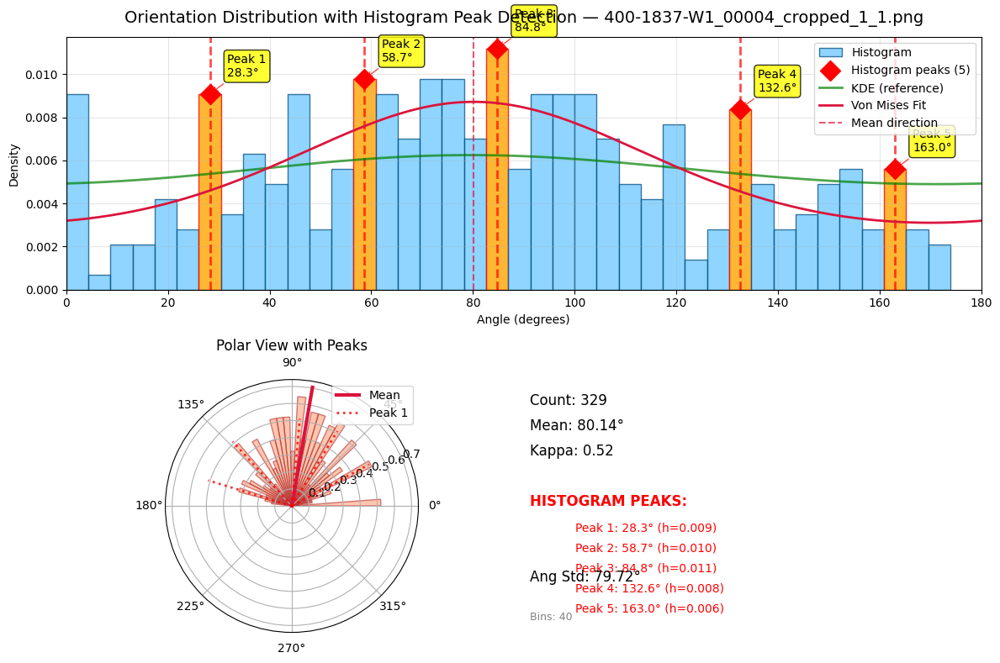


Creating improved grid view with histogram peak detection...
Error in grid view for 400-1837-W2_00003_cropped_1_1.png: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error in grid view for 400-1837-W2_00004_cropped_1_1.png: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error in grid view for 400-1837-W2_00006_cropped_1_1.png: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error in grid view for 400-1837-W2_00007_cropped_1_1.png: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error in grid view for 400-1837-W2_00008_cropped_1_1.png: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error in grid view for 400-1837-W2_00013_cropped_1_1.png: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error in grid view for 400-1837-W3_000

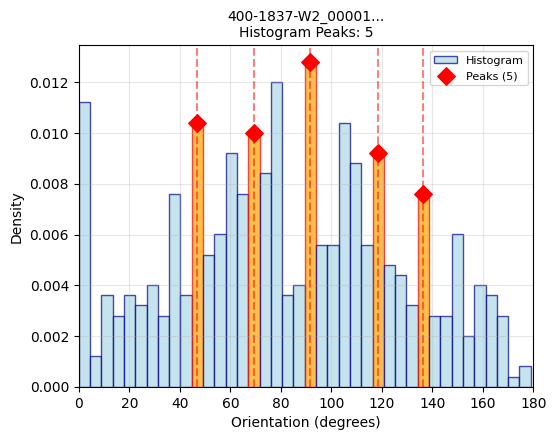


Peak detection parameters:
- Peaks are detected in the histogram bins
- Peak bins are highlighted in orange with red edges
- Red diamonds mark peak positions
- Dashed vertical lines show peak locations
- Adjust 'bins' parameter to control sensitivity


In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import vonmises
from scipy.optimize import curve_fit
from scipy.special import i0
from scipy.signal import find_peaks
import os

# 1. Load your CSV file
obj_lvl_csv_path = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images\high_density_images_results\cnt_object_level_details.csv"
df = pd.read_csv(obj_lvl_csv_path)

def axial_vonmises_kde(angles_deg, eval_deg=None, kappa_kernel=None):
    """
    Von Mises kernel density estimate for axial data (0–180°).
    Returns density PER DEGREE so it matches a histogram with density=True on degree x-axis.
    """
    ang = np.asarray(angles_deg)
    # Ensure axial [0,180)
    ang = ang % 180
    ang[ang < 0] += 180

    # Work in radians
    theta = np.deg2rad(ang)          # θ in [0, π)
    phi = 2.0 * theta                # doubled angles on [0, 2π)

    n = len(phi)
    if n == 0:
        raise ValueError("No angles provided to KDE.")

    # Evaluation grid (in degrees)
    if eval_deg is None:
        eval_deg = np.linspace(0, 180, 500)
    eval_theta = np.deg2rad(eval_deg)        # [0, π)
    eval_phi = 2.0 * eval_theta              # [0, 2π)

    # Choose kernel concentration (smoothing). Heuristic: half of the fitted concentration on doubled angles.
    if kappa_kernel is None:
        kappa_fit, loc_fit, _ = vonmises.fit(phi, fscale=1)
        kappa_kernel = max(0.5, 0.5 * float(kappa_fit))  # mild smoothing, clamp a bit

    # Von Mises normalization constant
    C = 1.0 / (2.0 * np.pi * i0(kappa_kernel))

    # Mixture on the circle for doubled angles: g(φ) = (1/n) Σ C * exp(κ cos(φ - φ_i))
    diff = eval_phi[:, None] - phi[None, :]
    g_phi = C * np.exp(kappa_kernel * np.cos(diff)).mean(axis=1)

    # Map back to axial: f(θ) = 2 * g(2θ)  [still per radian]
    f_theta_per_radian = 2.0 * g_phi

    # Convert to per-degree to match matplotlib hist(density=True) on a degree x-axis
    f_per_degree = f_theta_per_radian * (np.pi / 180.0)

    return eval_deg, f_per_degree, kappa_kernel

def detect_peaks_in_histogram(angles, bins=15, height=None, prominence=None, distance=None):
    """
    Detect peaks in the histogram of angles
    
    Parameters:
    - angles: array of angles in degrees
    - bins: number of bins for histogram
    - height: minimum height of peaks
    - prominence: minimum prominence of peaks
    - distance: minimum distance between peaks (in bins)
    
    Returns:
    - peak_positions: bin centers of detected peaks
    - peak_heights: histogram values at detected peaks
    - bin_centers: centers of all histogram bins
    - hist_values: histogram values
    """
    # Create histogram
    hist_values, bin_edges = np.histogram(angles, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Set default parameters if not provided
    if height is None:
        height = np.percentile(hist_values, 50)  # Only consider peaks above 50th percentile
    
    if prominence is None:
        prominence = 0.05 * (np.max(hist_values) - np.min(hist_values))
    
    if distance is None:
        distance = max(1, bins // 10)  # Minimum 10% of bins between peaks
    
    # Find peaks in histogram
    peaks, properties = find_peaks(hist_values, height=height, prominence=prominence, distance=distance)
    
    peak_positions = bin_centers[peaks]
    peak_heights = hist_values[peaks]
    
    return peak_positions, peak_heights, bin_centers, hist_values, properties

def convert_axial_angles(angles):
    """Convert angles to axial representation (0-180°)"""
    angles = np.array(angles)
    angles_axial = angles % 180
    angles_axial[angles_axial < 0] += 180
    angles_axial[angles_axial >= 180] -= 180
    return angles_axial

# Get unique image filenames
image_filenames = df['image_filename'].unique()

print(f"Found {len(image_filenames)} unique images")

# Create individual plots for each image with histogram peak detection
for image_name in image_filenames:
    image_data = df[df['image_filename'] == image_name]
    angles = image_data['orientation_angle_pixels'].dropna()

    if len(angles) < 3:
        print(f"Skipping {image_name}: not enough objects")
        continue

    angles_axial = convert_axial_angles(angles)
    angles_doubled = 2 * np.radians(angles_axial)

    try:
        kappa, loc, scale = vonmises.fit(angles_doubled, fscale=1)
        mean_direction_doubled = loc % (2*np.pi)
        mean_deg = np.degrees(mean_direction_doubled / 2)

        fig = plt.figure(figsize=(12, 8))
        gs = fig.add_gridspec(2, 2)

        ax_hist = fig.add_subplot(gs[0, :])
        ax_polar = fig.add_subplot(gs[1, 0], projection='polar')
        ax_text = fig.add_subplot(gs[1, 1])
        ax_text.axis('off')

        bins = 40
        
        # Detect peaks in histogram FIRST
        peak_positions, peak_heights, bin_centers, hist_values, peak_props = detect_peaks_in_histogram(
            angles_axial, bins=bins
        )
        
        # Plot histogram with peaks highlighted
        counts, bin_edges, patches = ax_hist.hist(angles_axial, bins=bins, density=True,
                     color="#6AC8FF", edgecolor="#004C80", alpha=0.75, label='Histogram')
        
        # Highlight the bins that contain peaks
        for i, (peak_pos, peak_height) in enumerate(zip(peak_positions, peak_heights)):
            # Find which patch corresponds to this peak
            for j, patch in enumerate(patches):
                if (patch.get_x() <= peak_pos <= patch.get_x() + patch.get_width()):
                    patch.set_facecolor('orange')
                    patch.set_edgecolor('red')
                    patch.set_alpha(0.8)
                    break
        
        # Plot peaks as points on top of histogram
        ax_hist.scatter(peak_positions, peak_heights, color='red', s=150, zorder=5, 
                       marker='D', label=f'Histogram peaks ({len(peak_positions)})')
        
        # Add vertical lines and annotations for peaks
        for i, (peak_pos, peak_height) in enumerate(zip(peak_positions, peak_heights)):
            ax_hist.axvline(x=peak_pos, color='red', linestyle='--', alpha=0.7, linewidth=2)
            ax_hist.annotate(f'Peak {i+1}\n{peak_pos:.1f}°', 
                           xy=(peak_pos, peak_height), 
                           xytext=(15, 15), textcoords='offset points',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.8),
                           arrowprops=dict(arrowstyle='->', color='red', alpha=0.7))

        # Also plot KDE for reference (but don't detect peaks from it)
        samples_deg, kde_vals_per_deg, kappa_kernel = axial_vonmises_kde(angles_axial)
        ax_hist.plot(samples_deg, kde_vals_per_deg, lw=2, color="green", alpha=0.7, 
                    label=f"KDE (reference)")

        # Von Mises fit
        x = np.linspace(0, 180, 500)
        fpdf_per_radian = 2 * vonmises.pdf(2*np.radians(x), kappa, loc=loc)
        fpdf_per_degree = fpdf_per_radian * (np.pi / 180.0)

        ax_hist.plot(x, fpdf_per_degree, lw=2, color="crimson", label="Von Mises Fit")

        ax_hist.axvline(mean_deg, linestyle="--", color="crimson", alpha=0.7, label='Mean direction')

        ax_hist.set_title(f"Orientation Distribution with Histogram Peak Detection — {os.path.basename(image_name)}",
                          fontsize=14, pad=12)
        ax_hist.set_xlim(0, 180)
        ax_hist.grid(alpha=0.3)
        ax_hist.set_xlabel("Angle (degrees)")
        ax_hist.set_ylabel("Density")
        ax_hist.legend()

        # Polar plot with peaks
        hist_pol, bins_pol = np.histogram(np.radians(angles_axial),
                                          bins=bins, density=True)
        ax_polar.bar((bins_pol[:-1]+bins_pol[1:])/2, hist_pol,
                     width=(bins_pol[1]-bins_pol[0]), alpha=0.6,
                     color="#FFA07A", edgecolor="#B22B2B")

        mean_rad = np.radians(mean_deg)
        ax_polar.plot([mean_rad, mean_rad], [0, max(hist_pol)*1.1],
                      lw=3, color="crimson", label='Mean')

        # Add peak directions to polar plot
        peak_radians = np.radians(peak_positions)
        for i, peak_rad in enumerate(peak_radians):
            ax_polar.plot([peak_rad, peak_rad], [0, max(hist_pol)*0.8],
                         lw=2, color='red', linestyle=':', alpha=0.8, label=f'Peak {i+1}' if i == 0 else "")

        ax_polar.set_title("Polar View with Peaks", fontsize=12)
        # Only show legend if there are peaks
        if len(peak_positions) > 0:
            ax_polar.legend()

        # Text info with peak details
        ax_text.text(0, 0.9, f"Count: {len(angles)}", fontsize=12)
        ax_text.text(0, 0.8, f"Mean: {mean_deg:.2f}°", fontsize=12)
        ax_text.text(0, 0.7, f"Kappa: {kappa:.2f}", fontsize=12)
        
        # Peak information
        ax_text.text(0, 0.5, "HISTOGRAM PEAKS:", fontsize=12, weight='bold', color='red')
        if len(peak_positions) > 0:
            for i, (pos, height) in enumerate(zip(peak_positions, peak_heights)):
                ax_text.text(0.1, 0.4 - i*0.08, f"Peak {i+1}: {pos:.1f}° (h={height:.3f})", 
                           fontsize=10, color='red')
        else:
            ax_text.text(0.1, 0.4, "No significant peaks", fontsize=10, color='red')
            
        if kappa > 0:
            ax_text.text(0, 0.2, f"Ang Std: {np.degrees(1/np.sqrt(kappa)):.2f}°", fontsize=12)

        # Add bin information
        ax_text.text(0, 0.05, f"Bins: {bins}", fontsize=9, color='gray')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing {image_name}: {e}")
        continue

# Create a simplified grid view with histogram peak detection
print("\n" + "="*60)
print("Creating improved grid view with histogram peak detection...")
print("="*60)

n_images = len(image_filenames)
n_cols = min(3, n_images)
n_rows = (n_images + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
if n_images == 1:
    axes = np.array([axes])
if n_rows > 1 and n_cols > 1:
    axes = axes.flatten()

for idx, image_name in enumerate(image_filenames):
    if idx >= len(axes):
        break
        
    image_data = df[df['image_filename'] == image_name]
    angles = image_data['orientation_angle_pixels'].dropna()
    
    if len(angles) < 3:
        axes[idx].set_visible(False)
        continue
    
    angles_axial = convert_axial_angles(angles)
    
    try:
        # Detect peaks in histogram
        # bins = 15
        peak_positions, peak_heights, bin_centers, hist_values, _ = detect_peaks_in_histogram(
            angles_axial, bins=bins
        )
        
        # Plot histogram
        n, bins, patches = axes[idx].hist(angles_axial, density=True, bins=bins, alpha=0.7, 
                      color='lightblue', edgecolor='navy', label='Histogram')
        
        # Highlight peak bins
        for i, (peak_pos, peak_height) in enumerate(zip(peak_positions, peak_heights)):
            for j, patch in enumerate(patches):
                if (patch.get_x() <= peak_pos <= patch.get_x() + patch.get_width()):
                    patch.set_facecolor('orange')
                    patch.set_edgecolor('red')
                    break
        
        # Mark peaks
        axes[idx].scatter(peak_positions, peak_heights, color='red', s=80, zorder=5, 
                         marker='D', label=f'Peaks ({len(peak_positions)})')
        
        for peak_pos in peak_positions:
            axes[idx].axvline(x=peak_pos, color='red', linestyle='--', alpha=0.5)
        
        axes[idx].set_xlabel('Orientation (degrees)')
        axes[idx].set_ylabel('Density')
        short_name = os.path.basename(image_name)
        if len(short_name) > 20:
            short_name = short_name[:17] + "..."
        
        # Add peak count to title
        axes[idx].set_title(f'{short_name}\nHistogram Peaks: {len(peak_positions)}', fontsize=10)
        axes[idx].grid(True, alpha=0.3)
        axes[idx].set_xlim(0, 180)
        if len(peak_positions) > 0:  # Only show legend if there are peaks
            axes[idx].legend(fontsize=8)
        
    except Exception as e:
        print(f"Error in grid view for {image_name}: {e}")
        axes[idx].set_visible(False)
        continue

# Hide unused subplots
for idx in range(len(image_filenames), len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()

print("\nPeak detection parameters:")
print("- Peaks are detected in the histogram bins")
print("- Peak bins are highlighted in orange with red edges")
print("- Red diamonds mark peak positions")
print("- Dashed vertical lines show peak locations")
print("- Adjust 'bins' parameter to control sensitivity")

# Compare prediction based features with fft based features: TIF Files or PNG files

In [28]:
import os
import numpy as np
import pandas as pd
import tifffile as tiff
from sklearn import preprocessing as pre
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import cv2

# Configuration - SET THIS BASED ON WHAT YOU WANT TO PROCESS
PROCESS_PNG = True  # Set to False to process TIFF files
if PROCESS_PNG:
    mask_path = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images"
    file_extensions = ('.png',)
else:
    # mask_path = "../../data/annotations_uniques/test/images" 
    mask_path = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\test_set_cherry_picked"
    file_extensions = ('.tif', '.tiff')

# Create output directory for figures
output_fig_dir = os.path.join(mask_path, "fft_analysis_figures")
os.makedirs(output_fig_dir, exist_ok=True)
print(f"Figures will be saved to: {output_fig_dir}")

def read_image(file_path, is_png):
    """Read image based on file type"""
    if is_png:
        img = cv2.imread(file_path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img
    else:
        return tiff.imread(file_path)

def preprocess_mask(mask):
    """Apply preprocessing to enhance FFT results"""
    # Convert to grayscale if needed
    if len(mask.shape) == 3 and mask.shape[2] == 3:
        mask = mask.mean(axis=2)
    if len(mask.shape) > 2:
        mask = mask[0]
    
    # Convert to float32 and normalize
    mask = mask.astype(np.float32)
    scaler = pre.MinMaxScaler()
    return scaler.fit_transform(mask.reshape(-1, 1)).reshape(mask.shape)



def extract_fft_features_old(mask_processed, field_um_x=5.0, field_um_y=5.0):
    """Extract FFT features from processed mask"""
    try:
        # FFT computation
        mask_processed = mask_processed - np.mean(mask_processed)
        f = np.fft.fft2(mask_processed)
        fshift = np.fft.fftshift(f)
        fshift[mask_processed.shape[0]//2, mask_processed.shape[1]//2] = 0
        magnitude = np.abs(fshift)

        h, w = mask_processed.shape
        cy, cx = h//2, w//2

        # Polar coordinates
        Y, X = np.indices((h, w))
        Y = h - 1 - Y
        R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
        theta = np.arctan2(Y-cy, X-cx)  
        theta_deg_prof = np.rad2deg(theta)

        # Radial profile
        radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
        r = np.arange(len(radial_profile))

        # Find peaks for density
        peaks, _ = find_peaks(radial_profile, distance=5)
        if len(peaks) > 0:
            main_r = peaks[np.argmax(radial_profile[peaks])]
            density_freq_cyc_per_px = main_r / w
        else:
            main_r = None
            density_freq_cyc_per_px = 0.0

        # Angular profile
        angular_bins = 180
        hist, edges = np.histogram(theta_deg_prof.ravel(), bins=angular_bins, 
                                 range=(0, 180), weights=magnitude.ravel())
        
        fft_orientation_angle = edges[np.argmax(hist)]
        object_orientation_angle = (fft_orientation_angle + 90) % 180

        # Alignment and order parameters
        alignment_index = np.max(hist) / np.mean(hist) if np.mean(hist) > 0 else 1.0
        
        order_parameter = 0.0
        if main_r is not None and main_r < len(radial_profile):
            P_peak = radial_profile[main_r]
            mask_bg = [(r[i] > main_r + 10) and (r[i] < len(r)//2) for i in range(len(r))]
            if any(mask_bg):
                P_bg = np.mean(radial_profile[mask_bg])
                order_parameter = (P_peak - P_bg) / (P_peak + P_bg) if (P_peak + P_bg) > 0 else 0.0

        # Spacing calculation
        px_size_um_x = field_um_x / w
        px_size_um_y = field_um_y / h
        px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

        if density_freq_cyc_per_px > 0:
            spacing_px = 1.0 / density_freq_cyc_per_px
            spacing_um = spacing_px * px_size_um
        else:
            spacing_px = spacing_um = 0.0

        features = {
            'density_freq': float(density_freq_cyc_per_px),
            'fft_orientation_angle': float(fft_orientation_angle),
            'object_orientation_angle': float(object_orientation_angle),
            'alignment_index': float(alignment_index),
            'order_parameter': float(order_parameter),
            'spacing_px': float(spacing_px),
            'spacing_um': float(spacing_um),
            'image_width': int(w),
            'image_height': int(h),
            'px_size_um': float(px_size_um)
        }
        
        return features, True, magnitude, theta_deg_prof, radial_profile, r, hist, edges
        
    except Exception as e:
        print(f"Error in FFT feature extraction: {str(e)}")
        return None, False, None, None, None, None, None, None

from scipy.ndimage import gaussian_filter
from scipy.signal import find_peaks, peak_widths
def extract_fft_features(mask_processed, field_um_x=5.0, field_um_y=5.0, 
                                angular_bins=360, smoothing_sigma=1.0, min_peak_prominence=0.1):
    """Extract FFT features from processed mask with improved orientation accuracy"""
    try:
        # Preprocessing - ensure we have a clean input
        mask_processed = mask_processed.astype(np.float64)
        mask_processed = mask_processed - np.mean(mask_processed)
        
        # Apply windowing to reduce edge effects
        h, w = mask_processed.shape
        window_y = np.hanning(h)[:, np.newaxis]
        window_x = np.hanning(w)[np.newaxis, :]
        window_2d = np.sqrt(window_y * window_x)  # Use sqrt for better balance
        mask_windowed = mask_processed * window_2d

        # FFT computation
        f = np.fft.fft2(mask_windowed)
        fshift = np.fft.fftshift(f)
        
        # Remove DC component and very low frequencies that don't contribute to orientation
        cy, cx = h//2, w//2
        fshift[cy, cx] = 0  # Remove DC
        
        # Create a mask to remove very low frequencies near center
        y_indices, x_indices = np.ogrid[:h, :w]
        center_dist = np.sqrt((x_indices - cx)**2 + (y_indices - cy)**2)
        low_freq_mask = center_dist < min(h, w) * 0.03  # Remove 3% lowest frequencies
        fshift[low_freq_mask] = 0
        
        magnitude = np.abs(fshift)
        
        # Enhanced polar coordinates with proper angle calculation
        Y, X = np.indices((h, w))
        # Convert to mathematical coordinates (y increases upward)
        Y_math = h - 1 - Y - cy  # Center at (0,0) with proper mathematical y-direction
        X_math = X - cx
        
        # Calculate radius and angle
        R = np.sqrt(X_math**2 + Y_math**2)
        theta = np.arctan2(Y_math, X_math)  # This gives angles from -pi to pi
        theta_deg = np.rad2deg(theta) % 180  # Convert to 0-180 range for orientation
        
        # Remove very high frequencies (usually noise) and very low frequencies
        max_radius = min(h, w) // 2
        valid_mask = (R > min(h, w) * 0.03) & (R < max_radius * 0.8)
        
        # Enhanced angular profile with smoothing and better peak detection
        angle_bin_edges = np.linspace(0, 180, angular_bins + 1)
        angle_bin_centers = (angle_bin_edges[:-1] + angle_bin_edges[1:]) / 2
        
        # Create angular profile using valid frequencies only
        hist, _ = np.histogram(theta_deg[valid_mask], bins=angle_bin_edges, 
                              weights=magnitude[valid_mask])
        
        # Smooth the angular profile to reduce noise
        if smoothing_sigma > 0:
            hist_smooth = gaussian_filter(hist.astype(float), sigma=smoothing_sigma)
        else:
            hist_smooth = hist.astype(float)
        
        # Find multiple peaks and select the most significant one
        min_prominence = min_peak_prominence * np.max(hist_smooth)
        peaks, properties = find_peaks(hist_smooth, prominence=min_prominence,
                                      distance=max(1, angular_bins//36))  # At least 5 degrees apart
        
        if len(peaks) > 0:
            # Use prominence to find the most significant peak
            if 'prominences' in properties and len(properties['prominences']) > 0:
                main_peak_idx = peaks[np.argmax(properties['prominences'])]
            else:
                main_peak_idx = peaks[0]
            main_peak_angle = angle_bin_centers[main_peak_idx]
            
            # Refine peak position using quadratic interpolation around the peak
            if main_peak_idx > 0 and main_peak_idx < len(hist_smooth) - 1:
                # Quadratic interpolation for sub-bin accuracy
                y0, y1, y2 = (hist_smooth[main_peak_idx-1], 
                             hist_smooth[main_peak_idx], 
                             hist_smooth[main_peak_idx+1])
                if y0 + y2 - 2*y1 != 0:  # Avoid division by zero
                    offset = (y0 - y2) / (2 * (y0 + y2 - 2*y1))
                    bin_width = angle_bin_centers[1] - angle_bin_centers[0]
                    main_peak_angle += offset * bin_width
            
            fft_orientation_angle = main_peak_angle
        else:
            # Fallback to simple argmax if no clear peaks found
            main_peak_idx = np.argmax(hist_smooth)
            fft_orientation_angle = angle_bin_centers[main_peak_idx]
        
        # Convert FFT orientation to object orientation (perpendicular)
        object_orientation_angle = (fft_orientation_angle + 90) % 180
        
        # Enhanced radial profile for density/spacing analysis
        R_int = R.astype(int)
        radial_profile = np.bincount(R_int.ravel(), weights=magnitude.ravel(), 
                                   minlength=int(R.max())+1)
        radial_counts = np.bincount(R_int.ravel(), minlength=int(R.max())+1)
        
        # Avoid division by zero
        with np.errstate(divide='ignore', invalid='ignore'):
            radial_profile = np.where(radial_counts > 0, radial_profile / radial_counts, 0)
        
        r = np.arange(len(radial_profile))
        
        # Find main frequency peak with better criteria
        valid_radial_range = (r > min(h, w) * 0.03) & (r < len(r)//2)
        radial_valid_indices = np.where(valid_radial_range)[0]
        
        if len(radial_valid_indices) > 0:
            radial_peaks, radial_properties = find_peaks(radial_profile[valid_radial_range], 
                                                       prominence=0.1 * np.max(radial_profile[valid_radial_range]),
                                                       distance=5)
            
            if len(radial_peaks) > 0:
                # Use the most prominent peak, not necessarily the highest
                if 'prominences' in radial_properties and len(radial_properties['prominences']) > 0:
                    main_radial_idx = radial_peaks[np.argmax(radial_properties['prominences'])]
                else:
                    main_radial_idx = radial_peaks[0]
                main_r = r[valid_radial_range][main_radial_idx]
                density_freq_cyc_per_px = main_r / max(w, h)  # Normalize by larger dimension
            else:
                main_r = None
                density_freq_cyc_per_px = 0.0
        else:
            main_r = None
            density_freq_cyc_per_px = 0.0
        
        # Enhanced alignment index using circular statistics
        alignment_index = np.max(hist_smooth) / np.mean(hist_smooth) if np.mean(hist_smooth) > 0 else 1.0
        
        # Enhanced order parameter using background subtraction
        order_parameter = 0.0
        if main_r is not None and main_r < len(radial_profile):
            # Background is outside peak region
            bg_mask = (r > main_r + 10) & (r < len(r)//2)
            
            if np.sum(bg_mask) > 0:
                P_peak = radial_profile[int(main_r)]
                P_bg = np.mean(radial_profile[bg_mask])
                order_parameter = (P_peak - P_bg) / (P_peak + P_bg) if (P_peak + P_bg) > 0 else 0.0

        # Spacing calculation
        px_size_um_x = field_um_x / w
        px_size_um_y = field_um_y / h
        px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

        if density_freq_cyc_per_px > 0:
            spacing_px = 1.0 / density_freq_cyc_per_px
            spacing_um = spacing_px * px_size_um
        else:
            spacing_px = spacing_um = 0.0

        features = {
            'density_freq': float(density_freq_cyc_per_px),
            'fft_orientation_angle': float(fft_orientation_angle),
            'object_orientation_angle': float(object_orientation_angle),
            'alignment_index': float(alignment_index),
            'order_parameter': float(order_parameter),
            'spacing_px': float(spacing_px),
            'spacing_um': float(spacing_um),
            'image_width': int(w),
            'image_height': int(h),
            'px_size_um': float(px_size_um),
            'peak_prominence': float(properties['prominences'].max() if len(peaks) > 0 else 0.0)
        }
        
        # Return consistent data for plotting - ensure hist and angle_bin_centers have same length
        return features, True, magnitude, theta_deg, radial_profile, r, hist_smooth, angle_bin_centers
        
    except Exception as e:
        print(f"Error in FFT feature extraction: {str(e)}")
        import traceback
        traceback.print_exc()
        return None, False, None, None, None, None, None, None

def save_fft_figure(mask, mask_processed, features, magnitude, theta_deg_prof, 
                   radial_profile, r, hist, angle_centers, filename, output_dir):
    """Save FFT results figure to file instead of displaying"""
    h, w = mask_processed.shape
    center_y, center_x = h // 2, w // 2
    
    fig, axes = plt.subplots(1, 6, figsize=(26, 5))
    titles = ["Original Mask", "Preprocessed Mask", "FFT Magnitude (log scale)", 
              "Radial FFT Profile (Density)", "Angular FFT Profile (0°-180°)", 
              "Object Orientation (Actual CNT Direction)"]
    
    # Plot images
    axes[0].imshow(mask, cmap="gray")
    axes[1].imshow(mask_processed)
    axes[2].imshow(np.log1p(magnitude))
    
    # Radial profile - ensure we have valid data
    if len(r) == len(radial_profile):
        axes[3].plot(r, radial_profile, color="black")
        if features['density_freq'] > 0:
            main_r = features['density_freq'] * max(w, h)  # Use max dimension for consistency
            axes[3].axvline(main_r, color="cyan", linestyle="--", label="Main density")
        axes[3].set_xlabel("Radius (frequency)")
        axes[3].set_ylabel("Energy")
        axes[3].legend()
    else:
        axes[3].text(0.5, 0.5, "Radial profile data\nnot available", 
                    ha='center', va='center', transform=axes[3].transAxes)

    # Angular profile - FIXED: use angle_centers instead of computing from edges
    if len(angle_centers) == len(hist):
        axes[4].plot(angle_centers, hist, color="red")
        
        fft_angle = features['fft_orientation_angle']
        object_angle = features['object_orientation_angle']
        
        axes[4].axvline(fft_angle, color="blue", linestyle="--", 
                       label=f'FFT orientation: {fft_angle:.1f}°')
        axes[4].axvline(object_angle, color="green", linestyle="--",
                       label=f'Object orientation: {object_angle:.1f}°')
        axes[4].set_xlabel("Angle [deg] (0°=East, 90°=North, 180°=West)")
        axes[4].set_ylabel("Energy")
        axes[4].set_xlim(0, 180)
        axes[4].legend()
    else:
        axes[4].text(0.5, 0.5, f"Angular profile data mismatch\n{len(angle_centers)} vs {len(hist)}", 
                    ha='center', va='center', transform=axes[4].transAxes)

    # Orientation visualization
    axes[5].imshow(mask_processed, cmap="gray")
    length = min(h, w) * 0.4
    object_orientation = features['object_orientation_angle']
    
    # Main orientation line
    angle_rad = np.radians(object_orientation)
    end_x = center_x + length * np.cos(angle_rad)
    end_y = center_y - length * np.sin(angle_rad)
    start_x = center_x - length * np.cos(angle_rad)
    start_y = center_y + length * np.sin(angle_rad)

    # Orthogonal line
    ortho_angle = (object_orientation + 90) % 180
    ortho_angle_rad = np.radians(ortho_angle)
    ortho_end_x = center_x + length * np.cos(ortho_angle_rad)
    ortho_end_y = center_y - length * np.sin(ortho_angle_rad)
    ortho_start_x = center_x - length * np.cos(ortho_angle_rad)
    ortho_start_y = center_y + length * np.sin(ortho_angle_rad)

    axes[5].plot([start_x, end_x], [start_y, end_y], 'r-', linewidth=3, 
                label=f'Object orientation ({object_orientation:.1f}°)')
    axes[5].plot([ortho_start_x, ortho_end_x], [ortho_start_y, ortho_end_y], 'g--', 
                linewidth=2, label=f'Orthogonal (FFT: {features["fft_orientation_angle"]:.1f}°)')
    axes[5].legend()

    # Set titles and turn off axes for image subplots
    for ax, title in zip(axes, titles):
        ax.set_title(title)
        if title not in ["Radial FFT Profile (Density)", "Angular FFT Profile (0°-180°)"]:
            ax.axis("off")

    # Set main title and save
    plt.suptitle(f"FFT Analysis: {filename}", fontsize=14)
    plt.tight_layout()
    
    # Save figure
    output_filename = os.path.splitext(filename)[0] + '_fft_analysis.png'
    output_path = os.path.join(output_dir, output_filename)
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close()  # Close the figure to free memory
    
    print(f"  Saved figure: {output_filename}")


def save_fft_figure_old(mask, mask_processed, features, magnitude, theta_deg_prof, 
                   radial_profile, r, hist, edges, filename, output_dir):
    """Save FFT results figure to file instead of displaying"""
    h, w = mask_processed.shape
    center_y, center_x = h // 2, w // 2
    
    fig, axes = plt.subplots(1, 6, figsize=(26, 5))
    titles = ["Original Mask", "Preprocessed Mask", "FFT Magnitude (log scale)", 
              "Radial FFT Profile (Density)", "Angular FFT Profile (0°-180°)", 
              "Object Orientation (Actual CNT Direction)"]
    
    # Plot images
    axes[0].imshow(mask, cmap="gray")
    axes[1].imshow(mask_processed)
    axes[2].imshow(np.log1p(magnitude))
    
    # Radial profile
    axes[3].plot(r, radial_profile, color="black")
    if features['density_freq'] > 0:
        main_r = features['density_freq'] * w
        axes[3].axvline(main_r, color="cyan", linestyle="--", label="Main density")
    axes[3].set_xlabel("Radius (frequency)")
    axes[3].set_ylabel("Energy")
    axes[3].legend()

    # Angular profile
    centers = 0.5 * (edges[:-1] + edges[1:])
    axes[4].plot(centers, hist, color="red")
    
    fft_angle = features['fft_orientation_angle']
    object_angle = features['object_orientation_angle']
    
    axes[4].axvline(fft_angle, color="blue", linestyle="--", 
                   label=f'FFT orientation: {fft_angle:.1f}°')
    axes[4].axvline(object_angle, color="green", linestyle="--",
                   label=f'Object orientation: {object_angle:.1f}°')
    axes[4].set_xlabel("Angle [deg] (0°=East, 90°=North, 180°=West)")
    axes[4].set_ylabel("Energy")
    axes[4].set_xlim(0, 180)
    axes[4].legend()

    # Orientation visualization
    axes[5].imshow(mask_processed, cmap="gray")
    length = min(h, w) * 0.4
    object_orientation = features['object_orientation_angle']
    
    # Main orientation line
    angle_rad = np.radians(object_orientation)
    end_x = center_x + length * np.cos(angle_rad)
    end_y = center_y - length * np.sin(angle_rad)
    start_x = center_x - length * np.cos(angle_rad)
    start_y = center_y + length * np.sin(angle_rad)

    # Orthogonal line
    ortho_angle = (object_orientation + 90) % 180
    ortho_angle_rad = np.radians(ortho_angle)
    ortho_end_x = center_x + length * np.cos(ortho_angle_rad)
    ortho_end_y = center_y - length * np.sin(ortho_angle_rad)
    ortho_start_x = center_x - length * np.cos(ortho_angle_rad)
    ortho_start_y = center_y + length * np.sin(ortho_angle_rad)

    axes[5].plot([start_x, end_x], [start_y, end_y], 'r-', linewidth=3, 
                label=f'Object orientation ({object_orientation:.1f}°)')
    axes[5].plot([ortho_start_x, ortho_end_x], [ortho_start_y, ortho_end_y], 'g--', 
                linewidth=2, label=f'Orthogonal (FFT: {features["fft_orientation_angle"]:.1f}°)')
    axes[5].legend()

    # Set titles and turn off axes for image subplots
    for ax, title in zip(axes, titles):
        ax.set_title(title)
        if title not in ["Radial FFT Profile (Density)", "Angular FFT Profile (0°-180°)"]:
            ax.axis("off")

    # Set main title and save
    plt.suptitle(f"FFT Analysis: {filename}", fontsize=14)
    plt.tight_layout()
    
    # Save figure
    output_filename = os.path.splitext(filename)[0] + '_fft_analysis.png'
    output_path = os.path.join(output_dir, output_filename)
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close()  # Close the figure to free memory
    
    print(f"  Saved figure: {output_filename}")

def create_error_entry(filename, error_msg):
    """Create standardized error entry"""
    return {
        'filename': filename,
        'error': error_msg,
        'density_freq': None, 'fft_orientation_angle': None, 'object_orientation_angle': None,
        'alignment_index': None, 'order_parameter': None, 'spacing_px': None, 'spacing_um': None,
        'image_width': None, 'image_height': None, 'px_size_um': None
    }

def print_statistics(df):
    """Print statistics for successful extractions"""
    successful_df = df[df['error'].isna()]
    if len(successful_df) == 0:
        return
        
    for angle_type in ['object_orientation_angle', 'fft_orientation_angle']:
        valid_angles = successful_df[angle_type].dropna()
        if len(valid_angles) > 0:
            print(f"\n{angle_type.upper()} Statistics (0°-180°):")
            print(f"  Range: {valid_angles.min():.1f}° to {valid_angles.max():.1f}°")
            print(f"  Mean: {valid_angles.mean():.1f}° ± {valid_angles.std():.1f}°")
            print(f"  Median: {valid_angles.median():.1f}°")

# Main processing
results = []
is_png = PROCESS_PNG
file_type = "PNG" if is_png else "TIFF"

# Get files
files = [f for f in os.listdir(mask_path) if f.lower().endswith(file_extensions)]
print(f"Found {len(files)} {file_type} files to process...")

success_count = 0
for i, filename in enumerate(files):
    print(f"Processing {i+1}/{len(files)}: {filename}")
    
    try:
        # Read and preprocess
        file_path = os.path.join(mask_path, filename)
        mask = read_image(file_path, is_png)
        
        if mask is None:
            print(f"  Error: Could not read {filename}")
            results.append(create_error_entry(filename, "Could not read file"))
            continue
            
        mask_processed = preprocess_mask(mask)
        
        # Extract features
        features, success, magnitude, theta_deg_prof, radial_profile, r, hist, edges = extract_fft_features(mask_processed)
        
        if success and features:
            features['filename'] = filename
            features['error'] = None
            results.append(features)
            success_count += 1
            
            print(f"Success! FFT: {features['fft_orientation_angle']:.2f}°, "
                  f"Object: {features['object_orientation_angle']:.2f}°, "
                  f"Alignment: {features['alignment_index']:.2f}, "
                  f"Spacing: {features['spacing_um']:.3f} μm")
            
            # Save figure for all successful images (or modify condition as needed)
            save_fft_figure(mask, mask_processed, features, magnitude, theta_deg_prof,
                          radial_profile, r, hist, edges, filename, output_fig_dir)
        else:
            print(f"  Feature extraction failed for {filename}")
            results.append(create_error_entry(filename, 'Feature extraction failed'))
        
    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")
        results.append(create_error_entry(filename, str(e)))

# Create and display results
df = pd.DataFrame(results)
cols = ['filename'] + [col for col in df.columns if col not in ['filename', 'error']] + ['error']
df = df[cols]

print(f"\nProcessing complete! Processed {len(df)} files.")
print(f"Successfully extracted features from {success_count} files.")
print(f"All figures saved to: {output_fig_dir}")

# Print statistics
print_statistics(df)

# Display results
print("\nFirst few rows of the DataFrame:")
print(df.head(20))

# Save to CSV
# output_csv = f"fft_features_results_{'png' if is_png else 'tiff'}_object_orientation.csv"
# df.to_csv(output_csv, index=False)
# print(f"\nResults saved to: {output_csv}")

Figures will be saved to: C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images\fft_analysis_figures
Found 53 PNG files to process...
Processing 1/53: 400-1837-W1_00001_C1R4-K02_cropped_1_1.png
Success! FFT: 172.89°, Object: 82.89°, Alignment: 2.91, Spacing: 0.556 μm
  Saved figure: 400-1837-W1_00001_C1R4-K02_cropped_1_1_fft_analysis.png
Processing 2/53: 400-1837-W1_00004_C2R4-K02_cropped_1_1.png
Success! FFT: 176.35°, Object: 86.35°, Alignment: 3.92, Spacing: 0.294 μm
  Saved figure: 400-1837-W1_00004_C2R4-K02_cropped_1_1_fft_analysis.png
Processing 3/53: 400-1837-W2_00001_C1R4-K02_cropped_1_1.png
Success! FFT: 170.90°, Object: 80.90°, Alignment: 2.35, Spacing: 0.357 μm
  Saved figure: 400-1837-W2_00001_C1R4-K02_cropped_1_1_fft_analysis.png
Processing 4/53: 400-1837-W2_00003_C1R12-K02_cropped_1_1.png
Success! FFT: 162.27°, Object: 72.27°, Alignment: 2.87, Spacing: 0.556 μm
  Saved figure: 400-1837-

C:\Users\abd93000\AppData\Local\Temp\ipykernel_16756\1666808121.py:335: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend()


  Saved figure: 400-1837-W2_00004_C2R4-K02_cropped_1_1_fft_analysis.png
Processing 6/53: 400-1837-W2_00006_C2R12-K02_cropped_1_1.png
Success! FFT: 171.49°, Object: 81.49°, Alignment: 2.39, Spacing: 0.556 μm
  Saved figure: 400-1837-W2_00006_C2R12-K02_cropped_1_1_fft_analysis.png
Processing 7/53: 400-1837-W2_00007_C3R4-K02_cropped_1_1.png
Success! FFT: 174.88°, Object: 84.88°, Alignment: 3.47, Spacing: 0.556 μm
  Saved figure: 400-1837-W2_00007_C3R4-K02_cropped_1_1_fft_analysis.png
Processing 8/53: 400-1837-W2_00008_C3R8-K02_cropped_1_1.png
Success! FFT: 167.19°, Object: 77.19°, Alignment: 3.60, Spacing: 0.455 μm
  Saved figure: 400-1837-W2_00008_C3R8-K02_cropped_1_1_fft_analysis.png
Processing 9/53: 400-1837-W2_00013_C5R4-K02_cropped_1_1.png
Success! FFT: 172.87°, Object: 82.87°, Alignment: 3.08, Spacing: 0.000 μm


C:\Users\abd93000\AppData\Local\Temp\ipykernel_16756\1666808121.py:335: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend()


  Saved figure: 400-1837-W2_00013_C5R4-K02_cropped_1_1_fft_analysis.png
Processing 10/53: 400-1837-W3_00001_C1R4-K02_cropped_1_1.png
Success! FFT: 177.68°, Object: 87.68°, Alignment: 3.31, Spacing: 0.556 μm
  Saved figure: 400-1837-W3_00001_C1R4-K02_cropped_1_1_fft_analysis.png
Processing 11/53: 400-1837-W3_00012_C4R12-K02_cropped_1_1.png
Success! FFT: 100.66°, Object: 10.66°, Alignment: 2.50, Spacing: 0.500 μm
  Saved figure: 400-1837-W3_00012_C4R12-K02_cropped_1_1_fft_analysis.png
Processing 12/53: 400-1837-W5_00002_C1R5-K02_cropped_1_1.png
Success! FFT: 131.24°, Object: 41.24°, Alignment: 3.44, Spacing: 0.556 μm
  Saved figure: 400-1837-W5_00002_C1R5-K02_cropped_1_1_fft_analysis.png
Processing 13/53: 400-1837-W5_00021_C3R2-K02_cropped_1_1.png
Success! FFT: 176.57°, Object: 86.57°, Alignment: 4.54, Spacing: 0.556 μm
  Saved figure: 400-1837-W5_00021_C3R2-K02_cropped_1_1_fft_analysis.png
Processing 14/53: 400-1837-W5_00022_C3R3-K02_cropped_1_1.png
Success! FFT: 171.39°, Object: 81.39°

C:\Users\abd93000\AppData\Local\Temp\ipykernel_16756\1666808121.py:335: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend()


  Saved figure: 400-1837-W6_00003_C1R12-K03_cropped_1_1_fft_analysis.png
Processing 21/53: 400-1837-W6_00004_C2R4-K03_cropped_1_1.png
Success! FFT: 169.41°, Object: 79.41°, Alignment: 3.66, Spacing: 0.500 μm
  Saved figure: 400-1837-W6_00004_C2R4-K03_cropped_1_1_fft_analysis.png
Processing 22/53: 400-1837-W6_00005_C2R8-K03_cropped_1_1.png
Success! FFT: 153.06°, Object: 63.06°, Alignment: 3.37, Spacing: 0.556 μm
  Saved figure: 400-1837-W6_00005_C2R8-K03_cropped_1_1_fft_analysis.png
Processing 23/53: 400-1837-W6_00007_C3R4-K03_cropped_1_1.png
Success! FFT: 153.09°, Object: 63.09°, Alignment: 3.44, Spacing: 0.000 μm


C:\Users\abd93000\AppData\Local\Temp\ipykernel_16756\1666808121.py:335: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend()


  Saved figure: 400-1837-W6_00007_C3R4-K03_cropped_1_1_fft_analysis.png
Processing 24/53: 400-1837-W6_00008_C3R8-K03_cropped_1_1.png
Success! FFT: 177.75°, Object: 87.75°, Alignment: 3.60, Spacing: 0.385 μm
  Saved figure: 400-1837-W6_00008_C3R8-K03_cropped_1_1_fft_analysis.png
Processing 25/53: 400-1837-W6_00011_C4R8-K03_cropped_1_1.png
Success! FFT: 174.61°, Object: 84.61°, Alignment: 2.89, Spacing: 0.455 μm
  Saved figure: 400-1837-W6_00011_C4R8-K03_cropped_1_1_fft_analysis.png
Processing 26/53: 400-1837-W6_00012_C4R12-K03_cropped_1_1.png
Success! FFT: 178.02°, Object: 88.02°, Alignment: 3.41, Spacing: 0.556 μm
  Saved figure: 400-1837-W6_00012_C4R12-K03_cropped_1_1_fft_analysis.png
Processing 27/53: 400-1837-W6_00014_C5R8-K03_cropped_1_1.png
Success! FFT: 174.27°, Object: 84.27°, Alignment: 3.91, Spacing: 0.263 μm
  Saved figure: 400-1837-W6_00014_C5R8-K03_cropped_1_1_fft_analysis.png
Processing 28/53: 400-1837-W6_00015_C5R12-K03_cropped_1_1.png
Success! FFT: 173.23°, Object: 83.23

C:\Users\abd93000\AppData\Local\Temp\ipykernel_16756\1666808121.py:335: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend()


  Saved figure: 400-1837-W6_00015_C5R12-K03_cropped_1_1_fft_analysis.png
Processing 29/53: 400-1837-W6_00016_C6R4-K03_cropped_1_1.png
Success! FFT: 161.94°, Object: 71.94°, Alignment: 2.61, Spacing: 0.556 μm
  Saved figure: 400-1837-W6_00016_C6R4-K03_cropped_1_1_fft_analysis.png
Processing 30/53: 400-1837-W6_00018_C6R12-K03_cropped_1_1.png
Success! FFT: 176.27°, Object: 86.27°, Alignment: 3.06, Spacing: 0.294 μm
  Saved figure: 400-1837-W6_00018_C6R12-K03_cropped_1_1_fft_analysis.png
Processing 31/53: 400-1837-W6_00019_C7R4-K03_cropped_1_1.png
Success! FFT: 171.47°, Object: 81.47°, Alignment: 3.05, Spacing: 0.385 μm
  Saved figure: 400-1837-W6_00019_C7R4-K03_cropped_1_1_fft_analysis.png
Processing 32/53: 400-1837-W6_00020_C7R8-K03_cropped_1_1.png
Success! FFT: 173.99°, Object: 83.99°, Alignment: 2.57, Spacing: 0.556 μm
  Saved figure: 400-1837-W6_00020_C7R8-K03_cropped_1_1_fft_analysis.png
Processing 33/53: 400-1837-W6_00021_C7R12-K03_cropped_1_1.png
Success! FFT: 176.29°, Object: 86.2

C:\Users\abd93000\AppData\Local\Temp\ipykernel_16756\1666808121.py:335: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[3].legend()


  Saved figure: 400-1837-W6_00024_C8R12-K03_cropped_1_1_fft_analysis.png
Processing 35/53: 400-1837-W6_00025_C9R4-K03_cropped_1_1.png
Success! FFT: 172.95°, Object: 82.95°, Alignment: 2.96, Spacing: 0.500 μm
  Saved figure: 400-1837-W6_00025_C9R4-K03_cropped_1_1_fft_analysis.png
Processing 36/53: 400-1837-W6_00026_C9R8-K03_cropped_1_1.png
Success! FFT: 176.16°, Object: 86.16°, Alignment: 3.48, Spacing: 0.333 μm
  Saved figure: 400-1837-W6_00026_C9R8-K03_cropped_1_1_fft_analysis.png
Processing 37/53: 400-1837-W6_00027_C9R12-K03_cropped_1_1.png
Success! FFT: 176.03°, Object: 86.03°, Alignment: 3.10, Spacing: 0.417 μm
  Saved figure: 400-1837-W6_00027_C9R12-K03_cropped_1_1_fft_analysis.png
Processing 38/53: 400-1837-W6_00028_C10R4-K03_cropped_1_1.png
Success! FFT: 173.53°, Object: 83.53°, Alignment: 3.09, Spacing: 0.385 μm
  Saved figure: 400-1837-W6_00028_C10R4-K03_cropped_1_1_fft_analysis.png
Processing 39/53: 400-1837-W6_00029_C10R8-K03_cropped_1_1.png
Success! FFT: 165.43°, Object: 75

# Read CSV files

In [30]:
import pandas as pd
import numpy as np

# Read the CSV file
csv_df = pd.read_csv(r'C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images\high_density_images_results\image_level_averages.csv')  

# Change .png extension to .tif in the filename column
# csv_df['filename'] = csv_df['filename'].str.replace('.png', '.tif', regex=False)

# Convert orientation angles from [-90, 90] to [0, 180]
def convert_orientation(angle):
    """
    Convert orientation angle from [-90, 90] range to [0, 180] range
    """
    if pd.isna(angle):
        return angle
    # Add 180 to negative angles, keep positive angles as is
    if angle < 0:
        return angle + 180
    else:
        return angle

# Apply conversion to both orientation columns
csv_df['von_mises_mean_orientation_deg'] = csv_df['von_mises_mean_orientation_deg'].apply(convert_orientation)
csv_df['avg_orientation_angle_deg'] = csv_df['avg_orientation_angle_deg'].apply(convert_orientation)
csv_df['nematic_director_angle_deg'] = csv_df['nematic_director_angle_deg'].apply(convert_orientation)



In [31]:
import re

def normalize_filename(name):
    # Remove the part between _000XX_ and _cropped_ (e.g. "_C1R4-K02")
    return re.sub(r'(_\d+)_.*(_cropped)', r'\1\2', name)

# Apply to both DataFrames
df['filename'] = df['filename'].apply(normalize_filename)
csv_df['filename'] = csv_df['filename'].apply(normalize_filename)
print(df["filename"])
print("-------------------")
print(csv_df["filename"])

0     400-1837-W1_00001_cropped_1_1.png
1     400-1837-W1_00004_cropped_1_1.png
2     400-1837-W2_00001_cropped_1_1.png
3     400-1837-W2_00003_cropped_1_1.png
4     400-1837-W2_00004_cropped_1_1.png
5     400-1837-W2_00006_cropped_1_1.png
6     400-1837-W2_00007_cropped_1_1.png
7     400-1837-W2_00008_cropped_1_1.png
8     400-1837-W2_00013_cropped_1_1.png
9     400-1837-W3_00001_cropped_1_1.png
10    400-1837-W3_00012_cropped_1_1.png
11    400-1837-W5_00002_cropped_1_1.png
12    400-1837-W5_00021_cropped_1_1.png
13    400-1837-W5_00022_cropped_1_1.png
14    400-1837-W5_00025_cropped_1_1.png
15    400-1837-W5_00084_cropped_1_1.png
16    400-1837-W5_00124_cropped_1_1.png
17    400-1837-W6_00001_cropped_1_1.png
18    400-1837-W6_00002_cropped_1_1.png
19    400-1837-W6_00003_cropped_1_1.png
20    400-1837-W6_00004_cropped_1_1.png
21    400-1837-W6_00005_cropped_1_1.png
22    400-1837-W6_00007_cropped_1_1.png
23    400-1837-W6_00008_cropped_1_1.png
24    400-1837-W6_00011_cropped_1_1.png


# Analayze the data

Basic Statistics:
       object_orientation_angle  von_mises_mean_orientation_deg  \
count                 53.000000                       53.000000   
mean                  77.072480                       82.262272   
std                   16.140656                        8.460138   
min                   10.657527                       32.927057   
25%                   75.427213                       80.324744   
50%                   82.891487                       82.623765   
75%                   85.949185                       86.095814   
max                   88.017832                       92.890986   

       avg_orientation_angle_deg  
count                  53.000000  
mean                  101.515730  
std                    87.746738  
min                     0.119012  
25%                     2.390178  
50%                   175.948590  
75%                   177.821592  
max                   179.878428  

Missing Values:
object_orientation_angle          0
von_mises_

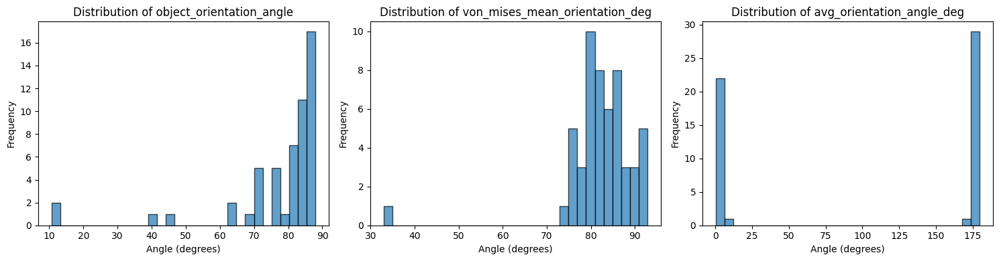


Circular Statistics:
object_orientation_angle: Mean = 77.66°, Circular Variance = 0.036
von_mises_mean_orientation_deg: Mean = 82.37°, Circular Variance = 0.010
avg_orientation_angle_deg: Mean = 162.79°, Circular Variance = 0.862

Circular Correlations:
object_orientation_angle vs von_mises_mean_orientation_deg: 0.330
object_orientation_angle vs avg_orientation_angle_deg: 0.051
von_mises_mean_orientation_deg vs avg_orientation_angle_deg: 0.444

Pearson Correlations (linear approximation):
                                object_orientation_angle  \
object_orientation_angle                        1.000000   
von_mises_mean_orientation_deg                  0.382695   
avg_orientation_angle_deg                       0.051958   

                                von_mises_mean_orientation_deg  \
object_orientation_angle                              0.382695   
von_mises_mean_orientation_deg                        1.000000   
avg_orientation_angle_deg                             0.455676   


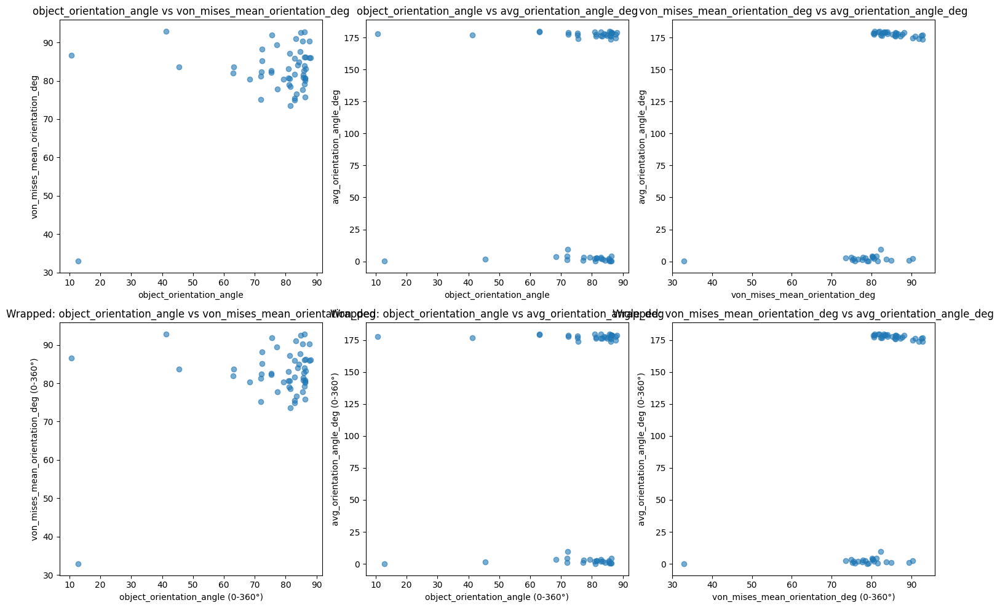

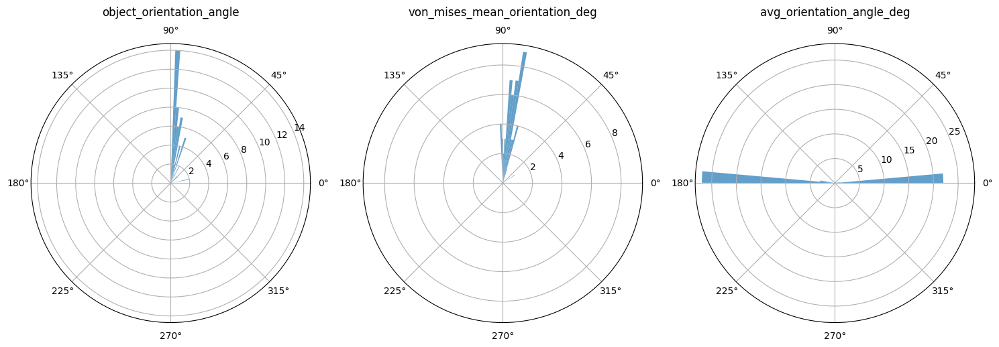

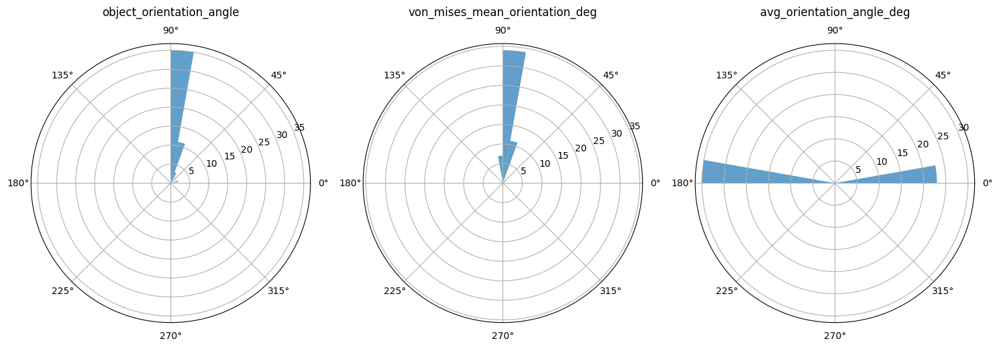

In [32]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import os
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

df['filename'] = df['filename'].apply(lambda x: os.path.splitext(x)[0])
csv_df['filename'] = csv_df['filename'].apply(lambda x: os.path.splitext(x)[0])
# Merge DataFrames on 'filename'
merged_df = pd.merge(df, csv_df, on='filename', how='inner')


orientation_cols = ['object_orientation_angle', 
                   'von_mises_mean_orientation_deg', 
                   'avg_orientation_angle_deg']

# Basic statistics
print("Basic Statistics:")
print(merged_df[orientation_cols].describe())

# Check for missing values
print("\nMissing Values:")
print(merged_df[orientation_cols].isnull().sum())

# Plot distributions
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for i, col in enumerate(orientation_cols):
    axes[i].hist(merged_df[col].dropna(), bins=30, alpha=0.7, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel('Angle (degrees)')
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Circular statistics (since angles are periodic)
def circular_stats(angles_deg):
    angles_rad = np.radians(angles_deg)
    mean_angle_rad = np.arctan2(np.mean(np.sin(angles_rad)), np.mean(np.cos(angles_rad)))
    mean_angle_deg = np.degrees(mean_angle_rad) % 360
    circular_variance = 1 - np.sqrt(np.mean(np.sin(angles_rad))**2 + np.mean(np.cos(angles_rad))**2)
    return mean_angle_deg, circular_variance

print("\nCircular Statistics:")
for col in orientation_cols:
    if merged_df[col].notna().sum() > 0:
        mean_angle, circ_var = circular_stats(merged_df[col].dropna())
        print(f"{col}: Mean = {mean_angle:.2f}°, Circular Variance = {circ_var:.3f}")

# Circular correlation (since angles are periodic)
def circular_correlation(angle1, angle2):
    """Compute circular correlation coefficient between two angular variables"""
    angle1_rad = np.radians(angle1)
    angle2_rad = np.radians(angle2)
    
    # Circular correlation coefficient
    sin_diff1 = np.sin(angle1_rad - np.arctan2(np.sum(np.sin(angle1_rad)), np.sum(np.cos(angle1_rad))))
    sin_diff2 = np.sin(angle2_rad - np.arctan2(np.sum(np.sin(angle2_rad)), np.sum(np.cos(angle2_rad))))
    
    corr = np.sum(sin_diff1 * sin_diff2) / np.sqrt(np.sum(sin_diff1**2) * np.sum(sin_diff2**2))
    return corr

# Compute circular correlations
print("\nCircular Correlations:")
for i in range(len(orientation_cols)):
    for j in range(i+1, len(orientation_cols)):
        col1, col2 = orientation_cols[i], orientation_cols[j]
        valid_idx = merged_df[[col1, col2]].dropna().index
        if len(valid_idx) > 0:
            circ_corr = circular_correlation(merged_df.loc[valid_idx, col1], merged_df.loc[valid_idx, col2])
            print(f"{col1} vs {col2}: {circ_corr:.3f}")

# Regular Pearson correlation (linear approximation)
print("\nPearson Correlations (linear approximation):")
corr_matrix = merged_df[orientation_cols].corr()
print(corr_matrix)

# Scatter plot matrix with circular nature consideration
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Regular scatter plots
for i, (col1, col2) in enumerate([(orientation_cols[0], orientation_cols[1]),
                                 (orientation_cols[0], orientation_cols[2]),
                                 (orientation_cols[1], orientation_cols[2])]):
    axes[0,i].scatter(merged_df[col1], merged_df[col2], alpha=0.6)
    axes[0,i].set_xlabel(col1)
    axes[0,i].set_ylabel(col2)
    axes[0,i].set_title(f'{col1} vs {col2}')

# Circular scatter plots (wrapped to 360 degrees)
for i, (col1, col2) in enumerate([(orientation_cols[0], orientation_cols[1]),
                                 (orientation_cols[0], orientation_cols[2]),
                                 (orientation_cols[1], orientation_cols[2])]):
    x_wrapped = merged_df[col1] % 360
    y_wrapped = merged_df[col2] % 360
    axes[1,i].scatter(x_wrapped, y_wrapped, alpha=0.6)
    axes[1,i].set_xlabel(f'{col1} (0-360°)')
    axes[1,i].set_ylabel(f'{col2} (0-360°)')
    axes[1,i].set_title(f'Wrapped: {col1} vs {col2}')

plt.tight_layout()
plt.show()

# Circular histograms
fig, axes = plt.subplots(1, 3, figsize=(15, 5), subplot_kw=dict(projection='polar'))

for i, col in enumerate(orientation_cols):
    angles_rad = np.radians(merged_df[col].dropna())
    axes[i].hist(angles_rad, bins=36, alpha=0.7)
    axes[i].set_title(col, y=1.08)

plt.tight_layout()
plt.show()

# Rose diagrams
fig, axes = plt.subplots(1, 3, figsize=(15, 5), subplot_kw=dict(projection='polar'))

for i, col in enumerate(orientation_cols):
    angles_rad = np.radians(merged_df[col].dropna())
    n_bins = 36
    count, bin_edges = np.histogram(angles_rad, bins=n_bins, range=(0, 2*np.pi))
    centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
    axes[i].bar(centers, count, width=2*np.pi/n_bins, alpha=0.7)
    axes[i].set_title(col, y=1.08)

plt.tight_layout()
plt.show()






# Merge dataframes and start analyzing

                         filename  circular_mean_orientation
0   400-1837-W1_00001_cropped_1_1                  81.632434
1   400-1837-W1_00004_cropped_1_1                  80.143103
2   400-1837-W2_00001_cropped_1_1                  83.079946
3   400-1837-W2_00003_cropped_1_1                  88.195536
4   400-1837-W2_00004_cropped_1_1                  80.324744
5   400-1837-W2_00006_cropped_1_1                  73.540509
6   400-1837-W2_00007_cropped_1_1                  92.541325
7   400-1837-W2_00008_cropped_1_1                  89.409234
8   400-1837-W2_00013_cropped_1_1                  85.873000
9   400-1837-W3_00001_cropped_1_1                  90.327133
10  400-1837-W3_00012_cropped_1_1                  86.620514
11  400-1837-W5_00002_cropped_1_1                  92.890986
12  400-1837-W5_00021_cropped_1_1                  83.191468
13  400-1837-W5_00022_cropped_1_1                  87.198116
14  400-1837-W5_00025_cropped_1_1                  92.817039
15  400-1837-W5_00084_cr

,filename,object_orientation_angle,von_mises_mean_orientation_deg,avg_orientation_angle_deg,circular_mean_orientation,von_mises_concentration_kappa,nematic_order_parameter,num_cnts,abs_diff_object_von_mises
0,400-1837-W1_00001_cropped_1_1,82.89°,81.63°,179.66°,81.63°,0.60,0.285,525,1.26°
1,400-1837-W1_00004_cropped_1_1,86.35°,80.14°,4.31°,80.14°,0.52,0.250,329,6.20°
2,400-1837-W2_00001_cropped_1_1,80.90°,83.08°,179.57°,83.08°,0.51,0.248,558,2.18°
3,400-1837-W2_00003_cropped_1_1,72.27°,88.20°,178.82°,88.20°,0.90,0.411,363,15.93°
4,400-1837-W2_00004_cropped_1_1,68.38°,80.32°,3.44°,80.32°,0.65,0.307,647,11.94°
5,400-1837-W2_00006_cropped_1_1,81.49°,73.54°,2.58°,73.54°,0.51,0.247,325,7.95°
6,400-1837-W2_00007_cropped_1_1,84.88°,92.54°,176.49°,92.54°,0.65,0.310,353,7.66°
7,400-1837-W2_00008_cropped_1_1,77.19°,89.41°,0.93°,89.41°,0.69,0.327,309,12.22°
8,400-1837-W2_00013_cropped_1_1,82.87°,85.87°,176.52°,85.87°,0.70,0.328,318,3.00°
9,400-1837-W3_00001_cropped_1_1,87.68°,90.33°,174.79°,90.33°,0.80,0.370,339,2.64°


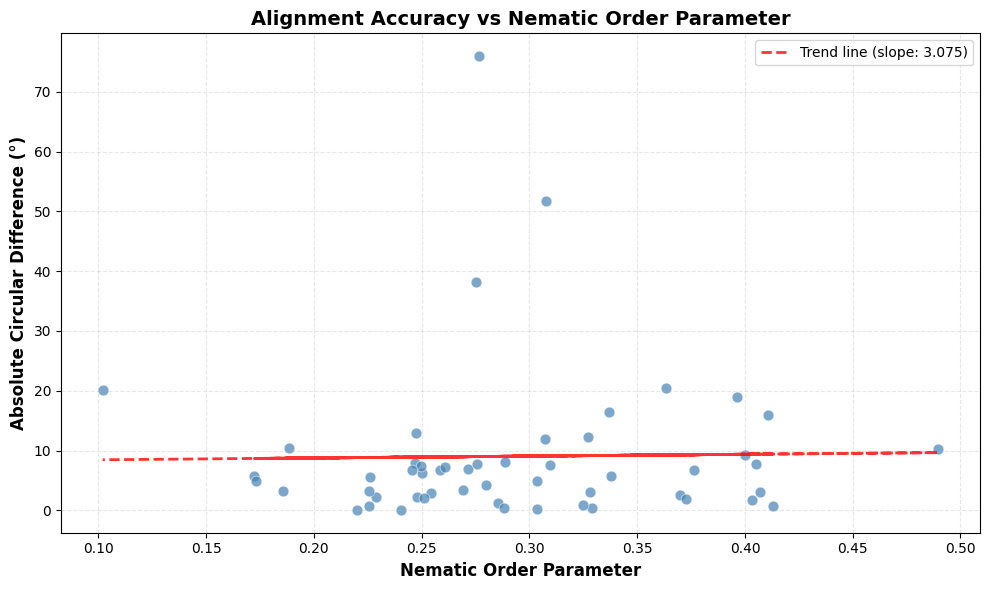

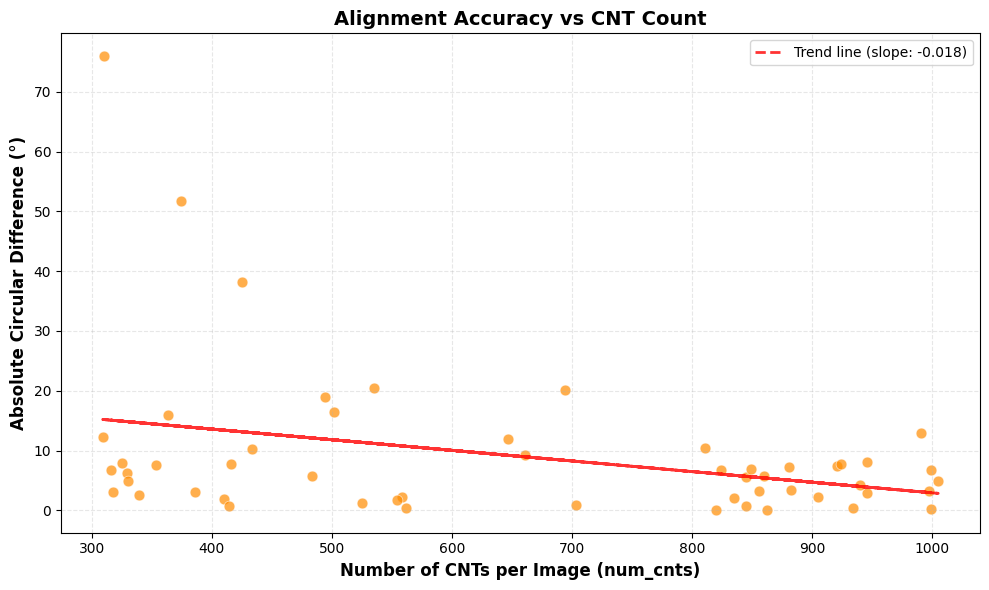

Correlation between num_cnts and abs_diff_object_von_mises: -0.337
Statistical Summary:
Mean absolute difference: 9.06°
Median absolute difference: 5.80°
Standard deviation: 13.09°
Correlation coefficient: 0.018
CIRCULAR DIFFERENCE STATISTICS

Basic Statistics for 'abs_diff_object_von_mises':
  Mean Absolute Error (MAE): 9.06°
  Median Absolute Error: 5.80°
  Standard Deviation: 13.09°
  Maximum Error: 75.96°
  Minimum Error: 0.07°
  25th Percentile: 2.25°
  75th Percentile: 9.27°

Percentage of Images Within Tolerance:
  Within ± 1°:   8/53 ( 15.09%)
  Within ± 2°:  11/53 ( 20.75%)
  Within ± 5°:  24/53 ( 45.28%)
  Within ±10°:  40/53 ( 75.47%)
  Within ±15°:  45/53 ( 84.91%)
  Within ±20°:  48/53 ( 90.57%)
  Within ±30°:  50/53 ( 94.34%)
  Within ±45°:  51/53 ( 96.23%)

Error Distribution:
     0-5°:  24 images ( 45.28%)
    5-10°:  16 images ( 30.19%)
   10-15°:   5 images (  9.43%)
   15-20°:   3 images (  5.66%)
   20-30°:   2 images (  3.77%)
   30-45°:   1 images (  1.89%)
   45

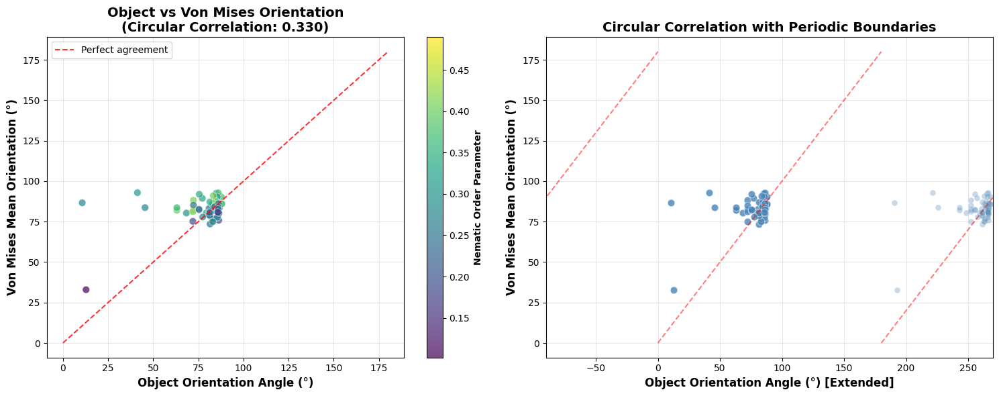

In [40]:
import pandas as pd
from astropy.stats import circmean
import numpy as np

def calculate_circular_difference(angle1, angle2, period=180):
    """
    Calculate the absolute circular difference between two angles in degrees.
    Handles the circular nature where 0 and 180 are the same.
    
    Parameters:
    angle1, angle2: angles in degrees (0-180 range)
    period: period of the circular data (180 for orientation angles)
    
    Returns:
    Absolute circular difference in degrees
    """
    diff = np.abs(angle1 - angle2)
    # For circular data, the shortest distance might be through the period boundary
    circular_diff = np.minimum(diff, period - diff)
    return circular_diff

# Your existing code for calculating circular means
def calculate_circular_means(csv_path):
    """
    Calculate circular mean of orientation angles for each image.
    """
    df = pd.read_csv(csv_path)
    
    def compute_circular_mean(angles):
        # Convert to radians
        angles = 2 * angles
        angles_rad = np.radians(angles)
        # Double the angles to handle 180° periodicity
        # angles_doubled = 2 * angles_rad
        angles_doubled = angles_rad
        # Calculate circular mean
        mean_doubled = circmean(angles_doubled)
        # Convert back to original scale and then to degrees
        mean_angle = np.degrees(mean_doubled / 2)
        # Normalize to [0, 180)
        mean_angle = mean_angle % 180
        return mean_angle
    
    # Calculate circular mean for each image using groupby and apply
    result = df.groupby('image_filename')['orientation_angle_pixels'].apply(
        compute_circular_mean
    ).reset_index()
    result['image_filename'] = result['image_filename'].apply(lambda x: os.path.splitext(x)[0])

    # Rename columns for clarity
    result.columns = ['image_filename', 'circular_mean_orientation']
    
    return result

# Usage
csv_path = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images\high_density_images_results\cnt_object_level_details.csv"
results_df = calculate_circular_means(csv_path)
results_df = results_df.rename(columns={'image_filename': 'filename'})
results_df['filename'] = results_df['filename'].apply(normalize_filename)

print(results_df)

# ---- Merge both DataFrames on 'filename' ----
merged = pd.merge(
    df[['filename', 'object_orientation_angle']],
    csv_df[['filename',
            'von_mises_mean_orientation_deg',
            'avg_orientation_angle_deg',
            'von_mises_concentration_kappa',
            'nematic_order_parameter',
            "num_cnts"]],
    on='filename',
    how='inner'
)

# ---- Add circular mean column ----
merged = pd.merge(
    merged,
    results_df[['filename', 'circular_mean_orientation']],
    on='filename',
    how='left'
)

# ---- Calculate circular differences ----
# Difference between object orientation and von Mises mean
merged['abs_diff_object_von_mises'] = calculate_circular_difference(
    merged['object_orientation_angle'], 
    merged['von_mises_mean_orientation_deg']
)


# ---- Sort for cleaner display ----
merged = merged.sort_values(by='filename').reset_index(drop=True)

merged = merged[[
    'filename',
    'object_orientation_angle',
    'von_mises_mean_orientation_deg',
    'avg_orientation_angle_deg',
    'circular_mean_orientation',
    'von_mises_concentration_kappa',
    'nematic_order_parameter',
    'num_cnts',                         # ✅ newly added
    'abs_diff_object_von_mises'        # ✅ main metric
]]

# ---- Style the table ----
styled_table = (
    merged.style
    .set_caption("Orientation Comparison Table (with num_cnt)")
    .set_table_styles([
        {'selector': 'caption', 'props': [
            ('caption-side', 'top'),
            ('font-size', '16px'),
            ('font-weight', 'bold'),
            ('text-align', 'center'),
            ('color', '#222')
        ]},
        {'selector': 'th', 'props': [
            ('background-color', '#f0f0f0'),
            ('color', '#222'),
            ('font-size', '13px'),
            ('font-weight', 'bold'),
            ('text-align', 'center'),
            ('border', '1px solid #ccc'),
            ('padding', '6px')
        ]},
        {'selector': 'td', 'props': [
            ('text-align', 'center'),
            ('font-size', '12.5px'),
            ('color', '#222'),
            ('padding', '6px'),
            ('border', '1px solid #ddd')
        ]},
        {'selector': 'tr:nth-child(even)', 'props': [
            ('background-color', '#fafafa')
        ]},
        {'selector': 'tr:nth-child(odd)', 'props': [
            ('background-color', '#ffffff')
        ]},
        {'selector': 'tr:hover', 'props': [
            ('background-color', '#f5f5f5')
        ]}
    ])
    .format({
        'object_orientation_angle': '{:.2f}°',
        'von_mises_mean_orientation_deg': '{:.2f}°',
        'avg_orientation_angle_deg': '{:.2f}°',
        'circular_mean_orientation': '{:.2f}°',
        'von_mises_concentration_kappa': '{:.2f}',
        'nematic_order_parameter': '{:.3f}',
        'num_cnt': '{:.0f}',  # ✅ format as integer
        'abs_diff_object_von_mises': '{:.2f}°'
    })
)

display(styled_table)




import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Create the plot
plt.figure(figsize=(10, 6))

# Scatter plot of absolute difference vs nematic order parameter
plt.scatter(
    merged['nematic_order_parameter'],
    merged['abs_diff_object_von_mises'],
    alpha=0.7,
    s=60,
    color='steelblue',
    edgecolor='white',
    linewidth=0.5
)

# Add trend line (optional)
z = np.polyfit(merged['nematic_order_parameter'], merged['abs_diff_object_von_mises'], 1)
p = np.poly1d(z)
plt.plot(
    merged['nematic_order_parameter'], 
    p(merged['nematic_order_parameter']), 
    "r--", 
    alpha=0.8,
    linewidth=2,
    label=f'Trend line (slope: {z[0]:.3f})'
)

# Labels and styling
plt.xlabel("Nematic Order Parameter", fontsize=12, fontweight='bold')
plt.ylabel("Absolute Circular Difference (°)", fontsize=12, fontweight='bold')
plt.title("Alignment Accuracy vs Nematic Order Parameter", fontsize=14, fontweight='bold')

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.3)

# Add legend for the trend line
plt.legend()

# Improve layout
plt.tight_layout()

# Show the plot
plt.show()

plt.figure(figsize=(10, 6))

# Scatter plot of absolute difference vs num_cnt
plt.scatter(
    merged['num_cnts'],
    merged['abs_diff_object_von_mises'],
    alpha=0.7,
    s=60,
    color='darkorange',
    edgecolor='white',
    linewidth=0.5
)

# Add trend line
z = np.polyfit(merged['num_cnts'], merged['abs_diff_object_von_mises'], 1)
p = np.poly1d(z)
plt.plot(
    merged['num_cnts'], 
    p(merged['num_cnts']), 
    "r--", 
    alpha=0.8,
    linewidth=2,
    label=f'Trend line (slope: {z[0]:.3f})'
)

# Labels and styling
plt.xlabel("Number of CNTs per Image (num_cnts)", fontsize=12, fontweight='bold')
plt.ylabel("Absolute Circular Difference (°)", fontsize=12, fontweight='bold')
plt.title("Alignment Accuracy vs CNT Count", fontsize=14, fontweight='bold')

plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

print("Correlation between num_cnts and abs_diff_object_von_mises:",
      f"{merged['num_cnts'].corr(merged['abs_diff_object_von_mises']):.3f}")

# Optional: Print some statistics
print("Statistical Summary:")
print(f"Mean absolute difference: {merged['abs_diff_object_von_mises'].mean():.2f}°")
print(f"Median absolute difference: {merged['abs_diff_object_von_mises'].median():.2f}°")
print(f"Standard deviation: {merged['abs_diff_object_von_mises'].std():.2f}°")
print(f"Correlation coefficient: {merged['nematic_order_parameter'].corr(merged['abs_diff_object_von_mises']):.3f}")



def print_circular_difference_statistics(differences, column_name="abs_diff_object_von_mises"):
    """
    Print comprehensive statistics for circular differences
    """
    diff_series = differences[column_name]
    
    print("=" * 60)
    print("CIRCULAR DIFFERENCE STATISTICS")
    print("=" * 60)
    
    # Basic statistics
    print(f"\nBasic Statistics for '{column_name}':")
    print(f"  Mean Absolute Error (MAE): {diff_series.mean():.2f}°")
    print(f"  Median Absolute Error: {diff_series.median():.2f}°")
    print(f"  Standard Deviation: {diff_series.std():.2f}°")
    print(f"  Maximum Error: {diff_series.max():.2f}°")
    print(f"  Minimum Error: {diff_series.min():.2f}°")
    print(f"  25th Percentile: {diff_series.quantile(0.25):.2f}°")
    print(f"  75th Percentile: {diff_series.quantile(0.75):.2f}°")
    
    # Percentage within tolerance thresholds
    thresholds = [1, 2, 5, 10, 15, 20, 30, 45]
    print(f"\nPercentage of Images Within Tolerance:")
    for threshold in thresholds:
        within_threshold = (diff_series <= threshold).sum()
        percentage = (within_threshold / len(diff_series)) * 100
        print(f"  Within ±{threshold:2d}°: {within_threshold:3d}/{len(diff_series)} ({percentage:6.2f}%)")
    
    # Error distribution bins
    print(f"\nError Distribution:")
    bins = [0, 5, 10, 15, 20, 30, 45, 90, 180]
    bin_labels = ["0-5°", "5-10°", "10-15°", "15-20°", "20-30°", "30-45°", "45-90°", "90-180°"]
    
    for i in range(len(bins)-1):
        count = ((diff_series > bins[i]) & (diff_series <= bins[i+1])).sum()
        percentage = (count / len(diff_series)) * 100
        print(f"  {bin_labels[i]:>7}: {count:3d} images ({percentage:6.2f}%)")
    
    # Count perfect matches (0° difference)
    perfect_matches = (diff_series == 0).sum()
    perfect_percentage = (perfect_matches / len(diff_series)) * 100
    print(f"\n  Perfect matches (0° difference): {perfect_matches}/{len(diff_series)} ({perfect_percentage:.2f}%)")
    
    # Summary statistics
    print(f"\nSummary:")
    print(f"  Total images analyzed: {len(diff_series)}")
    print(f"  Mean error: {diff_series.mean():.2f}° ± {diff_series.std():.2f}°")
    print(f"  Median error: {diff_series.median():.2f}°")
    
    # Performance metrics
    within_5_deg = (diff_series <= 5).sum() / len(diff_series) * 100
    within_10_deg = (diff_series <= 10).sum() / len(diff_series) * 100
    within_30_deg = (diff_series <= 30).sum() / len(diff_series) * 100
    
    print(f"\nPerformance Metrics:")
    print(f"  Within 5°:  {within_5_deg:.1f}%")
    print(f"  Within 10°: {within_10_deg:.1f}%") 
    print(f"  Within 30°: {within_30_deg:.1f}%")

# Add this after your existing code, right before or after your plots:

print_circular_difference_statistics(merged)

# Additional correlation analysis
print("\n" + "=" * 60)
print("CORRELATION ANALYSIS")
print("=" * 60)
print(f"Correlation with nematic order parameter: {merged['nematic_order_parameter'].corr(merged['abs_diff_object_von_mises']):.3f}")
print(f"Correlation with CNT count: {merged['num_cnts'].corr(merged['abs_diff_object_von_mises']):.3f}")
print(f"Correlation with concentration kappa: {merged['von_mises_concentration_kappa'].corr(merged['abs_diff_object_von_mises']):.3f}")

# Error analysis by CNT count ranges
print(f"\nError Analysis by CNT Count Ranges:")
cnt_bins = [0, 10, 20, 30, 50, 100, float('inf')]
cnt_labels = ["<10", "10-20", "20-30", "30-50", "50-100", ">100"]

for i in range(len(cnt_bins)-1):
    if i == len(cnt_bins)-2:  # Last bin
        mask = merged['num_cnts'] >= cnt_bins[i]
    else:
        mask = (merged['num_cnts'] >= cnt_bins[i]) & (merged['num_cnts'] < cnt_bins[i+1])
    
    if mask.any():
        subset = merged[mask]
        mean_error = subset['abs_diff_object_von_mises'].mean()
        count = len(subset)
        print(f"  CNT count {cnt_labels[i]}: {count:2d} images, mean error: {mean_error:.2f}°")




import pandas as pd
import numpy as np
from astropy.stats import circmean, circcorrcoef
from astropy import units as u

def calculate_circular_correlation(angle1, angle2):
    """
    Calculate circular correlation coefficient between two circular variables.
    
    Parameters:
    angle1, angle2: arrays of angles in degrees
    
    Returns:
    Circular correlation coefficient (dimensionless)
    """
    # Convert to radians as required by circcorrcoef
    alpha_rad = np.radians(angle1)
    beta_rad = np.radians(angle2)
    
    # Calculate circular correlation coefficient
    rho = circcorrcoef(alpha_rad, beta_rad)
    return rho

def calculate_circular_correlation_units(angle1, angle2):
    """
    Calculate circular correlation using Astropy quantities for better unit handling.
    """
    # Create Astropy quantity objects with degree units
    alpha = angle1 * u.deg
    beta = angle2 * u.deg
    
    # circcorrcoef automatically handles unit conversion
    rho = circcorrcoef(alpha, beta)
    return rho.value  # Return as dimensionless value

# Add circular correlation analysis to your existing code
def add_circular_correlation_analysis(merged_df):
    """
    Add comprehensive circular correlation analysis to the merged dataframe
    """
    results = {}
    
    # Calculate circular correlations between key orientation measures
    correlation_pairs = [
        ('object_orientation_angle', 'von_mises_mean_orientation_deg'),
        ('object_orientation_angle', 'circular_mean_orientation'),
        ('von_mises_mean_orientation_deg', 'circular_mean_orientation'),
        ('object_orientation_angle', 'avg_orientation_angle_deg')
    ]
    
    print("=" * 70)
    print("CIRCULAR CORRELATION ANALYSIS")
    print("=" * 70)
    
    for col1, col2 in correlation_pairs:
        if col1 in merged_df.columns and col2 in merged_df.columns:
            # Remove any NaN values for correlation calculation
            valid_mask = merged_df[[col1, col2]].notna().all(axis=1)
            if valid_mask.sum() > 0:
                angle1_clean = merged_df.loc[valid_mask, col1]
                angle2_clean = merged_df.loc[valid_mask, col2]
                
                # Calculate circular correlation
                circ_corr = calculate_circular_correlation(angle1_clean, angle2_clean)
                
                # Also calculate linear correlation for comparison
                lin_corr = angle1_clean.corr(angle2_clean)
                
                results[f"{col1}_vs_{col2}"] = {
                    'circular_correlation': circ_corr,
                    'linear_correlation': lin_corr,
                    'n_samples': len(angle1_clean)
                }
                
                print(f"{col1} vs {col2}:")
                print(f"  Circular correlation: {circ_corr:.4f}")
                print(f"  Linear correlation:   {lin_corr:.4f}")
                print(f"  Sample size:         {len(angle1_clean)}")
                print("-" * 50)
    
    return results

# Apply to your merged dataframe
correlation_results = add_circular_correlation_analysis(merged)

def grouped_circular_correlation(merged_df):
    """
    Calculate circular correlations within different CNT count groups
    """
    print("\nGROUPED CIRCULAR CORRELATION ANALYSIS")
    print("=" * 50)
    
    # Define CNT count ranges
    cnt_bins = [0, 10, 20, 30, 50, float('inf')]
    cnt_labels = ["<10", "10-20", "20-30", "30-50", ">50"]
    
    merged_df['cnt_group'] = pd.cut(merged_df['num_cnts'], bins=cnt_bins, labels=cnt_labels)
    
    group_results = {}
    
    for group in cnt_labels:
        group_data = merged_df[merged_df['cnt_group'] == group]
        if len(group_data) > 2:  # Need at least 3 points for meaningful correlation
            valid_mask = group_data[['object_orientation_angle', 'von_mises_mean_orientation_deg']].notna().all(axis=1)
            if valid_mask.sum() > 2:
                angle1 = group_data.loc[valid_mask, 'object_orientation_angle']
                angle2 = group_data.loc[valid_mask, 'von_mises_mean_orientation_deg']
                
                circ_corr = calculate_circular_correlation(angle1, angle2)
                group_results[group] = circ_corr
                
                print(f"CNT count {group}:")
                print(f"  Circular correlation: {circ_corr:.4f}")
                print(f"  Number of images:    {len(angle1)}")
                print("-" * 30)
    
    return group_results

group_correlations = grouped_circular_correlation(merged)


# Enhance your existing correlation analysis section
print("\n" + "=" * 70)
print("ENHANCED CORRELATION ANALYSIS")
print("=" * 70)

# Existing linear correlations
print("Linear Correlations (Pearson):")
print(f"  With nematic order parameter: {merged['nematic_order_parameter'].corr(merged['abs_diff_object_von_mises']):.3f}")
print(f"  With CNT count: {merged['num_cnts'].corr(merged['abs_diff_object_von_mises']):.3f}")
print(f"  With concentration kappa: {merged['von_mises_concentration_kappa'].corr(merged['abs_diff_object_von_mises']):.3f}")

# New circular correlation for orientation agreement
print("\nCircular Correlation (Object vs Von Mises orientation):")
obj_von_mises_circ_corr = calculate_circular_correlation(
    merged['object_orientation_angle'].dropna(),
    merged['von_mises_mean_orientation_deg'].dropna()
)
print(f"  Circular correlation coefficient: {obj_von_mises_circ_corr:.4f}")

# Interpret the results
print("\nInterpretation:")
if abs(obj_von_mises_circ_corr) > 0.7:
    print("  Strong circular relationship between orientations")
elif abs(obj_von_mises_circ_corr) > 0.4:
    print("  Moderate circular relationship between orientations")
elif abs(obj_von_mises_circ_corr) > 0.2:
    print("  Weak circular relationship between orientations")
else:
    print("  Very weak or no circular relationship between orientations")


import matplotlib.pyplot as plt
import numpy as np
from astropy.stats import circcorrcoef
import seaborn as sns

def plot_circular_correlation_scatter(merged_df):
    """
    Create a circular scatter plot showing the relationship between 
    object orientation and von Mises orientation
    """
    # Clean data
    valid_mask = merged_df[['object_orientation_angle', 'von_mises_mean_orientation_deg']].notna().all(axis=1)
    obj_angles = merged_df.loc[valid_mask, 'object_orientation_angle']
    von_mises_angles = merged_df.loc[valid_mask, 'von_mises_mean_orientation_deg']
    
    # Calculate circular correlation
    circ_corr = calculate_circular_correlation(obj_angles, von_mises_angles)
    
    # Create the plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot 1: Regular scatter plot
    scatter = ax1.scatter(obj_angles, von_mises_angles, 
                         c=merged_df.loc[valid_mask, 'nematic_order_parameter'],
                         cmap='viridis', alpha=0.7, s=60, edgecolor='white', linewidth=0.5)
    
    ax1.plot([0, 180], [0, 180], 'r--', alpha=0.8, label='Perfect agreement')
    ax1.set_xlabel('Object Orientation Angle (°)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Von Mises Mean Orientation (°)', fontsize=12, fontweight='bold')
    ax1.set_title(f'Object vs Von Mises Orientation\n(Circular Correlation: {circ_corr:.3f})', 
                  fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # Add colorbar for nematic order parameter
    cbar = plt.colorbar(scatter, ax=ax1)
    cbar.set_label('Nematic Order Parameter', fontsize=10, fontweight='bold')
    
    # Plot 2: Circular scatter plot with periodic boundaries
    # Create extended plot to show circular nature
    extended_obj = np.concatenate([obj_angles, obj_angles + 180, obj_angles - 180])
    extended_von_mises = np.concatenate([von_mises_angles, von_mises_angles, von_mises_angles])
    
    ax2.scatter(extended_obj, extended_von_mises, alpha=0.3, s=40, 
               color='steelblue', edgecolor='white', linewidth=0.3)
    
    # Plot the main region with higher opacity
    main_mask = (extended_obj >= 0) & (extended_obj <= 180)
    ax2.scatter(extended_obj[main_mask], extended_von_mises[main_mask], 
               alpha=0.7, s=60, color='steelblue', edgecolor='white', linewidth=0.5)
    
    # Add periodic boundaries
    for offset in [-180, 0, 180]:
        ax2.plot([0 + offset, 180 + offset], [0, 180], 'r--', alpha=0.5, 
                label='Perfect agreement' if offset == 0 else "")
    
    ax2.set_xlabel('Object Orientation Angle (°) [Extended]', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Von Mises Mean Orientation (°)', fontsize=12, fontweight='bold')
    ax2.set_title('Circular Correlation with Periodic Boundaries', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    ax2.set_xlim(-90, 270)
    
    plt.tight_layout()
    plt.show()
    
    return circ_corr

# Generate the plot
circ_corr_value = plot_circular_correlation_scatter(merged)


In [36]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# ---- Parameters ----
image_dir = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\cherry_picked_images_new_dataset\High density images\high_density_images_results"  
image_ext = ".png"  

# ---- Output folder ----
output_dir = os.path.join(image_dir, "FFT_vs_circular_mean")
os.makedirs(output_dir, exist_ok=True)

# ---- Loop through images ----
for idx, row in merged.iterrows():
    filename = row['filename']
    object_angle = row['object_orientation_angle']
    von_mises_angle = row['von_mises_mean_orientation_deg']
    circular_angle = row.get('circular_mean_orientation', np.nan)

    # Full path
    img_path = os.path.join(image_dir, f"{filename}{image_ext}")
    if not os.path.exists(img_path):
        print(f"⚠️ Image not found: {img_path}")
        continue

    # ---- Load image ----
    img = mpimg.imread(img_path)
    h, w = img.shape[:2]
    cx, cy = w / 2, h / 2  # image center

    # ---- Prepare plot ----
    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap='gray', origin='upper')
    plt.axis('off')

    # ---- Line length ----
    line_len = min(w, h) / 3

    # ---- Helper function to draw orientation lines ----
    def draw_orientation(angle_deg, color, label, style='-'):
        if np.isnan(angle_deg):
            return
        ang_rad = np.deg2rad(angle_deg)
        dx = np.cos(ang_rad)
        dy = -np.sin(ang_rad)  # flip y for image coordinates
        x1, x2 = cx - line_len * dx, cx + line_len * dx
        y1, y2 = cy - line_len * dy, cy + line_len * dy
        plt.plot([x1, x2], [y1, y2], color=color, lw=2, linestyle=style, label=label)

    # ---- Draw all lines ----
    draw_orientation(object_angle, 'red', f"Object: {object_angle:.1f}°")
    draw_orientation(von_mises_angle, 'blue', f"Von Mises: {von_mises_angle:.1f}°", style='--')
    draw_orientation(circular_angle, 'green', f"Circular Mean: {circular_angle:.1f}°", style=':')

    # ---- Add legend and title ----
    plt.legend(loc='upper right', fontsize=9, frameon=True)
    plt.title(f"{filename}", fontsize=10, pad=10)
    plt.tight_layout()

    # ---- Save the figure ----
    save_path = os.path.join(output_dir, f"{filename}_FFT_vs_circular_mean.png")
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.close()  # close figure to save memory


DATA DISTRIBUTION ANALYSIS:

object_orientation_angle:
  Range: 10.7° to 88.0°
  Mean: 77.1°
  Std: 16.1°
  Points near boundaries (0° or 180°): 0/53

von_mises_mean_orientation_deg:
  Range: 32.9° to 92.9°
  Mean: 82.3°
  Std: 8.5°
  Points near boundaries (0° or 180°): 0/53

avg_orientation_angle_deg:
  Range: 0.1° to 179.9°
  Mean: 101.5°
  Std: 87.7°
  Points near boundaries (0° or 180°): 53/53

RELATIONSHIP ANALYSIS:
Mean circular difference: 9.1°
Std of circular differences: 13.1°


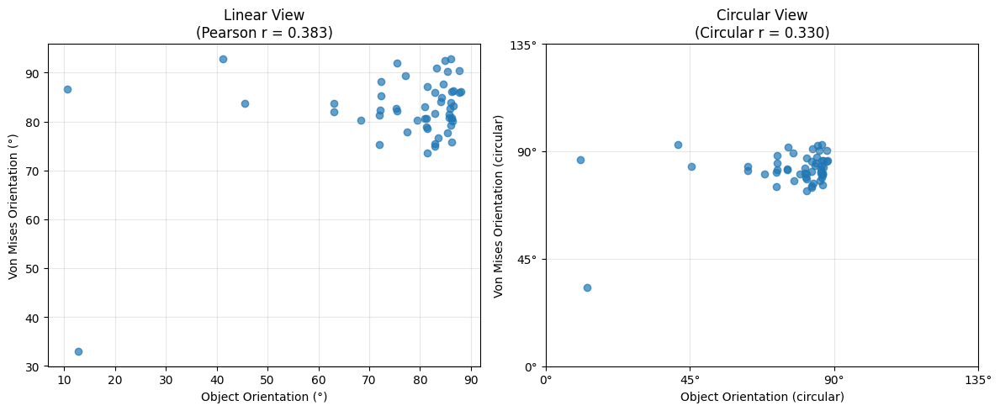

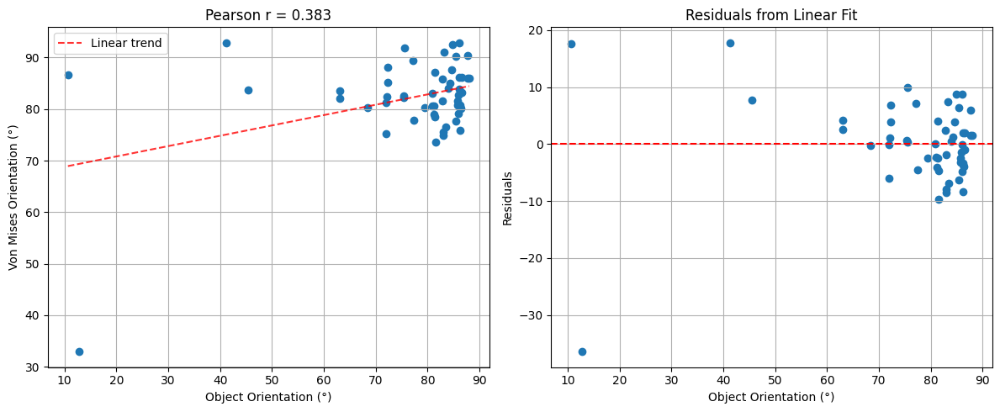

In [17]:
# DIAGNOSTIC: Understand why circular correlation is low
print("DATA DISTRIBUTION ANALYSIS:")
print("=" * 50)

for col in ['object_orientation_angle', 'von_mises_mean_orientation_deg', 'avg_orientation_angle_deg']:
    if col in merged_df.columns:
        angles = merged_df[col].dropna()
        print(f"\n{col}:")
        print(f"  Range: {angles.min():.1f}° to {angles.max():.1f}°")
        print(f"  Mean: {angles.mean():.1f}°")
        print(f"  Std: {angles.std():.1f}°")
        
        # Check if data wraps around 0°/180° boundary
        near_zero = ((angles < 10) | (angles > 170)).sum()
        print(f"  Points near boundaries (0° or 180°): {near_zero}/{len(angles)}")

# Check the actual relationship
print("\nRELATIONSHIP ANALYSIS:")
valid_data = merged_df[['object_orientation_angle', 'von_mises_mean_orientation_deg']].dropna()

# Calculate the difference (circularly)
def circular_diff(a, b):
    """Calculate minimal circular difference between two angles"""
    diff = np.abs(a - b)
    return np.minimum(diff, 180 - diff)

diffs = circular_diff(valid_data['object_orientation_angle'], 
                     valid_data['von_mises_mean_orientation_deg'])
print(f"Mean circular difference: {diffs.mean():.1f}°")
print(f"Std of circular differences: {diffs.std():.1f}°")

# Plot to see the actual pattern
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Regular scatter plot
ax1.scatter(valid_data['object_orientation_angle'], 
           valid_data['von_mises_mean_orientation_deg'], alpha=0.7)
ax1.set_xlabel('Object Orientation (°)')
ax1.set_ylabel('Von Mises Orientation (°)')
ax1.set_title('Linear View\n(Pearson r = {:.3f})'.format(
    pearsonr(valid_data['object_orientation_angle'], 
             valid_data['von_mises_mean_orientation_deg'])[0]))
ax1.grid(True, alpha=0.3)

# Circular scatter plot
theta1 = np.radians(valid_data['object_orientation_angle'] * 2)
theta2 = np.radians(valid_data['von_mises_mean_orientation_deg'] * 2)
ax2.scatter(theta1, theta2, alpha=0.7)
ax2.set_xlabel('Object Orientation (circular)')
ax2.set_ylabel('Von Mises Orientation (circular)')
ax2.set_title('Circular View\n(Circular r = {:.3f})'.format(
    circular_correlation(valid_data['object_orientation_angle'], 
                        valid_data['von_mises_mean_orientation_deg'])))
ax2.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2])
ax2.set_xticklabels(['0°', '45°', '90°', '135°'])
ax2.set_yticks([0, np.pi/2, np.pi, 3*np.pi/2])
ax2.set_yticklabels(['0°', '45°', '90°', '135°'])
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


# Check if the relationship is approximately linear
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Object vs Von Mises
valid_data = merged_df[['object_orientation_angle', 'von_mises_mean_orientation_deg']].dropna()
ax1.scatter(valid_data['object_orientation_angle'], valid_data['von_mises_mean_orientation_deg'])
ax1.set_xlabel('Object Orientation (°)')
ax1.set_ylabel('Von Mises Orientation (°)')
ax1.set_title(f'Pearson r = {pearsonr(valid_data["object_orientation_angle"], valid_data["von_mises_mean_orientation_deg"])[0]:.3f}')
ax1.grid(True)

# Add trend line
z = np.polyfit(valid_data['object_orientation_angle'], valid_data['von_mises_mean_orientation_deg'], 1)
p = np.poly1d(z)
x_range = np.linspace(valid_data['object_orientation_angle'].min(), valid_data['object_orientation_angle'].max(), 100)
ax1.plot(x_range, p(x_range), 'r--', alpha=0.8, label='Linear trend')
ax1.legend()

# Check residuals (should be random if relationship is linear)
residuals = valid_data['von_mises_mean_orientation_deg'] - p(valid_data['object_orientation_angle'])
ax2.scatter(valid_data['object_orientation_angle'], residuals)
ax2.axhline(y=0, color='r', linestyle='--')
ax2.set_xlabel('Object Orientation (°)')
ax2.set_ylabel('Residuals')
ax2.set_title('Residuals from Linear Fit')
ax2.grid(True)

plt.tight_layout()
plt.show()

# Correlate Orientations 

+----+-------------------------------+----------------------------+-----------+-----------------------------------------------------------+------------------------------------------------------------+-----------------------------------------------------------+----------------------------------+---------------------------------------------------------+----------------------------------------------------------+---------------------------------------------------------+--------------------------------+----------------------------------+---------------------------------+-------------------------------+-------------------------------+---------------------------+------------------------------+----------------------+------------+-----------------------+---------------------+---------------------+-----------------+-----------------+--------------------+--------------------+----------------+----------------+--------------------+--------------------+----------------+----------------+-------------

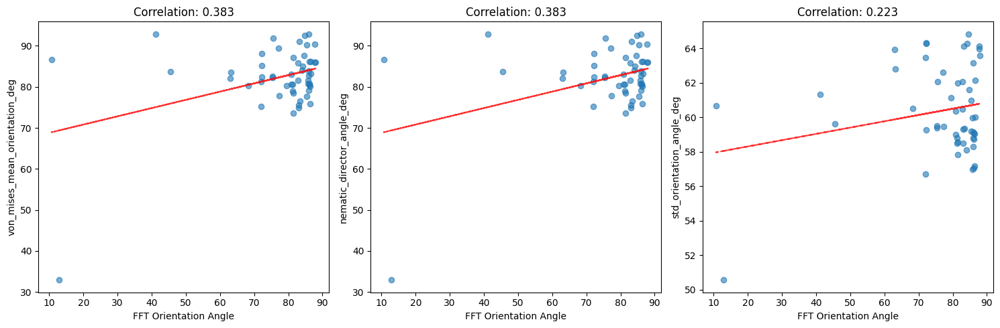


Correlation with density-related columns:
                                              column  pearson_correlation  \
3  line_density_horizontal_lines_mean_intersectio...               0.2623   
0                     horizontal_density_cnts_per_um               0.2623   
2                                cnt_density_per_um2               0.2225   
4  line_density_vertical_lines_mean_intersections...               0.1157   
1                       vertical_density_cnts_per_um               0.1157   

   pearson_p_value  spearman_correlation  spearman_p_value  
3           0.0577                0.0944            0.5013  
0           0.0577                0.0944            0.5013  
2           0.1094                0.1051            0.4538  
4           0.4094                0.0110            0.9379  
1           0.4094                0.0110            0.9379  


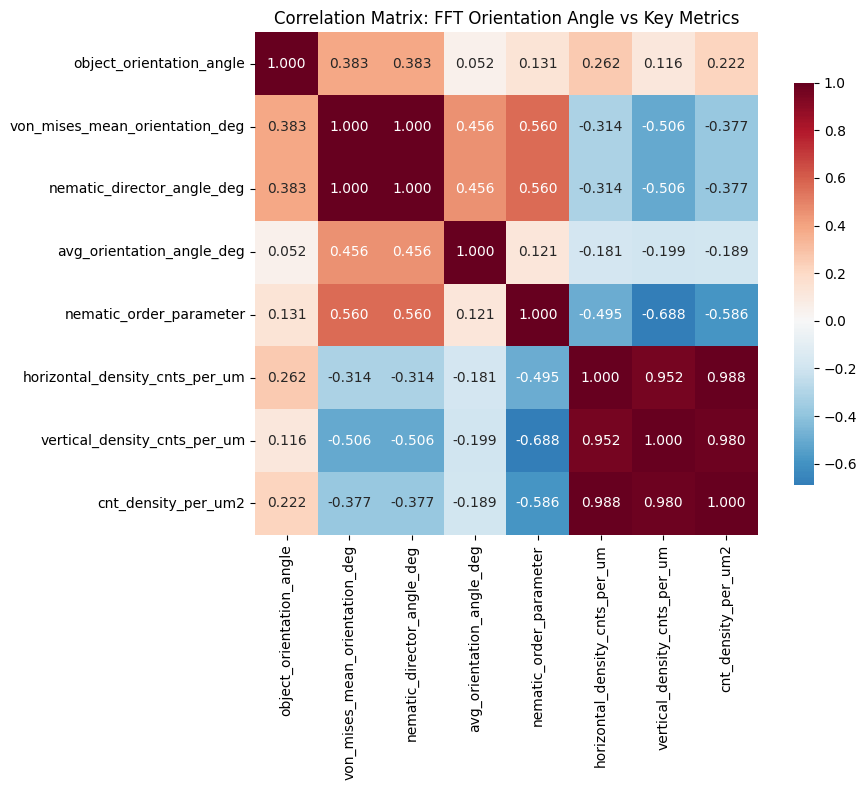

Statistical Summary:
FFT Orientation Angle - Mean: 77.07
FFT Orientation Angle - Std: 16.14
FFT Orientation Angle - Range: 10.66 to 88.02

Significant correlations (p < 0.05): 2
Most strongly correlated columns:
  von_mises_mean_orientation_deg: moderate positive correlation (r = 0.383)
  nematic_director_angle_deg: moderate positive correlation (r = 0.383)

Circular Correlation Analysis:
FFT vs von_mises_mean_orientation_deg: Circular correlation = 0.330
FFT vs nematic_director_angle_deg: Circular correlation = 0.330
FFT vs avg_orientation_angle_deg: Circular correlation = 0.051


In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from tabulate import tabulate

density_freq = "density_freq"
spacing_um = "spacing_um"
ff_col= 'fft_orientation_angle'
obj_orientation_col= "object_orientation_angle"
corr_col = obj_orientation_col
# Merge the dataframes on filename
merged_df = pd.merge(df[['filename', corr_col]], 
                    csv_df, 
                    on='filename', 
                    how='inner')

print(tabulate(merged_df.head(), headers='keys', tablefmt='psql'))



# Orientation-related columns that are most likely to correlate
orientation_columns = [
    'von_mises_mean_orientation_deg',
    'nematic_director_angle_deg', 
    'avg_orientation_angle_deg',
    'std_orientation_angle_deg',
    'nematic_order_parameter'
]

# Calculate correlations
correlation_results = []
for col in orientation_columns:
    if col in merged_df.columns:
        # Remove NaN values for correlation calculation
        valid_data = merged_df[[corr_col, col]].dropna()
        
        if len(valid_data) > 0:
            pearson_corr, pearson_p = pearsonr(valid_data[corr_col], valid_data[col])
            spearman_corr, spearman_p = spearmanr(valid_data[corr_col], valid_data[col])
            
            correlation_results.append({
                'column': col,
                'pearson_correlation': pearson_corr,
                'pearson_p_value': pearson_p,
                'spearman_correlation': spearman_corr,
                'spearman_p_value': spearman_p,
                'n_samples': len(valid_data)
            })

# Create correlation results dataframe
corr_df = pd.DataFrame(correlation_results)
corr_df = corr_df.sort_values('pearson_correlation', key=abs, ascending=False)
print("Correlation with orientation-related columns:")
print(corr_df.round(4))

# Plot top correlations
top_correlations = corr_df.head(3)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for idx, (_, row) in enumerate(top_correlations.iterrows()):
    ax = axes[idx]
    col = row['column']
    
    # Scatter plot
    ax.scatter(merged_df[corr_col], merged_df[col], alpha=0.6)
    ax.set_xlabel('FFT Orientation Angle')
    ax.set_ylabel(col)
    ax.set_title(f'Correlation: {row["pearson_correlation"]:.3f}')
    
    # Add trend line
    z = np.polyfit(merged_df[corr_col].dropna(), 
                   merged_df[col].dropna(), 1)
    p = np.poly1d(z)
    ax.plot(merged_df[corr_col], 
            p(merged_df[corr_col]), "r--", alpha=0.8)

plt.tight_layout()
plt.show()

# Density-related columns
density_columns = [
    'horizontal_density_cnts_per_um',
    'vertical_density_cnts_per_um', 
    'cnt_density_per_um2',
    'line_density_horizontal_lines_mean_intersections_per_row',
    'line_density_vertical_lines_mean_intersections_per_row'
]

density_correlations = []
for col in density_columns:
    if col in merged_df.columns:
        valid_data = merged_df[[corr_col, col]].dropna()
        
        if len(valid_data) > 0:
            pearson_corr, pearson_p = pearsonr(valid_data[corr_col], valid_data[col])
            spearman_corr, spearman_p = spearmanr(valid_data[corr_col], valid_data[col])
            
            density_correlations.append({
                'column': col,
                'pearson_correlation': pearson_corr,
                'pearson_p_value': pearson_p,
                'spearman_correlation': spearman_corr,
                'spearman_p_value': spearman_p
            })

density_corr_df = pd.DataFrame(density_correlations)
density_corr_df = density_corr_df.sort_values('pearson_correlation', key=abs, ascending=False)
print("\nCorrelation with density-related columns:")
print(density_corr_df.round(4))

# Select key columns for comprehensive correlation analysis
key_columns = [
    corr_col,
    'von_mises_mean_orientation_deg',
    'nematic_director_angle_deg',
    'avg_orientation_angle_deg', 
    'nematic_order_parameter',
    'horizontal_density_cnts_per_um',
    'vertical_density_cnts_per_um',
    'cnt_density_per_um2'
]

# Filter to columns that exist in the merged dataframe
available_columns = [col for col in key_columns if col in merged_df.columns]
correlation_matrix = merged_df[available_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', center=0,
            square=True, fmt='.3f', cbar_kws={'shrink': 0.8})
plt.title('Correlation Matrix: FFT Orientation Angle vs Key Metrics')
plt.tight_layout()
plt.show()

# Statistical summary
print("Statistical Summary:")
print(f"FFT Orientation Angle - Mean: {merged_df[corr_col].mean():.2f}")
print(f"FFT Orientation Angle - Std: {merged_df[corr_col].std():.2f}")
print(f"FFT Orientation Angle - Range: {merged_df[corr_col].min():.2f} to {merged_df[corr_col].max():.2f}")

# Interpretation of results
significant_correlations = corr_df[corr_df['pearson_p_value'] < 0.05]

print(f"\nSignificant correlations (p < 0.05): {len(significant_correlations)}")
if len(significant_correlations) > 0:
    print("Most strongly correlated columns:")
    for _, row in significant_correlations.head().iterrows():
        strength = "strong" if abs(row['pearson_correlation']) > 0.5 else "moderate" if abs(row['pearson_correlation']) > 0.3 else "weak"
        direction = "positive" if row['pearson_correlation'] > 0 else "negative"
        print(f"  {row['column']}: {strength} {direction} correlation (r = {row['pearson_correlation']:.3f})")

# If orientation angles are circular (0-180 degrees), consider circular statistics
from scipy.stats import circmean, circstd

def circular_correlation(angles1, angles2):
    """Calculate circular correlation for angular data"""
    # Convert to radians
    angles1_rad = np.radians(angles1)
    angles2_rad = np.radians(angles2)
    
    # Calculate circular correlation coefficient
    n = len(angles1_rad)
    sin_diff1 = np.sin(angles1_rad - circmean(angles1_rad))
    sin_diff2 = np.sin(angles2_rad - circmean(angles2_rad))
    
    numerator = np.sum(sin_diff1 * sin_diff2)
    denominator = np.sqrt(np.sum(sin_diff1**2) * np.sum(sin_diff2**2))
    
    return numerator / denominator

# Apply circular correlation to orientation columns
print("\nCircular Correlation Analysis:")
for col in ['von_mises_mean_orientation_deg', 'nematic_director_angle_deg', 'avg_orientation_angle_deg']:
    if col in merged_df.columns:
        valid_data = merged_df[[corr_col, col]].dropna()
        if len(valid_data) > 10:  # Minimum sample size
            circ_corr = circular_correlation(valid_data[corr_col], valid_data[col])
            print(f"FFT vs {col}: Circular correlation = {circ_corr:.3f}")

CIRCULAR ORIENTATION DIFFERENCE ANALYSIS

Sample size: 53

ABSOLUTE CIRCULAR DISTANCES (0-90° range):
FFT vs Von Mises: 9.06° ± 13.09°
FFT vs Avg Orientation: 77.24° ± 16.36°
Von Mises vs Avg Orientation: 81.09° ± 8.58°

SIGNED CIRCULAR DIFFERENCES (-90° to +90° range):
FFT vs Von Mises: -5.19° ± 15.09°
FFT vs Avg Orientation: 63.86° ± 46.82°


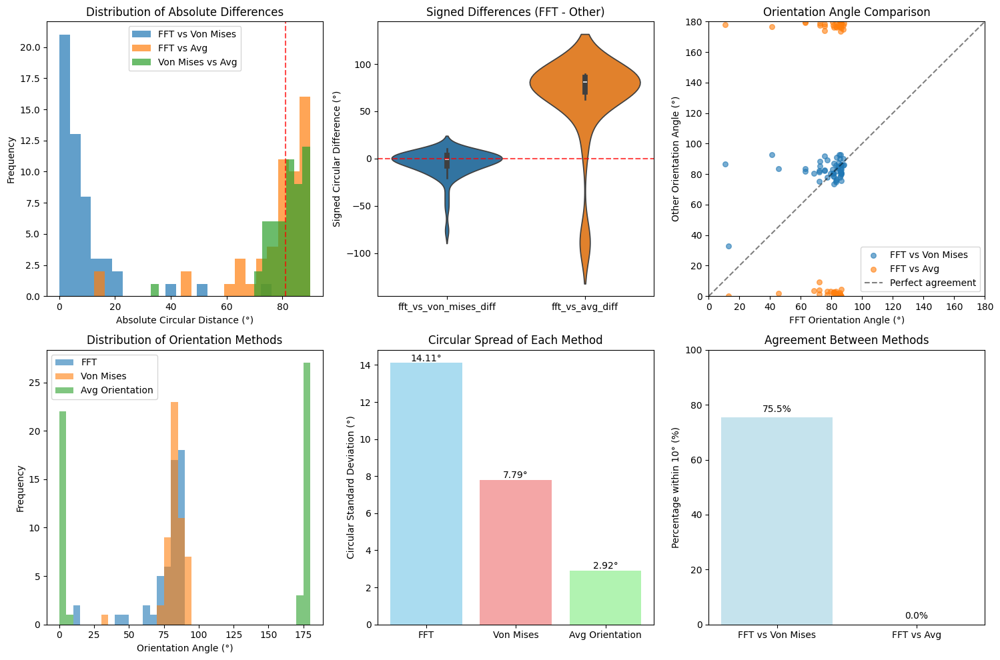


DETAILED CIRCULAR STATISTICS FOR EACH METHOD

FFT:
  Circular Mean: 79.20°
  Circular Std: 14.11°
  Linear Mean: 77.07°
  Linear Std: 15.99°

Von Mises:
  Circular Mean: 82.65°
  Circular Std: 7.79°
  Linear Mean: 82.26°
  Linear Std: 8.38°

Avg Orientation:
  Circular Mean: 179.63°
  Circular Std: 2.92°
  Linear Mean: 101.52°
  Linear Std: 86.91°

AGREEMENT ANALYSIS

Within 5° agreement:
  FFT vs Von Mises: 45.3%
  FFT vs Avg: 0.0%

Within 10° agreement:
  FFT vs Von Mises: 75.5%
  FFT vs Avg: 0.0%

Within 15° agreement:
  FFT vs Von Mises: 84.9%
  FFT vs Avg: 3.8%

Within 20° agreement:
  FFT vs Von Mises: 90.6%
  FFT vs Avg: 3.8%

SYSTEMATIC BIAS ANALYSIS
FFT tends to be 5.19° lower than Von Mises
FFT tends to be 63.86° higher than Average Orientation

Samples with large disagreement (>30°) between FFT and Von Mises: 3
These might represent cases where the methods fundamentally disagree


In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import circmean, circstd, circvar
import seaborn as sns

def circular_difference(angle1, angle2, period=180):
    """
    Calculate the minimal circular difference between two angles (0-180° range)
    Returns difference in degrees (-90° to +90°)
    """
    diff = angle1 - angle2
    # Wrap differences to the range [-period/2, period/2]
    diff = np.mod(diff + period/2, period) - period/2
    return diff

def circular_distance(angle1, angle2, period=180):
    """
    Calculate absolute circular distance (always positive, 0-90°)
    """
    diff = np.abs(angle1 - angle2)
    return np.minimum(diff, period - diff)

def circular_descriptive_stats(angles, period=180):
    """
    Calculate circular descriptive statistics
    """
    angles_rad = np.radians(angles) * 2  # Convert to radians and double for 0-180° range
    mean_circ = np.degrees(circmean(angles_rad)) / 2
    std_circ = np.degrees(circstd(angles_rad)) / 2
    var_circ = np.degrees(circvar(angles_rad)) / 2
    
    return {
        'circular_mean': mean_circ,
        'circular_std': std_circ,
        'circular_variance': var_circ,
        'linear_mean': np.mean(angles),
        'linear_std': np.std(angles)
    }

# Calculate circular differences
valid_data = merged_df[[corr_col, 'von_mises_mean_orientation_deg', 'avg_orientation_angle_deg']].dropna()

print("="*60)
print("CIRCULAR ORIENTATION DIFFERENCE ANALYSIS")
print("="*60)

# 1. Calculate differences between methods
valid_data['fft_vs_von_mises_diff'] = circular_difference(valid_data[corr_col], valid_data['von_mises_mean_orientation_deg'])
valid_data['fft_vs_avg_diff'] = circular_difference(valid_data[corr_col], valid_data['avg_orientation_angle_deg'])
valid_data['von_mises_vs_avg_diff'] = circular_difference(valid_data['von_mises_mean_orientation_deg'], valid_data['avg_orientation_angle_deg'])

# 2. Calculate absolute distances
valid_data['fft_vs_von_mises_dist'] = circular_distance(valid_data[corr_col], valid_data['von_mises_mean_orientation_deg'])
valid_data['fft_vs_avg_dist'] = circular_distance(valid_data[corr_col], valid_data['avg_orientation_angle_deg'])
valid_data['von_mises_vs_avg_dist'] = circular_distance(valid_data['von_mises_mean_orientation_deg'], valid_data['avg_orientation_angle_deg'])

# 3. Print comprehensive difference statistics
print(f"\nSample size: {len(valid_data)}")
print("\nABSOLUTE CIRCULAR DISTANCES (0-90° range):")
print(f"FFT vs Von Mises: {valid_data['fft_vs_von_mises_dist'].mean():.2f}° ± {valid_data['fft_vs_von_mises_dist'].std():.2f}°")
print(f"FFT vs Avg Orientation: {valid_data['fft_vs_avg_dist'].mean():.2f}° ± {valid_data['fft_vs_avg_dist'].std():.2f}°")
print(f"Von Mises vs Avg Orientation: {valid_data['von_mises_vs_avg_dist'].mean():.2f}° ± {valid_data['von_mises_vs_avg_dist'].std():.2f}°")

print("\nSIGNED CIRCULAR DIFFERENCES (-90° to +90° range):")
print(f"FFT vs Von Mises: {valid_data['fft_vs_von_mises_diff'].mean():.2f}° ± {valid_data['fft_vs_von_mises_diff'].std():.2f}°")
print(f"FFT vs Avg Orientation: {valid_data['fft_vs_avg_diff'].mean():.2f}° ± {valid_data['fft_vs_avg_diff'].std():.2f}°")

# 4. Create visualizations
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Plot 1: Distribution of absolute distances
distance_columns = ['fft_vs_von_mises_dist', 'fft_vs_avg_dist', 'von_mises_vs_avg_dist']
distance_labels = ['FFT vs Von Mises', 'FFT vs Avg', 'Von Mises vs Avg']

for i, (col, label) in enumerate(zip(distance_columns, distance_labels)):
    axes[0,0].hist(valid_data[col], alpha=0.7, label=label, bins=20)
axes[0,0].set_xlabel('Absolute Circular Distance (°)')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_title('Distribution of Absolute Differences')
axes[0,0].legend()
axes[0,0].axvline(valid_data[col].mean(), color='red', linestyle='--', alpha=0.7, label='Mean')

# Plot 2: Signed differences
sns.violinplot(data=valid_data[['fft_vs_von_mises_diff', 'fft_vs_avg_diff']], 
               ax=axes[0,1])
axes[0,1].set_ylabel('Signed Circular Difference (°)')
axes[0,1].set_title('Signed Differences (FFT - Other)')
axes[0,1].axhline(0, color='red', linestyle='--', alpha=0.7)

# Plot 3: Scatter plot with circular wrapping
axes[0,2].scatter(valid_data[corr_col], valid_data['von_mises_mean_orientation_deg'], 
                 alpha=0.6, label='FFT vs Von Mises', s=30)
axes[0,2].scatter(valid_data[corr_col], valid_data['avg_orientation_angle_deg'], 
                 alpha=0.6, label='FFT vs Avg', s=30)
axes[0,2].plot([0, 180], [0, 180], 'k--', alpha=0.5, label='Perfect agreement')
axes[0,2].set_xlabel('FFT Orientation Angle (°)')
axes[0,2].set_ylabel('Other Orientation Angle (°)')
axes[0,2].set_title('Orientation Angle Comparison')
axes[0,2].legend()
axes[0,2].set_xlim(0, 180)
axes[0,2].set_ylim(0, 180)

# Plot 4: Circular mean and spread for each method
methods_data = {
    'FFT': valid_data[corr_col],
    'Von Mises': valid_data['von_mises_mean_orientation_deg'],
    'Avg Orientation': valid_data['avg_orientation_angle_deg']
}

methods_stats = {}
for method, angles in methods_data.items():
    stats = circular_descriptive_stats(angles)
    methods_stats[method] = stats

# Create circular histogram
for i, (method, angles) in enumerate(methods_data.items()):
    axes[1,0].hist(angles, alpha=0.6, label=method, bins=36, range=(0, 180))
axes[1,0].set_xlabel('Orientation Angle (°)')
axes[1,0].set_ylabel('Frequency')
axes[1,0].set_title('Distribution of Orientation Methods')
axes[1,0].legend()

# Plot 5: Circular standard deviation comparison
std_values = [stats['circular_std'] for stats in methods_stats.values()]
methods = list(methods_stats.keys())
axes[1,1].bar(methods, std_values, alpha=0.7, color=['skyblue', 'lightcoral', 'lightgreen'])
axes[1,1].set_ylabel('Circular Standard Deviation (°)')
axes[1,1].set_title('Circular Spread of Each Method')
for i, v in enumerate(std_values):
    axes[1,1].text(i, v + 0.1, f'{v:.2f}°', ha='center')

# Plot 6: Agreement analysis
agreement_threshold = 10  # degrees
agreement_data = []
for col in distance_columns[:2]:  # Only FFT comparisons
    within_threshold = (valid_data[col] <= agreement_threshold).mean() * 100
    agreement_data.append(within_threshold)

axes[1,2].bar(['FFT vs Von Mises', 'FFT vs Avg'], agreement_data, 
              color=['lightblue', 'lightgreen'], alpha=0.7)
axes[1,2].set_ylabel(f'Percentage within {agreement_threshold}° (%)')
axes[1,2].set_title('Agreement Between Methods')
axes[1,2].set_ylim(0, 100)
for i, v in enumerate(agreement_data):
    axes[1,2].text(i, v + 2, f'{v:.1f}%', ha='center')

plt.tight_layout()
plt.show()

# 5. Print detailed statistics
print("\n" + "="*60)
print("DETAILED CIRCULAR STATISTICS FOR EACH METHOD")
print("="*60)

for method, stats in methods_stats.items():
    print(f"\n{method}:")
    print(f"  Circular Mean: {stats['circular_mean']:.2f}°")
    print(f"  Circular Std: {stats['circular_std']:.2f}°")
    print(f"  Linear Mean: {stats['linear_mean']:.2f}°")
    print(f"  Linear Std: {stats['linear_std']:.2f}°")

# 6. Agreement analysis
print("\n" + "="*60)
print("AGREEMENT ANALYSIS")
print("="*60)

thresholds = [5, 10, 15, 20]  # degrees
for threshold in thresholds:
    print(f"\nWithin {threshold}° agreement:")
    fft_von_mises_agree = (valid_data['fft_vs_von_mises_dist'] <= threshold).mean() * 100
    fft_avg_agree = (valid_data['fft_vs_avg_dist'] <= threshold).mean() * 100
    print(f"  FFT vs Von Mises: {fft_von_mises_agree:.1f}%")
    print(f"  FFT vs Avg: {fft_avg_agree:.1f}%")

# 7. Systematic bias analysis
print("\n" + "="*60)
print("SYSTEMATIC BIAS ANALYSIS")
print("="*60)

fft_von_mises_bias = valid_data['fft_vs_von_mises_diff'].mean()
fft_avg_bias = valid_data['fft_vs_avg_diff'].mean()

print(f"FFT tends to be {abs(fft_von_mises_bias):.2f}° {'higher' if fft_von_mises_bias > 0 else 'lower'} than Von Mises")
print(f"FFT tends to be {abs(fft_avg_bias):.2f}° {'higher' if fft_avg_bias > 0 else 'lower'} than Average Orientation")

# 8. Outlier analysis
large_disagreement = valid_data[valid_data['fft_vs_von_mises_dist'] > 30]  # > 30° difference
if len(large_disagreement) > 0:
    print(f"\nSamples with large disagreement (>30°) between FFT and Von Mises: {len(large_disagreement)}")
    print("These might represent cases where the methods fundamentally disagree")

# Correlate Density frequency

In [ ]:
merged_df = pd.merge(df[['filename', 'density_freq', 'spacing_um']], 
                    csv_df, 
                    on='filename', 
                    how='inner')

print(f"Merged dataframe shape: {merged_df.shape}")
print(f"Available columns: {merged_df.columns.tolist()}")

# Target columns from csv_df
target_columns = [
    'line_density_horizontal_lines_mean_intersections_per_row',
    'horizontal_density_cnts_per_um',
    'line_density_vertical_lines_mean_intersections_per_row',
    'vertical_density_cnts_per_um',
    'num_cnts',
    'cnt_density_per_um2',
    'avg_length_pixels',
    'avg_width_pixels',
    'avg_area_pixels2',
    'avg_perimeter_pixels'
]

# Filter to columns that actually exist in the merged dataframe
available_targets = [col for col in target_columns if col in merged_df.columns]
print(f"Analyzing {len(available_targets)} target columns:")
print(available_targets)


# Analyze correlations with density_freq
density_freq_correlations = []

for col in available_targets:
    # Remove NaN values for correlation calculation
    valid_data = merged_df[['density_freq', col]].dropna()
    
    if len(valid_data) > 3:  # Minimum sample size requirement
        try:
            pearson_corr, pearson_p = pearsonr(valid_data['density_freq'], valid_data[col])
            spearman_corr, spearman_p = spearmanr(valid_data['density_freq'], valid_data[col])
            
            density_freq_correlations.append({
                'target_column': col,
                'pearson_correlation': pearson_corr,
                'pearson_p_value': pearson_p,
                'spearman_correlation': spearman_corr,
                'spearman_p_value': spearman_p,
                'n_samples': len(valid_data)
            })
        except:
            print(f"Could not calculate correlation for {col}")

# Create and sort results dataframe
density_freq_corr_df = pd.DataFrame(density_freq_correlations)
density_freq_corr_df = density_freq_corr_df.sort_values('pearson_correlation', key=abs, ascending=False)

print("Correlation with density_freq:")
print(density_freq_corr_df.round(4))

# Analyze correlations with spacing_um
spacing_correlations = []

for col in available_targets:
    # Remove NaN values for correlation calculation
    valid_data = merged_df[['spacing_um', col]].dropna()
    
    if len(valid_data) > 3:  # Minimum sample size requirement
        try:
            pearson_corr, pearson_p = pearsonr(valid_data['spacing_um'], valid_data[col])
            spearman_corr, spearman_p = spearmanr(valid_data['spacing_um'], valid_data[col])
            
            spacing_correlations.append({
                'target_column': col,
                'pearson_correlation': pearson_corr,
                'pearson_p_value': pearson_p,
                'spearman_correlation': spearman_corr,
                'spearman_p_value': spearman_p,
                'n_samples': len(valid_data)
            })
        except:
            print(f"Could not calculate correlation for {col}")

# Create and sort results dataframe
spacing_corr_df = pd.DataFrame(spacing_correlations)
spacing_corr_df = spacing_corr_df.sort_values('pearson_correlation', key=abs, ascending=False)

print("\nCorrelation with spacing_um:")
print(spacing_corr_df.round(4))

# Plot top 4 correlations for density_freq
top_density_corr = density_freq_corr_df.head(4)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

for idx, (_, row) in enumerate(top_density_corr.iterrows()):
    col = row['target_column']
    
    # Scatter plot
    axes[idx].scatter(merged_df['density_freq'], merged_df[col], alpha=0.6, s=50)
    axes[idx].set_xlabel('Density Frequency')
    axes[idx].set_ylabel(col)
    axes[idx].set_title(f'{col}\nPearson r: {row["pearson_correlation"]:.3f}')
    
    # Add trend line if correlation is meaningful
    if abs(row['pearson_correlation']) > 0.1:
        z = np.polyfit(merged_df['density_freq'].dropna(), 
                       merged_df[col].dropna(), 1)
        p = np.poly1d(z)
        x_range = np.linspace(merged_df['density_freq'].min(), merged_df['density_freq'].max(), 100)
        axes[idx].plot(x_range, p(x_range), "r--", alpha=0.8, linewidth=2)

plt.tight_layout()
plt.suptitle('Top Correlations with Density Frequency', y=1.02, fontsize=14)
plt.show()

# Plot top 4 correlations for spacing_um
top_spacing_corr = spacing_corr_df.head(4)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

for idx, (_, row) in enumerate(top_spacing_corr.iterrows()):
    col = row['target_column']
    
    # Scatter plot
    axes[idx].scatter(merged_df['spacing_um'], merged_df[col], alpha=0.6, s=50)
    axes[idx].set_xlabel('Spacing (μm)')
    axes[idx].set_ylabel(col)
    axes[idx].set_title(f'{col}\nPearson r: {row["pearson_correlation"]:.3f}')
    
    # Add trend line if correlation is meaningful
    if abs(row['pearson_correlation']) > 0.1:
        z = np.polyfit(merged_df['spacing_um'].dropna(), 
                       merged_df[col].dropna(), 1)
        p = np.poly1d(z)
        x_range = np.linspace(merged_df['spacing_um'].min(), merged_df['spacing_um'].max(), 100)
        axes[idx].plot(x_range, p(x_range), "r--", alpha=0.8, linewidth=2)

plt.tight_layout()
plt.suptitle('Top Correlations with Spacing (μm)', y=1.02, fontsize=14)
plt.show()


# Create correlation matrix for key variables
key_vars = ['density_freq', 'spacing_um'] + available_targets
correlation_matrix = merged_df[key_vars].corr()

# Plot heatmap
plt.figure(figsize=(14, 10))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))  # Mask upper triangle
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='RdBu_r', center=0,
            square=True, fmt='.3f', cbar_kws={'shrink': 0.8},
            annot_kws={'size': 9})
plt.title('Correlation Matrix: Density Frequency & Spacing vs Target Metrics', fontsize=14)
plt.tight_layout()
plt.show()

# Statistical summary
print("Statistical Summary:")
print(f"Density Frequency - Mean: {merged_df['density_freq'].mean():.3f} ± {merged_df['density_freq'].std():.3f}")
print(f"Spacing (μm) - Mean: {merged_df['spacing_um'].mean():.3f} ± {merged_df['spacing_um'].std():.3f}")

# Interpretation for density_freq
sig_density = density_freq_corr_df[density_freq_corr_df['pearson_p_value'] < 0.05]
print(f"\nSignificant correlations for density_freq (p < 0.05): {len(sig_density)}")
if len(sig_density) > 0:
    print("Most significant correlations:")
    for _, row in sig_density.head(3).iterrows():
        strength = "strong" if abs(row['pearson_correlation']) > 0.7 else "moderate" if abs(row['pearson_correlation']) > 0.3 else "weak"
        direction = "positive" if row['pearson_correlation'] > 0 else "negative"
        print(f"  {row['target_column']}: {strength} {direction} correlation (r = {row['pearson_correlation']:.3f}, p = {row['pearson_p_value']:.4f})")

# Interpretation for spacing_um
sig_spacing = spacing_corr_df[spacing_corr_df['pearson_p_value'] < 0.05]
print(f"\nSignificant correlations for spacing_um (p < 0.05): {len(sig_spacing)}")
if len(sig_spacing) > 0:
    print("Most significant correlations:")
    for _, row in sig_spacing.head(3).iterrows():
        strength = "strong" if abs(row['pearson_correlation']) > 0.7 else "moderate" if abs(row['pearson_correlation']) > 0.3 else "weak"
        direction = "positive" if row['pearson_correlation'] > 0 else "negative"
        print(f"  {row['target_column']}: {strength} {direction} correlation (r = {row['pearson_correlation']:.3f}, p = {row['pearson_p_value']:.4f})")


# Check if density_freq and spacing_um are related (they should be inversely related)
if 'density_freq' in merged_df.columns and 'spacing_um' in merged_df.columns:
    valid_data = merged_df[['density_freq', 'spacing_um']].dropna()
    if len(valid_data) > 0:
        corr, p_value = pearsonr(valid_data['density_freq'], valid_data['spacing_um'])
        print(f"\nRelationship between density_freq and spacing_um:")
        print(f"Pearson correlation: {corr:.3f} (p = {p_value:.4f})")
        
        # Expected: density_freq should be inversely proportional to spacing
        expected_inverse = -1.0 * (merged_df['density_freq'] * merged_df['spacing_um']).mean()
        print(f"Expected inverse relationship constant: ~{expected_inverse:.3f}")




# Compare GT and Input image FFT based features

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.signal import find_peaks
from scipy.stats import pearsonr, spearmanr
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd

def fft_analysis(image, title_prefix=""):
    """Perform FFT analysis and return features as dictionary."""
    if image.ndim == 3 and image.shape[2] == 3:
        image = image.mean(axis=2)
    if image.ndim > 2:
        image = image[0]
    image = image.astype(np.float32)

    # For masks, binarize
    if title_prefix.lower().startswith("mask"):
        image = (image > 0).astype(np.uint8)

    # FFT computation
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    fshift[image.shape[0]//2, image.shape[1]//2] = 0
    magnitude = np.abs(fshift)

    h, w = image.shape
    cy, cx = h//2, w//2

    # Polar coordinates
    Y, X = np.indices((h, w))
    R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
    theta = np.arctan2(Y-cy, X-cx)
    theta_deg = (np.rad2deg(theta) % 180)

    # Radial profile
    radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
    r = np.arange(len(radial_profile))

    peaks, _ = find_peaks(radial_profile, distance=5)
    main_r = peaks[np.argmax(radial_profile[peaks])] if len(peaks) > 0 else None
    density_freq = main_r / w if main_r is not None else None

    # Angular profile
    angular_bins = 180
    hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
    orientation_angle = edges[np.argmax(hist)]
    orientation_angle = (orientation_angle + 90) % 180

    # Alignment Index
    alignment_index = np.max(hist) / np.mean(hist)

    # Order Parameter
    if main_r:
        P_peak = radial_profile[main_r]
        mask_bg = (r > main_r + 10) & (r < len(r)//2)
        P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
        order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
    else:
        order_parameter = None

    # Physical spacing
    field_um_x, field_um_y = 5.0, 5.0
    px_size_um_x = field_um_x / w
    px_size_um_y = field_um_y / h
    px_size_um = 0.5 * (px_size_um_x + px_size_um_y)

    if density_freq and density_freq > 0:
        spacing_px = 1.0 / density_freq
        spacing_um = spacing_px * px_size_um
    else:
        spacing_px = spacing_um = None

    # Return features as dictionary
    features = {
        'density_freq': density_freq,
        'orientation_angle': orientation_angle,
        'alignment_index': alignment_index,
        'order_parameter': order_parameter,
        'spacing_px': spacing_px,
        'spacing_um': spacing_um,
        'radial_profile': radial_profile,
        'angular_profile': hist
    }
    
    return features, magnitude, image

def process_all_images(original_folder, mask_folder):
    """Process all images in both folders and extract features."""
    original_features = []
    mask_features = []
    filenames = []
    
    # Get common files
    original_files = set(os.listdir(original_folder))
    mask_files = set(os.listdir(mask_folder))
    common_files = original_files.intersection(mask_files)
    
    print(f"Found {len(common_files)} common files to process")
    
    for filename in common_files:
        if filename.endswith(('.tif', '.tiff', '.png', '.jpg')):
            try:
                # Load images
                original_img = tiff.imread(os.path.join(original_folder, filename))
                mask_img = tiff.imread(os.path.join(mask_folder, filename))
                
                # Extract features
                orig_feat, _, _ = fft_analysis(original_img, f"Original_{filename}")
                mask_feat, _, _ = fft_analysis(mask_img, f"Mask_{filename}")
                
                original_features.append(orig_feat)
                mask_features.append(mask_feat)
                filenames.append(filename)
                
            except Exception as e:
                print(f"Error processing {filename}: {e}")
    
    return original_features, mask_features, filenames

def create_comparison_dataframe(original_features, mask_features, filenames):
    """Create a DataFrame for easy comparison of features."""
    comparison_data = []
    
    for i, (orig, mask, fname) in enumerate(zip(original_features, mask_features, filenames)):
        row = {
            'filename': fname,
            'orig_density_freq': orig['density_freq'],
            'mask_density_freq': mask['density_freq'],
            'orig_orientation': orig['orientation_angle'],
            'mask_orientation': mask['orientation_angle'],
            'orig_alignment': orig['alignment_index'],
            'mask_alignment': mask['alignment_index'],
            'orig_order_param': orig['order_parameter'],
            'mask_order_param': mask['order_parameter'],
            'orig_spacing_um': orig['spacing_um'],
            'mask_spacing_um': mask['spacing_um']
        }
        comparison_data.append(row)
    
    return pd.DataFrame(comparison_data)

def statistical_comparison(df):
    """Perform statistical comparison between original and mask features."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    print("="*60)
    print("STATISTICAL COMPARISON")
    print("="*60)
    
    for feature in features:
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        # Remove None values for comparison
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        orig_vals = df.loc[valid_idx, orig_col]
        mask_vals = df.loc[valid_idx, mask_col]
        
        if len(orig_vals) > 0:
            mae = mean_absolute_error(orig_vals, mask_vals)
            rmse = np.sqrt(mean_squared_error(orig_vals, mask_vals))
            r2 = r2_score(orig_vals, mask_vals)
            pearson_corr, p_val_pearson = pearsonr(orig_vals, mask_vals)
            spearman_corr, p_val_spearman = spearmanr(orig_vals, mask_vals)
            
            print(f"\n{feature.upper()} Comparison:")
            print(f"  MAE: {mae:.4f}")
            print(f"  RMSE: {rmse:.4f}")
            print(f"  R²: {r2:.4f}")
            print(f"  Pearson r: {pearson_corr:.4f} (p={p_val_pearson:.4f})")
            print(f"  Spearman ρ: {spearman_corr:.4f} (p={p_val_spearman:.4f})")

def create_bland_altman_plots(df):
    """Create Bland-Altman plots for each feature."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    for i, feature in enumerate(features):
        if i >= len(axes):
            break
            
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        # Remove None values
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        orig_vals = df.loc[valid_idx, orig_col]
        mask_vals = df.loc[valid_idx, mask_col]
        
        if len(orig_vals) > 0:
            means = (orig_vals + mask_vals) / 2
            diffs = orig_vals - mask_vals
            
            axes[i].scatter(means, diffs, alpha=0.6)
            axes[i].axhline(y=np.mean(diffs), color='red', linestyle='--', label=f'Mean diff: {np.mean(diffs):.3f}')
            axes[i].axhline(y=np.mean(diffs) + 1.96*np.std(diffs), color='gray', linestyle='--', 
                          label='+1.96 SD')
            axes[i].axhline(y=np.mean(diffs) - 1.96*np.std(diffs), color='gray', linestyle='--', 
                          label='-1.96 SD')
            
            axes[i].set_xlabel(f'Mean of {feature}')
            axes[i].set_ylabel('Difference (Original - Mask)')
            axes[i].set_title(f'Bland-Altman: {feature}')
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
    
    # Remove empty subplots
    for i in range(len(features), len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

def create_scatter_comparison(df):
    """Create scatter plots comparing original vs mask features."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    for i, feature in enumerate(features):
        if i >= len(axes):
            break
            
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        # Remove None values
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        orig_vals = df.loc[valid_idx, orig_col]
        mask_vals = df.loc[valid_idx, mask_col]
        
        if len(orig_vals) > 0:
            axes[i].scatter(orig_vals, mask_vals, alpha=0.6)
            
            # Add perfect agreement line
            min_val = min(orig_vals.min(), mask_vals.min())
            max_val = max(orig_vals.max(), mask_vals.max())
            axes[i].plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8, label='Perfect agreement')
            
            # Add regression line
            z = np.polyfit(orig_vals, mask_vals, 1)
            p = np.poly1d(z)
            axes[i].plot(orig_vals, p(orig_vals), "b--", alpha=0.5, label='Regression line')
            
            r2 = r2_score(orig_vals, mask_vals)
            axes[i].text(0.05, 0.95, f'R² = {r2:.3f}', transform=axes[i].transAxes, 
                        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
            
            axes[i].set_xlabel(f'Original {feature}')
            axes[i].set_ylabel(f'Mask {feature}')
            axes[i].set_title(f'{feature.title()} Comparison')
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
    
    # Remove empty subplots
    for i in range(len(features), len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

def analyze_outliers(df, original_features, mask_features, filenames, threshold_std=2):
    """Identify and analyze outliers where features differ significantly."""
    features = ['density_freq', 'orientation', 'alignment', 'order_param', 'spacing_um']
    
    print("\n" + "="*60)
    print("OUTLIER ANALYSIS")
    print("="*60)
    
    outlier_info = []
    
    for feature in features:
        orig_col = f'orig_{feature}'
        mask_col = f'mask_{feature}'
        
        valid_idx = df[[orig_col, mask_col]].notna().all(axis=1)
        diffs = abs(df.loc[valid_idx, orig_col] - df.loc[valid_idx, mask_col])
        
        # Identify outliers (difference > threshold_std standard deviations from mean)
        outlier_threshold = np.mean(diffs) + threshold_std * np.std(diffs)
        outliers = diffs > outlier_threshold
        
        if outliers.any():
            outlier_indices = valid_idx[valid_idx][outliers].index
            print(f"\nOutliers in {feature}:")
            for idx in outlier_indices:
                diff_val = diffs.loc[idx]
                print(f"  {filenames[idx]}: difference = {diff_val:.4f}")
                
                outlier_info.append({
                    'filename': filenames[idx],
                    'feature': feature,
                    'difference': diff_val,
                    'original_value': df.loc[idx, orig_col],
                    'mask_value': df.loc[idx, mask_col]
                })
    
    return outlier_info

def visualize_outlier_pairs(outlier_info, original_folder, mask_folder, max_display=5):
    """Visualize original and mask pairs for outliers."""
    if not outlier_info:
        print("No outliers to display.")
        return
    
    # Get unique filenames from outliers
    unique_filenames = list(set([info['filename'] for info in outlier_info]))[:max_display]
    
    for filename in unique_filenames:
        try:
            # Load and process images
            original_img = tiff.imread(os.path.join(original_folder, filename))
            mask_img = tiff.imread(os.path.join(mask_folder, filename))
            
            # Get features for this file
            orig_feat, orig_magnitude, orig_processed = fft_analysis(original_img, f"Original_{filename}")
            mask_feat, mask_magnitude, mask_processed = fft_analysis(mask_img, f"Mask_{filename}")
            
            # Create detailed comparison plot
            fig, axes = plt.subplots(2, 4, figsize=(20, 10))
            fig.suptitle(f'Outlier Analysis: {filename}', fontsize=16, fontweight='bold')
            
            # Original image and FFT
            axes[0,0].imshow(orig_processed, cmap='gray')
            axes[0,0].set_title('Original Image')
            axes[0,0].axis('off')
            
            axes[0,1].imshow(np.log1p(orig_magnitude), cmap='gray')
            axes[0,1].set_title('Original FFT')
            axes[0,1].axis('off')
            
            # Mask image and FFT
            axes[1,0].imshow(mask_processed, cmap='gray')
            axes[1,0].set_title('Mask Image')
            axes[1,0].axis('off')
            
            axes[1,1].imshow(np.log1p(mask_magnitude), cmap='gray')
            axes[1,1].set_title('Mask FFT')
            axes[1,1].axis('off')
            
            # Radial profile comparison
            axes[0,2].plot(orig_feat['radial_profile'], 'b-', label='Original', alpha=0.7)
            axes[0,2].plot(mask_feat['radial_profile'], 'r-', label='Mask', alpha=0.7)
            axes[0,2].set_title('Radial Profile Comparison')
            axes[0,2].legend()
            axes[0,2].grid(True, alpha=0.3)
            
            # Angular profile comparison
            axes[1,2].plot(orig_feat['angular_profile'], 'b-', label='Original', alpha=0.7)
            axes[1,2].plot(mask_feat['angular_profile'], 'r-', label='Mask', alpha=0.7)
            axes[1,2].set_title('Angular Profile Comparison')
            axes[1,2].legend()
            axes[1,2].grid(True, alpha=0.3)
            
            # Feature differences
            feature_names = ['Density Freq', 'Orientation', 'Alignment', 'Order Param', 'Spacing (μm)']
            orig_values = [
                orig_feat['density_freq'] or 0,
                orig_feat['orientation_angle'],
                orig_feat['alignment_index'],
                orig_feat['order_parameter'] or 0,
                orig_feat['spacing_um'] or 0
            ]
            mask_values = [
                mask_feat['density_freq'] or 0,
                mask_feat['orientation_angle'],
                mask_feat['alignment_index'],
                mask_feat['order_parameter'] or 0,
                mask_feat['spacing_um'] or 0
            ]
            
            x_pos = np.arange(len(feature_names))
            width = 0.35
            
            axes[0,3].bar(x_pos - width/2, orig_values, width, label='Original', alpha=0.7)
            axes[0,3].bar(x_pos + width/2, mask_values, width, label='Mask', alpha=0.7)
            axes[0,3].set_title('Feature Values Comparison')
            axes[0,3].set_xticks(x_pos)
            axes[0,3].set_xticklabels(feature_names, rotation=45)
            axes[0,3].legend()
            
            # Differences
            differences = [abs(o - m) for o, m in zip(orig_values, mask_values)]
            axes[1,3].bar(feature_names, differences, alpha=0.7, color='orange')
            axes[1,3].set_title('Absolute Differences')
            axes[1,3].set_xticklabels(feature_names, rotation=45)
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error visualizing outlier {filename}: {e}")

def main_comparison_analysis(original_folder, mask_folder):
    """Main function to run complete comparison analysis."""
    
    print("Starting comprehensive FFT feature comparison...")
    
    # Process all images
    original_features, mask_features, filenames = process_all_images(original_folder, mask_folder)
    
    if not original_features:
        print("No valid images found for comparison.")
        return
    
    # Create comparison dataframe
    df = create_comparison_dataframe(original_features, mask_features, filenames)
    
    # 1. Statistical comparison
    statistical_comparison(df)
    
    # 2. Bland-Altman plots
    create_bland_altman_plots(df)
    
    # 3. Scatter comparison plots
    create_scatter_comparison(df)
    
    # 4. Outlier analysis
    outlier_info = analyze_outliers(df, original_features, mask_features, filenames)
    
    # 5. Visualize outliers
    visualize_outlier_pairs(outlier_info, original_folder, mask_folder)
    
    # 6. Summary statistics
    print("\n" + "="*60)
    print("SUMMARY STATISTICS")
    print("="*60)
    print(f"Total images processed: {len(original_features)}")
    print(f"Features with good agreement (R² > 0.8): TBD")
    print(f"Features needing improvement: TBD")
    
    return df, original_features, mask_features, filenames

# Run the analysis
if __name__ == "__main__":
    mask_path = "../../data/annotations_uniques/test/masks"
    image_path = "../../data/annotations_uniques/test/images"
    
    # Run single image comparison (your original code)
    mask_filename = "400-1293-17-c10k1r5_pd_sp0_9_fl0_1_right.tif"
    mask_image_path = os.path.join(mask_path, mask_filename)
    original_image_path = os.path.join(image_path, mask_filename)
    
    # Load both
    mask = tiff.imread(mask_image_path)
    image = tiff.imread(original_image_path)
    
    # Perform single FFT analyses
    mask_features, mask_magnitude, mask_processed = fft_analysis(mask, title_prefix="Mask")
    orig_features, orig_magnitude, orig_processed = fft_analysis(image, title_prefix="Original Image")
    
    # Run comprehensive analysis on all images
    print("\n" + "="*80)
    print("RUNNING COMPREHENSIVE COMPARISON ON ALL IMAGES")
    print("="*80)
    
    results = main_comparison_analysis(image_path, mask_path)

# Compare FFt based features with CSV based features

In [ ]:
import pandas as pd
import numpy as np
import os
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns
from tifffile import imread as tiff_imread
from scipy.signal import find_peaks

def extract_fft_features(mask_path, filename):
    """Extract FFT features from a mask image"""
    # Remove .png extension and add .tif
    base_name = os.path.splitext(filename)[0]  # Remove any extension
    mask_filename = base_name + '.tif'
    mask_image_path = os.path.join(mask_path, mask_filename)
    
    # Check if file exists
    if not os.path.exists(mask_image_path):
        print(f"Mask file not found: {mask_image_path}")
        return None
    
    try:
        mask = tiff_imread(mask_image_path)
        
        # Preprocess mask
        if mask.ndim == 3 and mask.shape[2] == 3:
            mask = mask.mean(axis=2)
        if mask.ndim > 2:
            mask = mask[0]
        mask = mask.astype(np.float32)
        mask = (mask > 0).astype(np.uint8)
        
        # FFT analysis
        f = np.fft.fft2(mask)
        fshift = np.fft.fftshift(f)
        fshift[mask.shape[0]//2, mask.shape[1]//2] = 0
        magnitude = np.abs(fshift)

        h, w = mask.shape
        cy, cx = h//2, w//2

        # Polar coordinates
        Y, X = np.indices((h, w))
        R = np.sqrt((X-cx)**2 + (Y-cy)**2).astype(int)
        theta = np.arctan2(Y-cy, X-cx)
        theta_deg = (np.rad2deg(theta) % 180)

        # Radial profile
        radial_profile = np.bincount(R.ravel(), weights=magnitude.ravel()) / np.bincount(R.ravel())
        r = np.arange(len(radial_profile))

        # Find peaks for density
        peaks, _ = find_peaks(radial_profile, distance=5)
        if len(peaks) > 0:
            main_r = peaks[np.argmax(radial_profile[peaks])]
            density_freq = main_r / w
            spacing_px = 1.0 / density_freq if density_freq > 0 else None
        else:
            main_r = None
            density_freq = None
            spacing_px = None

        # Angular profile
        angular_bins = 180
        hist, edges = np.histogram(theta_deg, bins=angular_bins, weights=magnitude)
        orientation_angle = edges[np.argmax(hist)]
        orientation_angle = (orientation_angle + 90) % 180

        # Alignment and order parameters
        alignment_index = np.max(hist) / np.mean(hist)
        
        if main_r:
            P_peak = radial_profile[main_r]
            mask_bg = (r > main_r + 10) & (r < len(r)//2)
            P_bg = np.mean(radial_profile[mask_bg]) if np.any(mask_bg) else 1
            order_parameter = (P_peak - P_bg) / (P_peak + P_bg)
        else:
            order_parameter = None

        return {
            'fft_density_freq': density_freq,
            'fft_orientation_angle': orientation_angle,
            'fft_alignment_index': alignment_index,
            'fft_order_parameter': order_parameter,
            'fft_spacing_px': spacing_px
        }
    
    except Exception as e:
        print(f"Error processing {mask_filename}: {e}")
        return None

def compute_correlations(csv_path, mask_path):
    """Compute correlations between FFT features and CSV features"""
    
    # Load CSV data
    df = pd.read_csv(csv_path)
    
    # Extract FFT features for each image
    fft_features_list = []
    valid_filenames = []
    
    for filename in df['filename']:
        fft_features = extract_fft_features(mask_path, filename)
        if fft_features is not None:
            fft_features_list.append(fft_features)
            valid_filenames.append(filename)
    
    if len(fft_features_list) == 0:
        print("No valid FFT features extracted. Check file paths and extensions.")
        return None, None
    
    # Create FFT features dataframe
    fft_df = pd.DataFrame(fft_features_list)
    fft_df['filename'] = valid_filenames
    
    # Merge with original data
    merged_df = pd.merge(df, fft_df, on='filename', how='inner')
    
    print(f"Successfully processed {len(merged_df)} images out of {len(df)}")
    
    # Identify CSV feature columns (exclude std columns and filename)
    csv_columns = [col for col in df.columns if col != 'filename']
    # Exclude columns with 'std' in the name
    csv_columns = [col for col in csv_columns if 'std' not in col.lower()]
    
    # FFT feature columns
    fft_columns = [col for col in fft_df.columns if col != 'filename']
    
    # Compute correlations
    results = []
    
    for fft_col in fft_columns:
        for csv_col in csv_columns:
            # Remove rows with NaN values for this pair
            valid_data = merged_df[[fft_col, csv_col]].dropna()
            
            if len(valid_data) > 2:  # Need at least 3 points for correlation
                try:
                    corr, p_value = pearsonr(valid_data[fft_col], valid_data[csv_col])
                    
                    results.append({
                        'fft_feature': fft_col,
                        'csv_feature': csv_col,
                        'correlation': corr,
                        'p_value': p_value,
                        'n_samples': len(valid_data)
                    })
                except Exception as e:
                    print(f"Error computing correlation between {fft_col} and {csv_col}: {e}")
    
    # Create results dataframe
    results_df = pd.DataFrame(results)
    
    return results_df, merged_df

def plot_correlation_heatmap(results_df, figsize=(14, 10)):
    """Plot a heatmap of correlations"""
    if results_df.empty:
        print("No results to plot.")
        return
        
    # Pivot the results
    pivot_table = results_df.pivot(index='csv_feature', 
                                  columns='fft_feature', 
                                  values='correlation')
    
    plt.figure(figsize=figsize)
    sns.heatmap(pivot_table, annot=True, cmap='RdBu_r', center=0,
                fmt='.3f', linewidths=0.5, cbar_kws={'label': 'Pearson Correlation'})
    plt.title('Pearson Correlation Coefficients: FFT vs CSV Features')
    plt.tight_layout()
    plt.show()

def plot_top_correlations(results_df, top_n=10):
    """Plot the top N positive and negative correlations"""
    if results_df.empty:
        print("No results to plot.")
        return
        
    # Separate positive and negative correlations
    pos_corr = results_df[results_df['correlation'] > 0].nlargest(top_n, 'correlation')
    neg_corr = results_df[results_df['correlation'] < 0].nsmallest(top_n, 'correlation')
    
    # Combine and sort
    top_corr = pd.concat([pos_corr, neg_corr]).sort_values('correlation', ascending=False)
    
    # Create plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12))
    
    # Positive correlations
    if not pos_corr.empty:
        bars1 = ax1.barh(range(len(pos_corr)), pos_corr['correlation'], color='steelblue')
        ax1.set_yticks(range(len(pos_corr)))
        ax1.set_yticklabels([f"{row['csv_feature']}\nvs {row['fft_feature']}" 
                           for _, row in pos_corr.iterrows()], fontsize=10)
        ax1.set_xlabel('Correlation Coefficient')
        ax1.set_title(f'Top {len(pos_corr)} Positive Correlations')
        ax1.grid(axis='x', alpha=0.3)
        
        # Add correlation values on bars
        for i, (bar, (_, row)) in enumerate(zip(bars1, pos_corr.iterrows())):
            ax1.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
                    f'r={row["correlation"]:.3f}\n(p={row["p_value"]:.3f})', 
                    va='center', ha='left', fontsize=9)
    
    # Negative correlations
    if not neg_corr.empty:
        bars2 = ax2.barh(range(len(neg_corr)), neg_corr['correlation'], color='coral')
        ax2.set_yticks(range(len(neg_corr)))
        ax2.set_yticklabels([f"{row['csv_feature']}\nvs {row['fft_feature']}" 
                           for _, row in neg_corr.iterrows()], fontsize=10)
        ax2.set_xlabel('Correlation Coefficient')
        ax2.set_title(f'Top {len(neg_corr)} Negative Correlations')
        ax2.grid(axis='x', alpha=0.3)
        
        # Add correlation values on bars
        for i, (bar, (_, row)) in enumerate(zip(bars2, neg_corr.iterrows())):
            ax2.text(bar.get_width() - 0.01, bar.get_y() + bar.get_height()/2, 
                    f'r={row["correlation"]:.3f}\n(p={row["p_value"]:.3f})', 
                    va='center', ha='right', fontsize=9)
    
    plt.tight_layout()
    plt.show()

def print_detailed_correlations(results_df, feature_groups=None):
    """Print correlations organized by feature groups"""
    if results_df.empty:
        print("No results to display.")
        return
        
    if feature_groups is None:
        feature_groups = {
            'Density Features': ['horizontal_density_cnts_per_um', 'vertical_density_cnts_per_um', 
                               'line_density_horizontal_lines_mean_intersections_per_row',
                               'line_density_vertical_lines_mean_intersections_per_row',
                               'cnt_density_per_um2'],
            'Orientation Features': ['von_mises_mean_orientation_deg', 'nematic_director_angle_deg',
                                   'avg_orientation_angle_deg'],
            'Alignment Features': ['nematic_order_parameter', 'von_mises_concentration_kappa'],
            'Morphology Features': ['avg_length_um', 'avg_width_um', 'avg_area_um2', 
                                  'avg_perimeter_um', 'avg_aspect_ratio', 'num_cnts']
        }
    
    print("DETAILED CORRELATION ANALYSIS")
    print("=" * 80)
    
    for group_name, features in feature_groups.items():
        group_results = results_df[results_df['csv_feature'].isin(features)]
        if not group_results.empty:
            print(f"\n{group_name}:")
            print("-" * 40)
            
            # Display top 3 correlations for each CSV feature in this group
            for csv_feature in features:
                feature_results = group_results[group_results['csv_feature'] == csv_feature]
                if not feature_results.empty:
                    top_3 = feature_results.nlargest(3, 'abs_correlation')
                    print(f"\n  {csv_feature}:")
                    for _, row in top_3.iterrows():
                        sig_star = " ***" if row['p_value'] < 0.001 else " **" if row['p_value'] < 0.01 else " *" if row['p_value'] < 0.05 else ""
                        print(f"    {row['fft_feature']}: r = {row['correlation']:.3f}, p = {row['p_value']:.3f}{sig_star}")

# Main execution
if __name__ == "__main__":
    # Paths - adjust these according to your setup
    csv_path = r"C:\Users\abd93000\Desktop\Projects\CNT\inputdata\new_dataset with test\CNT_analysis_tool\CNT_analysis_tool_test_set\image_level_averages.csv"  # Update this path
    mask_path = "../../data/annotations_uniques/test/masks"  # Your mask path
    
    # Compute correlations
    results_df, merged_df = compute_correlations(csv_path, mask_path)
    
    if results_df is not None and not results_df.empty:
        # Display results
        print("CORRELATION RESULTS SUMMARY")
        print("=" * 80)
        
        # Sort by absolute correlation for easier reading
        results_df['abs_correlation'] = abs(results_df['correlation'])
        sorted_results = results_df.sort_values('abs_correlation', ascending=False)
        
        # Display top correlations
        print(f"\nTop 20 Strongest Correlations (by absolute value):")
        display_cols = ['fft_feature', 'csv_feature', 'correlation', 'p_value', 'n_samples']
        print(sorted_results[display_cols].head(20).to_string(index=False))
        
        # Display statistically significant correlations (p < 0.05)
        significant = results_df[results_df['p_value'] < 0.05].sort_values('abs_correlation', ascending=False)
        print(f"\nStatistically Significant Correlations (p < 0.05): {len(significant)} pairs")
        print(significant[display_cols].head(20).to_string(index=False))
        
        # Print detailed analysis by feature groups
        print_detailed_correlations(results_df)
        
        # Create visualizations
        plot_correlation_heatmap(results_df)
        plot_top_correlations(results_df, top_n=10)
        
        # Save results to CSV
        results_df.to_csv('correlation_results.csv', index=False)
        print(f"\nFull results saved to 'correlation_results.csv'")
        
        # Summary statistics
        print(f"\nSUMMARY STATISTICS:")
        print(f"Total images processed: {len(merged_df)}")
        print(f"Total feature pairs analyzed: {len(results_df)}")
        print(f"Statistically significant pairs (p < 0.05): {len(significant)}")
        print(f"Strong correlations (|r| > 0.7): {len(results_df[results_df['abs_correlation'] > 0.7])}")
        print(f"Moderate correlations (0.5 < |r| <= 0.7): {len(results_df[(results_df['abs_correlation'] > 0.5) & (results_df['abs_correlation'] <= 0.7)])}")
        print(f"Weak correlations (0.3 < |r| <= 0.5): {len(results_df[(results_df['abs_correlation'] > 0.3) & (results_df['abs_correlation'] <= 0.5)])}")
        print(f"Very weak correlations (|r| <= 0.3): {len(results_df[results_df['abs_correlation'] <= 0.3])}")
    
    else:
        print("No correlation results to display. Check your file paths and data.")